# Initial Setup

In [1]:
# Importing required libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
# Reading train data from csv file
train_df = pd.read_csv('C://Users//User//Downloads//house_price//train.csv')
train_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [3]:
# How many rows and columns do we have in train dataframe?
train_df.shape

(1460, 81)

In [4]:
# Reading test data from csv file
test_df = pd.read_csv('C://Users//User//Downloads//house_price//test.csv')
test_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,...,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,...,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


In [5]:
# How many rows and columns do we have in test dataframe?
test_df.shape

(1459, 80)

# Business Understanding

### Goal : The goal is to predict the house price based on different features.

# Data Understanding

### Step 1 -- Data Collection Process
#### This dataset is one of kaggle's training datasets.
#### More Info --> https://www.kaggle.com/competitions/home-data-for-ml-course/data

### Step 2 -- Documentation about the Data (Meta Data)

In [6]:
# Getting info from the dataframe to study different columns and their datatypes
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

Id: Identification number for each house. (numeric)

MSSubClass: Identifies the type of dwelling involved in the sale. (categorical, nominal)	

        20	1-STORY 1946 & NEWER ALL STYLES
        30	1-STORY 1945 & OLDER
        40	1-STORY W/FINISHED ATTIC ALL AGES
        45	1-1/2 STORY - UNFINISHED ALL AGES
        50	1-1/2 STORY FINISHED ALL AGES
        60	2-STORY 1946 & NEWER
        70	2-STORY 1945 & OLDER
        75	2-1/2 STORY ALL AGES
        80	SPLIT OR MULTI-LEVEL
        85	SPLIT FOYER
        90	DUPLEX - ALL STYLES AND AGES
       120	1-STORY PUD (Planned Unit Development) - 1946 & NEWER
       150	1-1/2 STORY PUD - ALL AGES
       160	2-STORY PUD - 1946 & NEWER
       180	PUD - MULTILEVEL - INCL SPLIT LEV/FOYER
       190	2 FAMILY CONVERSION - ALL STYLES AND AGES

MSZoning: Identifies the general zoning classification of the sale. (categorical, nominal)
		
       A	Agriculture
       C	Commercial
       FV	Floating Village Residential
       I	Industrial
       RH	Residential High Density
       RL	Residential Low Density
       RP	Residential Low Density Park 
       RM	Residential Medium Density
	
LotFrontage: Linear feet of street connected to property (numeric)

LotArea: Lot size in square feet (numeric)

Street: Type of road access to property (categorical, binary)

       Grvl	Gravel	
       Pave	Paved
       	
Alley: Type of alley access to property (categorical, nominal)

       Grvl	Gravel
       Pave	Paved
       NA 	No alley access
		
LotShape: General shape of property (categorical, nominal)

       Reg	Regular	
       IR1	Slightly irregular
       IR2	Moderately Irregular
       IR3	Irregular
       
LandContour: Flatness of the property (categorical, nominal)

       Lvl	Near Flat/Level	
       Bnk	Banked - Quick and significant rise from street grade to building
       HLS	Hillside - Significant slope from side to side
       Low	Depression
		
Utilities: Type of utilities available (categorical, nominal)
		
       AllPub	All public Utilities (E,G,W,& S)	
       NoSewr	Electricity, Gas, and Water (Septic Tank)
       NoSeWa	Electricity and Gas Only
       ELO	Electricity only	
	
LotConfig: Lot configuration (categorical, nominal)

       Inside	Inside lot
       Corner	Corner lot
       CulDSac	Cul-de-sac
       FR2	Frontage on 2 sides of property
       FR3	Frontage on 3 sides of property
	
LandSlope: Slope of property (categorical, nominal)
		
       Gtl	Gentle slope
       Mod	Moderate Slope	
       Sev	Severe Slope
	
Neighborhood: Physical locations within Ames city limits (categorical, nominal)

       Blmngtn	Bloomington Heights
       Blueste	Bluestem
       BrDale	Briardale
       BrkSide	Brookside
       ClearCr	Clear Creek
       CollgCr	College Creek
       Crawfor	Crawford
       Edwards	Edwards
       Gilbert	Gilbert
       IDOTRR	Iowa DOT and Rail Road
       MeadowV	Meadow Village
       Mitchel	Mitchell
       Names	North Ames
       NoRidge	Northridge
       NPkVill	Northpark Villa
       NridgHt	Northridge Heights
       NWAmes	Northwest Ames
       OldTown	Old Town
       SWISU	South & West of Iowa State University
       Sawyer	Sawyer
       SawyerW	Sawyer West
       Somerst	Somerset
       StoneBr	Stone Brook
       Timber	Timberland
       Veenker	Veenker
			
Condition1: Proximity to various conditions (categorical, nominal)
	
       Artery	Adjacent to arterial street
       Feedr	Adjacent to feeder street	
       Norm	Normal	
       RRNn	Within 200' of North-South Railroad
       RRAn	Adjacent to North-South Railroad
       PosN	Near positive off-site feature--park, greenbelt, etc.
       PosA	Adjacent to postive off-site feature
       RRNe	Within 200' of East-West Railroad
       RRAe	Adjacent to East-West Railroad
	
Condition2: Proximity to various conditions (if more than one is present) (categorical, nominal)
		
       Artery	Adjacent to arterial street
       Feedr	Adjacent to feeder street	
       Norm	Normal	
       RRNn	Within 200' of North-South Railroad
       RRAn	Adjacent to North-South Railroad
       PosN	Near positive off-site feature--park, greenbelt, etc.
       PosA	Adjacent to postive off-site feature
       RRNe	Within 200' of East-West Railroad
       RRAe	Adjacent to East-West Railroad
	
BldgType: Type of dwelling (categorical, nominal)
		
       1Fam	Single-family Detached	
       2FmCon	Two-family Conversion; originally built as one-family dwelling
       Duplx	Duplex
       TwnhsE	Townhouse End Unit
       TwnhsI	Townhouse Inside Unit
	
HouseStyle: Style of dwelling (categorical, nominal)
	
       1Story	One story
       1.5Fin	One and one-half story: 2nd level finished
       1.5Unf	One and one-half story: 2nd level unfinished
       2Story	Two story
       2.5Fin	Two and one-half story: 2nd level finished
       2.5Unf	Two and one-half story: 2nd level unfinished
       SFoyer	Split Foyer
       SLvl	Split Level
	
OverallQual: Rates the overall material and finish of the house (categorical, ordinal)

       10	Very Excellent
       9	Excellent
       8	Very Good
       7	Good
       6	Above Average
       5	Average
       4	Below Average
       3	Fair
       2	Poor
       1	Very Poor
	
OverallCond: Rates the overall condition of the house (categorical, ordinal)

       10	Very Excellent
       9	Excellent
       8	Very Good
       7	Good
       6	Above Average	
       5	Average
       4	Below Average	
       3	Fair
       2	Poor
       1	Very Poor
		
YearBuilt: Original construction date (numeric)

YearRemodAdd: Remodel date (same as construction date if no remodeling or additions) (numeric)

RoofStyle: Type of roof (categorical, nominal)

       Flat	Flat
       Gable	Gable
       Gambrel	Gabrel (Barn)
       Hip	Hip
       Mansard	Mansard
       Shed	Shed
		
RoofMatl: Roof material (categorical, nominal)

       ClyTile	Clay or Tile
       CompShg	Standard (Composite) Shingle
       Membran	Membrane
       Metal	Metal
       Roll	Roll
       Tar&Grv	Gravel & Tar
       WdShake	Wood Shakes
       WdShngl	Wood Shingles
		
Exterior1st: Exterior covering on house (categorical, nominal)

       AsbShng	Asbestos Shingles
       AsphShn	Asphalt Shingles
       BrkComm	Brick Common
       BrkFace	Brick Face
       CBlock	Cinder Block
       CemntBd	Cement Board
       HdBoard	Hard Board
       ImStucc	Imitation Stucco
       MetalSd	Metal Siding
       Other	Other
       Plywood	Plywood
       PreCast	PreCast	
       Stone	Stone
       Stucco	Stucco
       VinylSd	Vinyl Siding
       Wd Sdng	Wood Siding
       WdShing	Wood Shingles
	
Exterior2nd: Exterior covering on house (if more than one material) (categorical, nominal)

       AsbShng	Asbestos Shingles
       AsphShn	Asphalt Shingles
       BrkComm	Brick Common
       BrkFace	Brick Face
       CBlock	Cinder Block
       CemntBd	Cement Board
       HdBoard	Hard Board
       ImStucc	Imitation Stucco
       MetalSd	Metal Siding
       Other	Other
       Plywood	Plywood
       PreCast	PreCast
       Stone	Stone
       Stucco	Stucco
       VinylSd	Vinyl Siding
       Wd Sdng	Wood Siding
       WdShing	Wood Shingles
	
MasVnrType: Masonry veneer type (categorical, nominal)

       BrkCmn	Brick Common
       BrkFace	Brick Face
       CBlock	Cinder Block
       None	None
       Stone	Stone
	
MasVnrArea: Masonry veneer area in square feet (numeric)

ExterQual: Evaluates the quality of the material on the exterior (categorical, ordinal)
		
       Ex	Excellent
       Gd	Good
       TA	Average/Typical
       Fa	Fair
       Po	Poor
		
ExterCond: Evaluates the present condition of the material on the exterior (categorical, ordinal)
		
       Ex	Excellent
       Gd	Good
       TA	Average/Typical
       Fa	Fair
       Po	Poor
		
Foundation: Type of foundation (categorical, nominal)
		
       BrkTil	Brick & Tile
       CBlock	Cinder Block
       PConc	Poured Contrete	
       Slab	Slab
       Stone	Stone
       Wood	Wood
		
BsmtQual: Evaluates the height of the basement (categorical, ordinal)

       Ex	Excellent (100+ inches)	
       Gd	Good (90-99 inches)
       TA	Typical (80-89 inches)
       Fa	Fair (70-79 inches)
       Po	Poor (<70 inches
       NA	No Basement
		
BsmtCond: Evaluates the general condition of the basement (categorical, ordinal)

       Ex	Excellent
       Gd	Good
       TA	Typical - slight dampness allowed
       Fa	Fair - dampness or some cracking or settling
       Po	Poor - Severe cracking, settling, or wetness
       NA	No Basement
	
BsmtExposure: Refers to walkout or garden level walls (categorical, ordinal)

       Gd	Good Exposure
       Av	Average Exposure (split levels or foyers typically score average or above)	
       Mn	Mimimum Exposure
       No	No Exposure
       NA	No Basement
	
BsmtFinType1: Rating of basement finished area (categorical, ordinal)

       GLQ	Good Living Quarters
       ALQ	Average Living Quarters
       BLQ	Below Average Living Quarters	
       Rec	Average Rec Room
       LwQ	Low Quality
       Unf	Unfinshed
       NA	No Basement
		
BsmtFinSF1: Type 1 finished square feet (numeric)

BsmtFinType2: Rating of basement finished area (if multiple types) (categorical, ordinal)

       GLQ	Good Living Quarters
       ALQ	Average Living Quarters
       BLQ	Below Average Living Quarters	
       Rec	Average Rec Room
       LwQ	Low Quality
       Unf	Unfinshed
       NA	No Basement

BsmtFinSF2: Type 2 finished square feet (numeric)

BsmtUnfSF: Unfinished square feet of basement area (numeric)

TotalBsmtSF: Total square feet of basement area (numeric)

Heating: Type of heating (categorical, nominal)
		
       Floor	Floor Furnace
       GasA	Gas forced warm air furnace
       GasW	Gas hot water or steam heat
       Grav	Gravity furnace	
       OthW	Hot water or steam heat other than gas
       Wall	Wall furnace
		
HeatingQC: Heating quality and condition (categorical, ordinal)

       Ex	Excellent
       Gd	Good
       TA	Average/Typical
       Fa	Fair
       Po	Poor
		
CentralAir: Central air conditioning (categorical, binary)

       N	No
       Y	Yes
		
Electrical: Electrical system (categorical, ordinal)

       SBrkr	Standard Circuit Breakers & Romex
       FuseA	Fuse Box over 60 AMP and all Romex wiring (Average)	
       FuseF	60 AMP Fuse Box and mostly Romex wiring (Fair)
       FuseP	60 AMP Fuse Box and mostly knob & tube wiring (poor)
       Mix	Mixed
		
1stFlrSF: First Floor square feet (numeric)
 
2ndFlrSF: Second floor square feet (numeric)

LowQualFinSF: Low quality finished square feet (all floors) (numeric)

GrLivArea: Above grade (ground) living area square feet (numeric)

BsmtFullBath: Basement full bathrooms (numeric)

BsmtHalfBath: Basement half bathrooms (numeric)

FullBath: Full bathrooms above grade (numeric)

HalfBath: Half baths above grade (numeric)

Bedroom: Bedrooms above grade (does NOT include basement bedrooms) (numeric)

Kitchen: Kitchens above grade (numeric)

KitchenQual: Kitchen quality (categorical, ordinal)

       Ex	Excellent
       Gd	Good
       TA	Typical/Average
       Fa	Fair
       Po	Poor
       	
TotRmsAbvGrd: Total rooms above grade (does not include bathrooms) (numeric)

Functional: Home functionality (Assume typical unless deductions are warranted) (categorical, ordinal)

       Typ	Typical Functionality
       Min1	Minor Deductions 1
       Min2	Minor Deductions 2
       Mod	Moderate Deductions
       Maj1	Major Deductions 1
       Maj2	Major Deductions 2
       Sev	Severely Damaged
       Sal	Salvage only
		
Fireplaces: Number of fireplaces (numeric)

FireplaceQu: Fireplace quality (categorical, ordinal)

       Ex	Excellent - Exceptional Masonry Fireplace
       Gd	Good - Masonry Fireplace in main level
       TA	Average - Prefabricated Fireplace in main living area or Masonry Fireplace in basement
       Fa	Fair - Prefabricated Fireplace in basement
       Po	Poor - Ben Franklin Stove
       NA	No Fireplace
		
GarageType: Garage location (categorical, nominal)
		
       2Types	More than one type of garage
       Attchd	Attached to home
       Basment	Basement Garage
       BuiltIn	Built-In (Garage part of house - typically has room above garage)
       CarPort	Car Port
       Detchd	Detached from home
       NA	No Garage
		
GarageYrBlt: Year garage was built (numeric)
		
GarageFinish: Interior finish of the garage (categorical, ordinal)

       Fin	Finished
       RFn	Rough Finished	
       Unf	Unfinished
       NA	No Garage
		
GarageCars: Size of garage in car capacity (numeric)

GarageArea: Size of garage in square feet (numeric)

GarageQual: Garage quality (categorical, ordinal)

       Ex	Excellent
       Gd	Good
       TA	Typical/Average
       Fa	Fair
       Po	Poor
       NA	No Garage
		
GarageCond: Garage condition (categorical, ordinal)

       Ex	Excellent
       Gd	Good
       TA	Typical/Average
       Fa	Fair
       Po	Poor
       NA	No Garage
		
PavedDrive: Paved driveway (categorical, nominal)

       Y	Paved 
       P	Partial Pavement
       N	Dirt/Gravel
		
WoodDeckSF: Wood deck area in square feet (numeric)

OpenPorchSF: Open porch area in square feet (numeric)

EnclosedPorch: Enclosed porch area in square feet (numeric)

3SsnPorch: Three season porch area in square feet (numeric)

ScreenPorch: Screen porch area in square feet (numeric)

PoolArea: Pool area in square feet (numeric)

PoolQC: Pool quality (categorical, ordinal)
		
       Ex	Excellent
       Gd	Good
       TA	Average/Typical
       Fa	Fair
       NA	No Pool
		
Fence: Fence quality (categorical, ordinal)
		
       GdPrv	Good Privacy
       MnPrv	Minimum Privacy
       GdWo	Good Wood
       MnWw	Minimum Wood/Wire
       NA	No Fence
	
MiscFeature: Miscellaneous feature not covered in other categories (categorical, nominal)
		
       Elev	Elevator
       Gar2	2nd Garage (if not described in garage section)
       Othr	Other
       Shed	Shed (over 100 SF)
       TenC	Tennis Court
       NA	None
		
MiscVal: $Value of miscellaneous feature (numeric)

MoSold: Month Sold (MM) (numeric)

YrSold: Year Sold (YYYY) (numeric)

SaleType: Type of sale (categorical, nominal)
		
       WD 	Warranty Deed - Conventional
       CWD	Warranty Deed - Cash
       VWD	Warranty Deed - VA Loan
       New	Home just constructed and sold
       COD	Court Officer Deed/Estate
       Con	Contract 15% Down payment regular terms
       ConLw	Contract Low Down payment and low interest
       ConLI	Contract Low Interest
       ConLD	Contract Low Down
       Oth	Other
		
SaleCondition: Condition of sale (categorical, nominal)

       Normal	Normal Sale
       Abnorml	Abnormal Sale -  trade, foreclosure, short sale
       AdjLand	Adjoining Land Purchase
       Alloca	Allocation - two linked properties with separate deeds, typically condo with a garage unit	
       Family	Sale between family members
       Partial	Home was not completed when last assessed (associated with New Homes)

SalePrice: Price of sale (numeric)

### Step 3 -- MVs Checking

In [7]:
#Do we have duplicate values? (train dataframe)
print(np.sum(train_df.duplicated(), axis = 0))

0


In [8]:
#Do we have duplicate values? (test dataframe)
print(np.sum(test_df.duplicated(), axis = 0))

0


In [9]:
# Which columns have null values? (train dataframe)
pd.set_option('display.max_rows', 500)
sum_null_train_df = pd.DataFrame(data = np.sum(train_df.isnull(), axis = 0),
                                 index = train_df.columns)
sum_null_train_df = sum_null_train_df[sum_null_train_df[0] > 0]
sum_null_train_df

,0
LotFrontage,259
Alley,1369
MasVnrType,872
MasVnrArea,8
BsmtQual,37
BsmtCond,37
BsmtExposure,38
BsmtFinType1,37
BsmtFinType2,38
Electrical,1


In [10]:
# Which columns have null values? (test dataframe)
sum_null_test_df = pd.DataFrame(data = np.sum(test_df.isnull(), axis = 0),
                                index = test_df.columns)
sum_null_test_df = sum_null_test_df[sum_null_test_df[0] > 0]
sum_null_test_df

,0
MSZoning,4
LotFrontage,227
Alley,1352
Utilities,2
Exterior1st,1
Exterior2nd,1
MasVnrType,894
MasVnrArea,15
BsmtQual,44
BsmtCond,45


In [11]:
# Why do we have null values in the train dataframe? (KNOW THE CAUSE)
pd.set_option('display.max_rows', 2000)
train_df[[_ for _ in sum_null_train_df.index]]

,LotFrontage,Alley,MasVnrType,MasVnrArea,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Electrical,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageQual,GarageCond,PoolQC,Fence,MiscFeature
0,65.0,NaN,BrkFace,196.0,Gd,TA,No,GLQ,Unf,SBrkr,NaN,Attchd,2003.0,RFn,TA,TA,NaN,NaN,NaN
1,80.0,NaN,NaN,0.0,Gd,TA,Gd,ALQ,Unf,SBrkr,TA,Attchd,1976.0,RFn,TA,TA,NaN,NaN,NaN
2,68.0,NaN,BrkFace,162.0,Gd,TA,Mn,GLQ,Unf,SBrkr,TA,Attchd,2001.0,RFn,TA,TA,NaN,NaN,NaN
3,60.0,NaN,NaN,0.0,TA,Gd,No,ALQ,Unf,SBrkr,Gd,Detchd,1998.0,Unf,TA,TA,NaN,NaN,NaN
4,84.0,NaN,BrkFace,350.0,Gd,TA,Av,GLQ,Unf,SBrkr,TA,Attchd,2000.0,RFn,TA,TA,NaN,NaN,NaN
5,85.0,NaN,NaN,0.0,Gd,TA,No,GLQ,Unf,SBrkr,NaN,Attchd,1993.0,Unf,TA,TA,NaN,MnPrv,Shed
6,75.0,NaN,Stone,186.0,Ex,TA,Av,GLQ,Unf,SBrkr,Gd,Attchd,2004.0,RFn,TA,TA,NaN,NaN,NaN
7,NaN,NaN,Stone,240.0,Gd,TA,Mn,ALQ,BLQ,SBrkr,TA,Attchd,1973.0,RFn,TA,TA,NaN,NaN,Shed
8,51.0,NaN,NaN,0.0,TA,TA,No,Unf,Unf,FuseF,TA,Detchd,1931.0,Unf,Fa,TA,NaN,NaN,NaN
9,50.0,NaN,NaN,0.0,TA,TA,No,GLQ,Unf,SBrkr,TA,Attchd,1939.0,RFn,Gd,TA,NaN,NaN,NaN


In [12]:
# ANSWER : 
#     LotFrontage --> 1. Value has not been intered.
#                     2. No street is connected to property.
#     Alley       --> No alley is available.
#     MasVnrType  --> No masonry veneer is available.
#     MasVnrArea  --> No masonry veneer is available.
#     BsmtQual    --> No basement is available.
#     BsmtCond    --> No basement is available.
#     BsmtExposure--> No basement is available.
#     BsmtFinType1--> No basement is available.
#     BsmtFinType2--> No basement is available.
#     Electrical  --> Value has not been intered.
#     FireplaceQu --> No fireplace is available.
#     GarageType  --> No garage is available.
#     GarageYrBlt --> No garage is available.
#     GarageFinish--> No garage is available.
#     GarageQual  --> No garage is available.
#     GarageCond  --> No garage is available.
#     PoolQC      --> No pool is available.
#     Fence       --> No fence is available.
#     MiscFeature --> No miscellaneous feature is available.

In [13]:
# Why do we have null values in test dataframe? (KNOW THE CAUSE)
pd.set_option('display.max_rows', 2000)
pd.set_option('display.max_columns', 100)
test_df[[_ for _ in sum_null_test_df.index]]

,MSZoning,LotFrontage,Alley,Utilities,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath,KitchenQual,Functional,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PoolQC,Fence,MiscFeature,SaleType
0,RH,80.0,NaN,AllPub,VinylSd,VinylSd,NaN,0.0,TA,TA,No,Rec,468.0,LwQ,144.0,270.0,882.0,0.0,0.0,TA,Typ,NaN,Attchd,1961.0,Unf,1.0,730.0,TA,TA,NaN,MnPrv,NaN,WD
1,RL,81.0,NaN,AllPub,Wd Sdng,Wd Sdng,BrkFace,108.0,TA,TA,No,ALQ,923.0,Unf,0.0,406.0,1329.0,0.0,0.0,Gd,Typ,NaN,Attchd,1958.0,Unf,1.0,312.0,TA,TA,NaN,NaN,Gar2,WD
2,RL,74.0,NaN,AllPub,VinylSd,VinylSd,NaN,0.0,Gd,TA,No,GLQ,791.0,Unf,0.0,137.0,928.0,0.0,0.0,TA,Typ,TA,Attchd,1997.0,Fin,2.0,482.0,TA,TA,NaN,MnPrv,NaN,WD
3,RL,78.0,NaN,AllPub,VinylSd,VinylSd,BrkFace,20.0,TA,TA,No,GLQ,602.0,Unf,0.0,324.0,926.0,0.0,0.0,Gd,Typ,Gd,Attchd,1998.0,Fin,2.0,470.0,TA,TA,NaN,NaN,NaN,WD
4,RL,43.0,NaN,AllPub,HdBoard,HdBoard,NaN,0.0,Gd,TA,No,ALQ,263.0,Unf,0.0,1017.0,1280.0,0.0,0.0,Gd,Typ,NaN,Attchd,1992.0,RFn,2.0,506.0,TA,TA,NaN,NaN,NaN,WD
5,RL,75.0,NaN,AllPub,HdBoard,HdBoard,NaN,0.0,Gd,TA,No,Unf,0.0,Unf,0.0,763.0,763.0,0.0,0.0,TA,Typ,TA,Attchd,1993.0,Fin,2.0,440.0,TA,TA,NaN,NaN,NaN,WD
6,RL,NaN,NaN,AllPub,HdBoard,HdBoard,NaN,0.0,Gd,TA,No,ALQ,935.0,Unf,0.0,233.0,1168.0,1.0,0.0,TA,Typ,NaN,Attchd,1992.0,Fin,2.0,420.0,TA,TA,NaN,GdPrv,Shed,WD
7,RL,63.0,NaN,AllPub,VinylSd,VinylSd,NaN,0.0,Gd,TA,No,Unf,0.0,Unf,0.0,789.0,789.0,0.0,0.0,TA,Typ,Gd,Attchd,1998.0,Fin,2.0,393.0,TA,TA,NaN,NaN,NaN,WD
8,RL,85.0,NaN,AllPub,HdBoard,HdBoard,NaN,0.0,Gd,TA,Gd,GLQ,637.0,Unf,0.0,663.0,1300.0,1.0,0.0,Gd,Typ,Po,Attchd,1990.0,Unf,2.0,506.0,TA,TA,NaN,NaN,NaN,WD
9,RL,70.0,NaN,AllPub,Plywood,Plywood,NaN,0.0,TA,TA,No,ALQ,804.0,Rec,78.0,0.0,882.0,1.0,0.0,TA,Typ,NaN,Attchd,1970.0,Fin,2.0,525.0,TA,TA,NaN,MnPrv,NaN,WD


In [14]:
# ANSWER : 
#     MSZoning    --> Value has not been intered.
#     LotFrontage --> 1. Value has not been intered.
#                     2. There is no street connected to property.
#     Alley       --> No street is available.
#     Utilities   --> Value has not been intered.
#     Exterior1st --> Value has not been intered.
#     Exterior2nd --> Value has not been intered.
#     MasVnrType  --> No masonry veneer is available.
#     MasVnrArea  --> No masonry veneer is available.
#     BsmtQual    --> No basement is available.
#     BsmtCond    --> No basement is available.
#     BsmtExposure--> No basement is available.
#     BsmtFinType1--> No basement is available.
#     BsmtFinSF1  --> No basement is available.
#     BsmtFinType2--> No basement is available.
#     BsmtFinSF2  --> No basement is available.
#     BsmtUnfSF   --> No basement is available.
#     TotalBsmtSF --> No basement is available.
#     BsmtFullBath--> No basement is available.
#     BsmtHalfBath--> No basement is available.
#     KitchenQual --> Value has not been intered.
#     Functional  --> Value has not been intered.
#     FireplaceQu --> No fireplace is available.
#     GarageType  --> No garage is available.
#     GarageYrBlt --> No garage is available.
#     GarageFinish--> No garage is available.
#     GarageCars  --> No garage is available.
#     GarageArea  --> No garage is available.
#     GarageQual  --> No garage is available.
#     GarageCond  --> No garage is available.
#     PoolQC      --> No pool is available.
#     Fence       --> No fence is available.
#     MiscFeature --> No miscellaneous feature is available.
#     SaleType    --> Value has not been intered.

In [15]:
# What percentage of each column is missed? (train dataframe)(THE EXTENT)
sum_null_train_df['Pct(%)'] = np.round((sum_null_train_df[0] / train_df.shape[0]) * 100, 2)
# The sum column is labeled 0; Let's fix that.
sum_null_train_df.rename(columns = {0 : 'Sum'}, inplace = True)
sum_null_train_df

,Sum,Pct(%)
LotFrontage,259,17.74
Alley,1369,93.77
MasVnrType,872,59.73
MasVnrArea,8,0.55
BsmtQual,37,2.53
BsmtCond,37,2.53
BsmtExposure,38,2.60
BsmtFinType1,37,2.53
BsmtFinType2,38,2.60
Electrical,1,0.07


In [16]:
# What percentage of each column is missed? (test dataframe)(THE EXTENT)
sum_null_test_df['Pct(%)'] = np.round((sum_null_test_df[0] / test_df.shape[0]) * 100, 2)
# The sum column is labeled 0; Let's fix that.
sum_null_test_df.rename(columns = {0 : 'Sum'}, inplace = True)
sum_null_test_df

,Sum,Pct(%)
MSZoning,4,0.27
LotFrontage,227,15.56
Alley,1352,92.67
Utilities,2,0.14
Exterior1st,1,0.07
Exterior2nd,1,0.07
MasVnrType,894,61.27
MasVnrArea,15,1.03
BsmtQual,44,3.02
BsmtCond,45,3.08


In [17]:
# Do other features affect the missing of a specific one? (train dataframe)(THE RANDOMNESS)
# numeric to numeric
numeric_features = ['LotFrontage', 'LotArea', 'OverallQual',
                    'OverallCond', 'YearBuilt', 'YearRemodAdd',
                    'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
                    'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF',
                    '2ndFlrSF', 'LowQualFinSF', 'GrLivArea',
                    'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
                    'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr',
                    'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt',
                    'GarageCars', 'GarageArea', 'WoodDeckSF',
                    'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
                    'ScreenPorch', 'PoolArea', 'MiscVal',
                    'MoSold', 'YrSold']
# create if_null columns to distinguish null values
train_df_copy = train_df.copy()
for num_feat in numeric_features:
    conditions = [train_df_copy[num_feat].isnull(), train_df_copy[num_feat].notnull()]
    values = [1, 0]
    train_df_copy[f'if_null_{num_feat}'] = np.select(conditions, values)
# create a list of if_null columns' names
if_null_numeric_features_names = [f'if_null_{_}' for _ in numeric_features]
# calculate pearson coeff to see the relation
train_df_copy[numeric_features + if_null_numeric_features_names].corr()

,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,if_null_LotFrontage,if_null_LotArea,if_null_OverallQual,if_null_OverallCond,if_null_YearBuilt,if_null_YearRemodAdd,if_null_MasVnrArea,if_null_BsmtFinSF1,if_null_BsmtFinSF2,if_null_BsmtUnfSF,if_null_TotalBsmtSF,if_null_1stFlrSF,if_null_2ndFlrSF,if_null_LowQualFinSF,if_null_GrLivArea,if_null_BsmtFullBath,if_null_BsmtHalfBath,if_null_FullBath,if_null_HalfBath,if_null_BedroomAbvGr,if_null_KitchenAbvGr,if_null_TotRmsAbvGrd,if_null_Fireplaces,if_null_GarageYrBlt,if_null_GarageCars,if_null_GarageArea,if_null_WoodDeckSF,if_null_OpenPorchSF,if_null_EnclosedPorch,if_null_3SsnPorch,if_null_ScreenPorch,if_null_PoolArea,if_null_MiscVal,if_null_MoSold,if_null_YrSold
LotFrontage,1.000000,0.426095,0.251646,-0.059213,0.123349,0.088866,0.193458,0.233633,0.049900,0.132644,0.392075,0.457181,0.080177,0.038469,0.402797,0.100949,-0.007234,0.198769,0.053532,0.263170,-0.006069,0.352096,0.266639,0.070250,0.285691,0.344997,0.088521,0.151972,0.010700,0.070029,0.041383,0.206167,0.003368,0.011200,0.007450,NaN,NaN,NaN,NaN,NaN,NaN,0.011530,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.101808,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
LotArea,0.426095,1.000000,0.105806,-0.005636,0.014228,0.013788,0.104160,0.214103,0.111170,-0.002618,0.260833,0.299475,0.050986,0.004779,0.263116,0.158155,0.048046,0.126031,0.014259,0.119690,-0.017784,0.190015,0.271364,-0.024947,0.154871,0.180403,0.171698,0.084774,-0.018340,0.020423,0.043160,0.077672,0.038068,0.001205,-0.014261,0.121964,NaN,NaN,NaN,NaN,NaN,0.012897,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.074015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
OverallQual,0.251646,0.105806,1.000000,-0.091932,0.572323,0.550684,0.411876,0.239666,-0.059119,0.308159,0.537808,0.476224,0.295493,-0.030429,0.593007,0.111098,-0.040150,0.550600,0.273458,0.101676,-0.183882,0.427452,0.396765,0.547766,0.600671,0.562022,0.238923,0.308819,-0.113937,0.030371,0.064886,0.065166,-0.031406,0.070815,-0.027347,-0.035953,NaN,NaN,NaN,NaN,NaN,0.061780,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.261968,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
OverallCond,-0.059213,-0.005636,-0.091932,1.000000,-0.375983,0.073741,-0.128101,-0.046231,0.040229,-0.136841,-0.171098,-0.144203,0.028942,0.025494,-0.079686,-0.054942,0.117821,-0.194149,-0.060769,0.012980,-0.087001,-0.057583,-0.023820,-0.324297,-0.185758,-0.151521,-0.003334,-0.032589,0.070356,0.025504,0.054811,-0.001985,0.068777,-0.003511,0.043950,0.025767,NaN,NaN,NaN,NaN,NaN,-0.046731,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.009690,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
YearBuilt,0.123349,0.014228,0.572323,-0.375983,1.000000,0.592855,0.315707,0.249503,-0.049107,0.149040,0.391452,0.281986,0.010308,-0.183784,0.199010,0.187599,-0.038162,0.468271,0.242656,-0.070651,-0.174800,0.095589,0.147716,0.825667,0.537850,0.478954,0.224880,0.188686,-0.387268,0.031355,-0.050364,0.004950,-0.034383,0.012398,-0.013618,0.049031,NaN,NaN,NaN,NaN,NaN,0.067564,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.231072,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
YearRemodAdd,0.088866,0.013788,0.550684,0.073741,0.592855,1.000000,0.179618,0.128451,-0.067759,0.181133,0.291066,0.240379,0.140024,-0.062419,0.287389,0.119470,-0.012337,0.439046,0.183331,-0.040581,-0.149598,0.191740,0.112581,0.642277,0.420622,0.371600,0.205726,0.226298,-0.193919,0.045286,-0.038740,0.005829,-0.010286,0.021490,0.035743,-0.033815,NaN,NaN,NaN,NaN,NaN,0.058927,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.113826,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MasVnrAr

In [18]:
# REPORT : 
#     In the train dataframe and numeric features, the act of being missed is totally at random.
#     EXCEPT --> GarageYrBlt THAT DEPENDS ON GarageCars & GarageArea

In [19]:
# numeric to cateogorical
# defining a list to storage categorical features
categorical_features = []
for column in train_df.columns:
    if column not in numeric_features:
        categorical_features.append(column)
categorical_features.pop()
categorical_features.pop(0)
# create if_null columns to distinguish null values
train_df_copy2 = train_df.copy()
for cat_feat in categorical_features:
    conditions = [train_df_copy2[cat_feat].isnull(), train_df_copy2[cat_feat].notnull()]
    values = [1, 0]
    train_df_copy2[f'if_null_{cat_feat}'] = np.select(conditions, values)
# create a list of if_null columns' names
if_null_categorical_features_names = [f'if_null_{_}' for _ in categorical_features]
# calculating mean for different categories to find the relation
for if_null_cat_feat_name in if_null_categorical_features_names:
    for numeric_feature in numeric_features:
        print(np.round(train_df_copy2.groupby(by = if_null_cat_feat_name)[numeric_feature].mean(),
                       2))
        print('--' * 20)

if_null_MSSubClass
0    70.05
Name: LotFrontage, dtype: float64
----------------------------------------
if_null_MSSubClass
0    10516.83
Name: LotArea, dtype: float64
----------------------------------------
if_null_MSSubClass
0    6.1
Name: OverallQual, dtype: float64
----------------------------------------
if_null_MSSubClass
0    5.58
Name: OverallCond, dtype: float64
----------------------------------------
if_null_MSSubClass
0    1971.27
Name: YearBuilt, dtype: float64
----------------------------------------
if_null_MSSubClass
0    1984.87
Name: YearRemodAdd, dtype: float64
----------------------------------------
if_null_MSSubClass
0    103.69
Name: MasVnrArea, dtype: float64
----------------------------------------
if_null_MSSubClass
0    443.64
Name: BsmtFinSF1, dtype: float64
----------------------------------------
if_null_MSSubClass
0    46.55
Name: BsmtFinSF2, dtype: float64
----------------------------------------
if_null_MSSubClass
0    567.24
Name: BsmtUnfSF, dtype: fl

In [20]:
# REPORT : 
#     The missing of all missed features have a relation with -->
#       LotFrontage
# 	    LotArea
# 	    YearBuilt
# 	    YearRemodAdd
# 	    MasVnrArea
# 	    BsmtFinSF1
# 	    BsmtFinSF2
# 	    BsmtUnfSF
# 	    TotalBsmtSF
# 	    1stFlrSF
# 	    2ndFlrSF
# 	    LowQualFinSF
# 	    GrLivArea
# 	    GarageArea
# 	    WoodDeckSF
# 	    OpenPorchSF
# 	    EnclosedPorch
# 	    MiscVal

In [21]:
# categorical to categorical
for if_null_categorical_feature_name in if_null_categorical_features_names:
    for cat_feat in categorical_features:
        print(np.round(pd.crosstab(train_df_copy2[cat_feat], train_df_copy2[
                                   if_null_categorical_feature_name
        ], normalize = 'index'), 2))
        print('--' * 20)

if_null_MSSubClass    0
MSSubClass             
20                  1.0
30                  1.0
40                  1.0
45                  1.0
50                  1.0
60                  1.0
70                  1.0
75                  1.0
80                  1.0
85                  1.0
90                  1.0
120                 1.0
160                 1.0
180                 1.0
190                 1.0
----------------------------------------
if_null_MSSubClass    0
MSZoning               
C (all)             1.0
FV                  1.0
RH                  1.0
RL                  1.0
RM                  1.0
----------------------------------------
if_null_MSSubClass    0
Street                 
Grvl                1.0
Pave                1.0
----------------------------------------
if_null_MSSubClass    0
Alley                  
Grvl                1.0
Pave                1.0
----------------------------------------
if_null_MSSubClass    0
LotShape               
IR1                 

In [22]:
# REPORT : 
#   The second categories affect the missing of first categories.
#   Alley --> MSSubClass
#   Alley --> MSZoning
# 	Alley --> LotShape
# 	Alley --> LandContour
# 	Alley --> Neighborhood
# 	Alley --> Condition1
# 	Alley --> BldgType
# 	Alley --> HouseStyle
# 	Alley --> RoofStyle 
# 	Alley --> Exterior1st 
# 	Alley --> Exterior2nd
# 	Alley --> ExterQual
# 	Alley --> ExterCond
# 	Alley --> Foundation
# 	Alley --> BsmtQual
# 	Alley --> BsmtCond
# 	Alley --> BsmtFinType1
# 	Alley --> Heating 
# 	Alley --> HeatingQC
# 	Alley --> CentralAir
# 	Alley --> Electrical
# 	Alley --> KitchenQual
# 	Alley --> Functional
# 	Alley --> GarageType
# 	Alley --> GarageFinish
# 	Alley --> GarageQual
# 	Alley --> GarageCond 
# 	Alley --> PavedDrive
# 	Alley --> SaleType 
# 	Alley --> SaleCondition
# 	--
# 	MasVnrType --> MSSubClass
# 	MasVnrType --> MSZoning
# 	MasVnrType --> Alley
# 	MasVnrType --> LotShape
# 	MasVnrType --> LandContour
# 	MasVnrType --> LotConfig
# 	MasVnrType --> LandSlope
# 	MasVnrType --> Neighborhood
# 	MasVnrType --> Condition1
# 	MasVnrType --> BldgType
# 	MasVnrType --> HouseStyle
# 	MasVnrType --> RoofStyle
# 	MasVnrType --> RoofMatl
# 	MasVnrType --> Exterior1st
# 	MasVnrType --> Exterior2nd
# 	MasVnrType --> ExterQual
# 	MasVnrType --> ExterCond 
# 	MasVnrType --> Foundation
# 	MasVnrType --> BsmtQual
# 	MasVnrType --> BsmtCond 
# 	MasVnrType --> BsmtExposure
# 	MasVnrType --> BsmtFinType1
# 	MasVnrType --> BsmtFinType2
# 	MasVnrType --> Heating
# 	MasVnrType --> HeatingQC
# 	MasVnrType --> CentralAir
# 	MasVnrType --> Electrical
# 	MasVnrType --> KitchenQual
# 	MasVnrType --> Functional
# 	MasVnrType --> FireplaceQu
# 	MasVnrType --> GarageType
# 	MasVnrType --> GarageFinish
# 	MasVnrType --> GarageQual
# 	MasVnrType --> GarageCond
# 	MasVnrType --> PavedDrive
# 	MasVnrType --> PoolQC
# 	MasVnrType --> MiscFeature
# 	MasVnrType --> SaleType
# 	MasVnrType --> SaleCondition
# 	--
# 	BsmtQual --> MSSubClass
# 	BsmtQual --> BldgType
# 	BsmtQual --> Exterior1st
# 	BsmtQual --> Exterior2nd 
# 	BsmtQual --> ExterQual
# 	BsmtQual --> ExterCond
# 	BsmtQual --> Heating 
# 	BsmtQual --> HeatingQC
# 	BsmtQual --> CentralAir
# 	BsmtQual --> Electrical
# 	BsmtQual --> KitchenQual
# 	BsmtQual --> Functional
# 	BsmtQual --> GarageType
# 	BsmtQual --> MiscFeature
# 	BsmtQual --> SaleCondition
# 	--
# 	BsmtCond --> MSSubClass
# 	BsmtCond --> BldgType
# 	BsmtCond --> Exterior1st
# 	BsmtCond --> Exterior2nd 
# 	BsmtCond --> ExterQual
# 	BsmtCond --> ExterCond
# 	BsmtCond --> Heating 
# 	BsmtCond --> HeatingQC
# 	BsmtCond --> CentralAir
# 	BsmtCond --> Electrical
# 	BsmtCond --> KitchenQual
# 	BsmtCond --> Functional
# 	BsmtCond --> GarageType
# 	BsmtCond --> MiscFeature
# 	BsmtCond --> SaleCondition
# 	--
# 	BsmtExposure --> MSSubClass
# 	BsmtExposure --> BldgType
# 	BsmtExposure --> Exterior1st
# 	BsmtExposure --> Exterior2nd 
# 	BsmtExposure --> ExterQual
# 	BsmtExposure --> ExterCond
# 	BsmtExposure --> Foundation
# 	BsmtExposure --> Heating 
# 	BsmtExposure --> HeatingQC
# 	BsmtExposure --> CentralAir
# 	BsmtExposure --> Electrical
# 	BsmtExposure --> KitchenQual
# 	BsmtExposure --> Functional
# 	BsmtExposure --> GarageType
# 	BsmtExposure --> MiscFeature
# 	BsmtExposure --> SaleCondition
# 	--
# 	BsmtFinType1 --> MSSubClass
# 	BsmtFinType1 --> BldgType
# 	BsmtFinType1 --> Exterior1st
# 	BsmtFinType1 --> Exterior2nd 
# 	BsmtFinType1 --> ExterQual
# 	BsmtFinType1 --> ExterCond
# 	BsmtFinType1 --> Foundation
# 	BsmtFinType1 --> Heating 
# 	BsmtFinType1 --> HeatingQC
# 	BsmtFinType1 --> CentralAir
# 	BsmtFinType1 --> Electrical
# 	BsmtFinType1 --> KitchenQual
# 	BsmtFinType1 --> Functional
# 	BsmtFinType1 --> GarageType
# 	BsmtFinType1 --> MiscFeature
# 	BsmtFinType1 --> SaleCondition
# 	--
# 	BsmtFinType2 --> MSSubClass
# 	BsmtFinType2 --> BldgType
# 	BsmtFinType2 --> Exterior1st
# 	BsmtFinType2 --> Exterior2nd 
# 	BsmtFinType2 --> ExterQual
# 	BsmtFinType2 --> ExterCond
# 	BsmtFinType2 --> Foundation
# 	BsmtFinType2 --> Heating 
# 	BsmtFinType2 --> HeatingQC
# 	BsmtFinType2 --> CentralAir
# 	BsmtFinType2 --> Electrical
# 	BsmtFinType2 --> KitchenQual
# 	BsmtFinType2 --> Functional
# 	BsmtFinType2 --> GarageType
# 	BsmtFinType2 --> MiscFeature
# 	BsmtFinType2 --> SaleCondition
# 	--
# 	FireplaceQu --> MSSubClass
# 	FireplaceQu --> MSZoning
# 	FireplaceQu --> Street
# 	FireplaceQu --> LotShape
# 	FireplaceQu --> LandContour
# 	FireplaceQu --> Utilities
# 	FireplaceQu --> LotConfig 
# 	FireplaceQu --> LandSlope
# 	FireplaceQu --> Neighborhood
# 	FireplaceQu --> Condition1
# 	FireplaceQu --> Condition2
# 	FireplaceQu --> BldgType
# 	FireplaceQu --> HouseStyle
# 	FireplaceQu --> RoofStyle
# 	FireplaceQu --> RoofMatl
# 	FireplaceQu --> Exterior1st
# 	FireplaceQu --> Exterior2nd
# 	FireplaceQu --> MasVnrType
# 	FireplaceQu --> ExterQual
# 	FireplaceQu --> ExterCond 
# 	FireplaceQu --> Foundation
# 	FireplaceQu --> BsmtQual
# 	FireplaceQu --> BsmtCond
# 	FireplaceQu --> BsmtExposure
# 	FireplaceQu --> BsmtFinType1 
# 	FireplaceQu --> BsmtFinType2
# 	FireplaceQu --> Heating
# 	FireplaceQu --> HeatingQC
# 	FireplaceQu --> CentralAir 
# 	FireplaceQu --> Electrical
# 	FireplaceQu --> KitchenQual
# 	FireplaceQu --> Functional 
# 	FireplaceQu --> GarageType 
# 	FireplaceQu --> GarageFinish
# 	FireplaceQu --> GarageQual
# 	FireplaceQu --> GarageCond
# 	FireplaceQu --> PavedDrive
# 	FireplaceQu --> Fence 
# 	FireplaceQu --> SaleType
# 	FireplaceQu --> SaleCondition
# 	--
# 	GarageType --> MSSubClass
# 	GarageType --> MSZoning
# 	GarageType --> Neighborhood 
# 	GarageType --> BldgType
# 	GarageType --> HouseStyle
# 	GarageType --> Exterior1st
# 	GarageType --> Exterior2nd
# 	GarageType --> ExterQual
# 	GarageType --> ExterCond 
# 	GarageType --> BsmtCond
# 	GarageType --> Heating
# 	GarageType --> CentralAir
# 	GarageType --> Electrical
# 	GarageType --> KitchenQual
# 	GarageType --> Functional
# 	GarageType --> PavedDrive
# 	GarageType --> MiscFeature 
# 	GarageType --> SaleType
# 	GarageType --> SaleCondition
# 	--
# 	GarageFinish --> MSSubClass
# 	GarageFinish --> MSZoning
# 	GarageFinish --> Neighborhood 
# 	GarageFinish --> BldgType
# 	GarageFinish --> HouseStyle
# 	GarageFinish --> Exterior1st
# 	GarageFinish --> Exterior2nd
# 	GarageFinish --> ExterQual
# 	GarageFinish --> ExterCond 
# 	GarageFinish --> BsmtCond
# 	GarageFinish --> Heating
# 	GarageFinish --> CentralAir
# 	GarageFinish --> Electrical
# 	GarageFinish --> KitchenQual
# 	GarageFinish --> Functional
# 	GarageFinish --> PavedDrive
# 	GarageFinish --> MiscFeature 
# 	GarageFinish --> SaleType
# 	GarageFinish --> SaleCondition
# 	--
# 	GarageQual --> MSSubClass
# 	GarageQual --> MSZoning
# 	GarageQual --> Neighborhood 
# 	GarageQual --> BldgType
# 	GarageQual --> HouseStyle
# 	GarageQual --> Exterior1st
# 	GarageQual --> Exterior2nd
# 	GarageQual --> ExterQual
# 	GarageQual --> ExterCond 
# 	GarageQual --> BsmtCond
# 	GarageQual --> Heating
# 	GarageQual --> CentralAir
# 	GarageQual --> Electrical
# 	GarageQual --> KitchenQual
# 	GarageQual --> Functional
# 	GarageQual --> PavedDrive
# 	GarageQual --> MiscFeature 
# 	GarageQual --> SaleType
# 	GarageQual --> SaleCondition
# 	--
# 	GarageCond --> MSSubClass
# 	GarageCond --> MSZoning
# 	GarageCond --> Neighborhood 
# 	GarageCond --> BldgType
# 	GarageCond --> HouseStyle
# 	GarageCond --> Exterior1st
# 	GarageCond --> Exterior2nd
# 	GarageCond --> ExterQual
# 	GarageCond --> ExterCond 
# 	GarageCond --> BsmtCond
# 	GarageCond --> Heating
# 	GarageCond --> CentralAir
# 	GarageCond --> Electrical
# 	GarageCond --> KitchenQual
# 	GarageCond --> Functional
# 	GarageCond --> PavedDrive
# 	GarageCond --> MiscFeature 
# 	GarageCond --> SaleType
# 	GarageCond --> SaleCondition
# 	--
# 	Fence --> MSSubClass
# 	Fence --> MSZoning
# 	Fence --> Street
# 	Fence --> Alley 
# 	Fence --> LotShape 
# 	Fence --> LandContour
# 	Fence --> Utilities
# 	Fence --> LotConfig
# 	Fence --> LandSlope  
# 	Fence --> Neighborhood 
# 	Fence --> Condition1 
# 	Fence --> Condition2 
# 	Fence --> BldgType
# 	Fence --> HouseStyle 
# 	Fence --> RoofStyle 
# 	Fence --> RoofMatl
# 	Fence --> Exterior1st
# 	Fence --> Exterior2nd
# 	Fence --> MasVnrType
# 	Fence --> ExterQual 
# 	Fence --> ExterCond
# 	Fence --> Foundation
# 	Fence --> BsmtQual
# 	Fence --> BsmtCond 
# 	Fence --> BsmtFinType1 
# 	Fence --> BsmtFinType2
# 	Fence --> Heating 
# 	Fence --> HeatingQC
# 	Fence --> Electrical
# 	Fence --> KitchenQual
# 	Fence --> Functional
# 	Fence --> FireplaceQu 
# 	Fence --> GarageType
# 	Fence --> GarageFinish
# 	Fence --> GarageQual
# 	Fence --> GarageCond
# 	Fence --> PoolQC
# 	Fence --> MiscFeature
# 	Fence --> SaleType
# 	Fence --> SaleCondition
# 	--
# 	MiscFeature --> MSSubClass
# 	MiscFeature --> MSZoning 
# 	MiscFeature --> Street
# 	MiscFeature --> Condition2
# 	MiscFeature --> RoofStyle
# 	MiscFeature --> MasVnrType
# 	MiscFeature --> ExterQual
# 	MiscFeature --> Foundation
# 	MiscFeature --> Functional
# 	MiscFeature --> FireplaceQu
# 	MiscFeature --> GarageType
# 	MiscFeature --> GarageQual
# 	MiscFeature --> GarageCond
# 	MiscFeature --> PoolQC
# 	MiscFeature --> SaleType

In [23]:
# Do other features affect the missing of a specific one? (test dataframe)(THE RANDOMNESS)
# numeric to numeric
numeric_features = ['LotFrontage', 'LotArea', 'OverallQual',
                    'OverallCond', 'YearBuilt', 'YearRemodAdd',
                    'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
                    'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF',
                    '2ndFlrSF', 'LowQualFinSF', 'GrLivArea',
                    'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
                    'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr',
                    'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt',
                    'GarageCars', 'GarageArea', 'WoodDeckSF',
                    'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
                    'ScreenPorch', 'PoolArea', 'MiscVal',
                    'MoSold', 'YrSold']
# create if_null columns to distinguish null values
test_df_copy = test_df.copy()
for num_feat in numeric_features:
    conditions = [test_df_copy[num_feat].isnull(), test_df_copy[num_feat].notnull()]
    values = [1, 0]
    test_df_copy[f'if_null_{num_feat}'] = np.select(conditions, values)
# create a list of if_null columns' names
if_null_numeric_features_names = [f'if_null_{_}' for _ in numeric_features]
# calculate pearson coeff to see the relation
test_df_copy[numeric_features + if_null_numeric_features_names].corr()

,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,if_null_LotFrontage,if_null_LotArea,if_null_OverallQual,if_null_OverallCond,if_null_YearBuilt,if_null_YearRemodAdd,if_null_MasVnrArea,if_null_BsmtFinSF1,if_null_BsmtFinSF2,if_null_BsmtUnfSF,if_null_TotalBsmtSF,if_null_1stFlrSF,if_null_2ndFlrSF,if_null_LowQualFinSF,if_null_GrLivArea,if_null_BsmtFullBath,if_null_BsmtHalfBath,if_null_FullBath,if_null_HalfBath,if_null_BedroomAbvGr,if_null_KitchenAbvGr,if_null_TotRmsAbvGrd,if_null_Fireplaces,if_null_GarageYrBlt,if_null_GarageCars,if_null_GarageArea,if_null_WoodDeckSF,if_null_OpenPorchSF,if_null_EnclosedPorch,if_null_3SsnPorch,if_null_ScreenPorch,if_null_PoolArea,if_null_MiscVal,if_null_MoSold,if_null_YrSold
LotFrontage,1.000000,0.644608,0.182870,-0.092312,0.122356,0.092603,0.251533,0.204621,0.046824,0.092031,0.315802,0.461239,-0.036185,-0.037294,0.357125,0.127314,-0.042779,0.163078,0.023850,0.205100,0.016072,0.344366,0.257037,0.082069,0.336373,0.375581,0.157426,0.179795,0.013340,-0.037487,0.113444,0.134232,0.068161,0.008810,-0.025263,NaN,NaN,NaN,NaN,NaN,NaN,0.028399,0.038762,0.038762,0.038762,0.038762,NaN,NaN,NaN,NaN,0.076473,0.076473,NaN,NaN,NaN,NaN,NaN,NaN,-0.100332,-0.023676,-0.023676,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
LotArea,0.644608,1.000000,0.107989,-0.103402,0.048314,0.036907,0.188691,0.185470,0.054199,0.071681,0.283049,0.456417,-0.007862,-0.012457,0.366324,0.094052,-0.008378,0.147871,0.079581,0.181171,-0.031830,0.289576,0.282210,0.018330,0.263398,0.315841,0.158483,0.164815,0.099850,-0.001846,0.088712,0.140494,0.139071,0.005152,-0.051144,0.147065,NaN,NaN,NaN,NaN,NaN,0.010064,-0.020508,-0.020508,-0.020508,-0.020508,NaN,NaN,NaN,NaN,0.124558,0.124558,NaN,NaN,NaN,NaN,NaN,NaN,-0.087706,-0.004013,-0.004013,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
OverallQual,0.182870,0.107989,1.000000,-0.095874,0.621910,0.591267,0.453991,0.322583,-0.028199,0.243070,0.560314,0.481842,0.195869,-0.068135,0.558599,0.215103,-0.041084,0.507580,0.271951,0.045901,-0.134839,0.352016,0.384999,0.593080,0.600831,0.568161,0.270790,0.288367,-0.161339,0.002803,0.022334,-0.012330,0.033784,-0.008764,-0.012291,0.029105,NaN,NaN,NaN,NaN,NaN,0.089020,-0.037904,-0.037904,-0.037904,-0.037904,NaN,NaN,NaN,NaN,-0.040726,-0.040726,NaN,NaN,NaN,NaN,NaN,NaN,-0.235780,-0.019671,-0.019671,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
OverallCond,-0.092312,-0.103402,-0.095874,1.000000,-0.361027,0.021668,-0.144261,-0.054720,0.043109,-0.139927,-0.177190,-0.170451,-0.019316,-0.009580,-0.157372,-0.029417,0.052729,-0.236617,-0.116484,-0.029715,-0.086658,-0.130291,-0.038643,-0.328141,-0.178052,-0.156769,0.043058,-0.103783,0.072178,0.071285,0.033146,-0.037191,0.007236,-0.009767,0.015649,-0.047069,NaN,NaN,NaN,NaN,NaN,-0.050697,0.034018,0.034018,0.034018,0.034018,NaN,NaN,NaN,NaN,0.048126,0.048126,NaN,NaN,NaN,NaN,NaN,NaN,-0.055272,0.010496,0.010496,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
YearBuilt,0.122356,0.048314,0.621910,-0.361027,1.000000,0.631696,0.312404,0.309595,-0.008174,0.111892,0.425447,0.338733,0.025195,-0.101154,0.290412,0.234922,-0.022947,0.474028,0.296700,-0.035923,-0.098644,0.134839,0.193597,0.844150,0.538428,0.482497,0.233889,0.208040,-0.363012,-0.005442,-0.031984,-0.001060,0.007325,0.015599,-0.011006,0.072314,NaN,NaN,NaN,NaN,NaN,0.111972,-0.021860,-0.021860,-0.021860,-0.021860,NaN,NaN,NaN,NaN,-0.022998,-0.022998,NaN,NaN,NaN,NaN,NaN,NaN,-0.202082,-0.041687,-0.041687,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
YearRemodAdd,0.092603,0.036907,0.591267,0.021668,0.631696,1.000000,0.213937,0.175219,-0.056320,0.148773,0.304515,0.243793,0.177177,-0.059973,0.347946,0.150371,-0.076928,0.477064,0.238807,-0.004413,-0.135940,0.203619,0.153965,0.661765,0.431442,0.382034,0.230724,0.258049

In [24]:
# REPORT :
#   The second numeric features affect the missing of first numeric ones. 
# 	BsmtFinSF1 --> BsmtFullBath
# 	BsmtFinSF1 --> BsmtHalfBath
# 	--
# 	BsmtFinSF2 --> BsmtFullBath
# 	BsmtFinSF2 --> BsmtHalfBath
# 	--
# 	BsmtUnfSF --> BsmtFullBath
# 	BsmtUnfSF --> BsmtHalfBath
# 	--
# 	TotalBsmtSF --> BsmtFullBath
# 	TotalBsmtSF --> BsmtHalfBath
# 	--
# 	BsmtFullBath --> BsmtFinSF1
# 	BsmtFullBath --> BsmtFinSF2
# 	BsmtFullBath --> BsmtUnfSF
# 	BsmtFullBath --> TotalBsmtSF
# 	--
# 	BsmtHalfBath --> BsmtFinSF1
# 	BsmtHalfBath --> BsmtFinSF2
# 	BsmtHalfBath --> BsmtUnfSF
# 	BsmtHalfBath --> TotalBsmtSF
# 	--
# 	GarageYrBlt --> GarageCars
# 	GarageYrBlt --> GarageArea

In [25]:
# numeric to cateogorical
# defining a list to storage categorical features
categorical_features = []
for column in test_df.columns:
    if column not in numeric_features:
        categorical_features.append(column)
categorical_features.pop()
categorical_features.pop(0)
# create if_null columns to distinguish null values
test_df_copy2 = test_df.copy()
for cat_feat in categorical_features:
    conditions = [test_df_copy2[cat_feat].isnull(), test_df_copy2[cat_feat].notnull()]
    values = [1, 0]
    test_df_copy2[f'if_null_{cat_feat}'] = np.select(conditions, values)
# create a list of if_null columns' names
if_null_categorical_features_names = [f'if_null_{_}' for _ in categorical_features]
# calculating mean for different categories to find the relation
for if_null_cat_feat_name in if_null_categorical_features_names:
    for numeric_feature in numeric_features:
        print(np.round(test_df_copy2.groupby(by = if_null_cat_feat_name)[numeric_feature].mean(),
                       2))
        print('--' * 20)

if_null_MSSubClass
0    68.58
Name: LotFrontage, dtype: float64
----------------------------------------
if_null_MSSubClass
0    9819.16
Name: LotArea, dtype: float64
----------------------------------------
if_null_MSSubClass
0    6.08
Name: OverallQual, dtype: float64
----------------------------------------
if_null_MSSubClass
0    5.55
Name: OverallCond, dtype: float64
----------------------------------------
if_null_MSSubClass
0    1971.36
Name: YearBuilt, dtype: float64
----------------------------------------
if_null_MSSubClass
0    1983.66
Name: YearRemodAdd, dtype: float64
----------------------------------------
if_null_MSSubClass
0    100.71
Name: MasVnrArea, dtype: float64
----------------------------------------
if_null_MSSubClass
0    439.2
Name: BsmtFinSF1, dtype: float64
----------------------------------------
if_null_MSSubClass
0    52.62
Name: BsmtFinSF2, dtype: float64
----------------------------------------
if_null_MSSubClass
0    554.29
Name: BsmtUnfSF, dtype: flo

In [26]:
# REPORT : 
#   Second ones affect the missing of first ones.
# 	MSZoning --> LotFrontage
# 	MSZoning --> LotArea
# 	MSZoning --> OverallQual
# 	MSZoning --> MasVnrArea
# 	MSZoning --> BsmtFinSF1
# 	MSZoning --> BsmtFinSF2
# 	MSZoning --> BsmtUnfSF
# 	MSZoning --> TotalBsmtSF
# 	MSZoning --> 2ndFlrSF
# 	MSZoning --> GrLivArea
# 	MSZoning --> GarageArea
# 	MSZoning --> WoodDeckSF
# 	MSZoning --> OpenPorchSF
# 	MSZoning --> MiscVal
# 	-- 
# 	Alley --> LotArea
# 	Alley --> MasVnrArea
# 	Alley --> BsmtFinSF1
# 	Alley --> TotalBsmtSF
# 	Alley --> 1stFlrSF
# 	Alley --> 2ndFlrSF
# 	Alley --> GarageArea
# 	Alley --> WoodDeckSF
# 	Alley --> OpenPorchSF
# 	Alley --> EnclosedPorch
# 	--
# 	Utilities --> LotFrontage
# 	Utilities --> LotArea
# 	Utilities --> MasVnrArea
# 	Utilities --> BsmtFinSF1
# 	Utilities --> BsmtFinSF2
# 	Utilities --> BsmtUnfSF
# 	Utilities --> TotalBsmtSF
# 	Utilities --> 2ndFlrSF
# 	Utilities --> GrLivArea
# 	Utilities --> GarageArea
# 	Utilities --> WoodDeckSF
# 	Utilities --> OpenPorchSF
# 	Utilities --> EnclosedPorch
# 	Utilities --> ScreenPorch
# 	Utilities --> MiscVal
# 	--
# 	Exterior1st --> LotArea
# 	Exterior1st --> MasVnrArea
# 	Exterior1st --> BsmtFinSF1
# 	Exterior1st --> BsmtFinSF2
# 	Exterior1st --> TotalBsmtSF
# 	Exterior1st --> 1stFlrSF
# 	Exterior1st --> 2ndFlrSF
# 	Exterior1st --> GarageArea
# 	Exterior1st --> WoodDeckSF
# 	Exterior1st --> MiscVal
# 	--
# 	Exterior2nd --> LotArea
# 	Exterior2nd --> MasVnrArea
# 	Exterior2nd --> BsmtFinSF1
# 	Exterior2nd --> BsmtFinSF2
# 	Exterior2nd --> TotalBsmtSF
# 	Exterior2nd --> 1stFlrSF
# 	Exterior2nd --> 2ndFlrSF
# 	Exterior2nd --> GarageArea
# 	Exterior2nd --> WoodDeckSF
# 	Exterior2nd --> MiscVal
# 	--
# 	MasVnrType --> LotArea
# 	MasVnrType --> MasVnrArea
# 	MasVnrType --> BsmtFinSF1
# 	MasVnrType --> TotalBsmtSF
# 	MasVnrType --> 1stFlrSF
# 	MasVnrType --> GrLivArea
# 	MasVnrType --> GarageArea
# 	MasVnrType --> WoodDeckSF
# 	MasVnrType --> MiscVal
# 	--
# 	BsmtQual --> LotArea
# 	BsmtQual --> BsmtFinSF1
# 	BsmtQual --> BsmtFinSF2
# 	BsmtQual --> BsmtUnfSF
# 	BsmtQual --> TotalBsmtSF
# 	BsmtQual --> 2ndFlrSF
# 	BsmtQual --> GrLivArea
# 	BsmtQual --> GarageArea
# 	BsmtQual --> WoodDeckSF
# 	--
# 	BsmtCond --> LotArea
# 	BsmtCond --> MasVnrArea
# 	BsmtCond --> BsmtFinSF1
# 	BsmtCond --> BsmtFinSF2
# 	BsmtCond --> BsmtUnfSF
# 	BsmtCond --> TotalBsmtSF
# 	BsmtCond --> 2ndFlrSF
# 	--
# 	BsmtExposure --> LotArea
# 	BsmtExposure --> MasVnrArea
# 	BsmtExposure --> BsmtFinSF1
# 	BsmtExposure --> BsmtFinSF2
# 	BsmtExposure --> BsmtUnfSF
# 	BsmtExposure --> TotalBsmtSF
# 	BsmtExposure --> 2ndFlrSF
# 	BsmtExposure --> GrLivArea
# 	BsmtExposure --> GarageYrBlt
# 	BsmtExposure --> GarageArea
# 	BsmtExposure --> WoodDeckSF
# 	BsmtExposure --> PoolArea
# 	BsmtExposure --> MiscVal
# 	--
# 	BsmtFinType1 --> LotArea
# 	BsmtFinType1 --> MasVnrArea
# 	BsmtFinType1 --> BsmtFinSF1
# 	BsmtFinType1 --> BsmtFinSF2
# 	BsmtFinType1 --> BsmtUnfSF
# 	BsmtFinType1 --> TotalBsmtSF
# 	BsmtFinType1 --> 2ndFlrSF
# 	BsmtFinType1 --> GrLivArea
# 	BsmtFinType1 --> GarageArea
# 	BsmtFinType1 --> WoodDeckSF
# 	--
# 	BsmtFinType1 --> LotArea
# 	BsmtFinType1 --> MasVnrArea
# 	BsmtFinType1 --> BsmtFinSF1
# 	BsmtFinType1 --> BsmtFinSF2
# 	BsmtFinType1 --> BsmtUnfSF
# 	BsmtFinType1 --> TotalBsmtSF
# 	BsmtFinType1 --> 2ndFlrSF
# 	BsmtFinType1 --> GrLivArea
# 	BsmtFinType1 --> GarageArea
# 	BsmtFinType1 --> WoodDeckSF
# 	--
# 	KitchenQual --> LotFrontage
# 	KitchenQual --> LotArea
# 	KitchenQual --> MasVnrArea
# 	KitchenQual --> BsmtFinSF1
# 	KitchenQual --> BsmtFinSF2
# 	KitchenQual --> BsmtUnfSF
# 	KitchenQual --> TotalBsmtSF
# 	KitchenQual --> 1stFlrSF
# 	KitchenQual --> 2ndFlrSF
# 	KitchenQual --> GrLivArea
# 	KitchenQual --> GarageArea
# 	KitchenQual --> WoodDeckSF
# 	KitchenQual --> OpenPorchSF
# 	KitchenQual --> EnclosedPorch
# 	KitchenQual --> ScreenPorch
# 	KitchenQual --> MiscVal
# 	KitchenQual --> MoSold
# 	--
# 	Functional --> LotFrontage
# 	Functional --> LotArea
# 	Functional --> MasVnrArea
# 	Functional --> BsmtFinSF1
# 	Functional --> BsmtFinSF2
# 	Functional --> BsmtUnfSF
# 	Functional --> TotalBsmtSF
# 	Functional --> 1stFlrSF
# 	Functional --> 2ndFlrSF
# 	Functional --> LowQualFinSF
# 	Functional --> GrLivArea
# 	Functional --> GarageArea
# 	Functional --> WoodDeckSF
# 	Functional --> OpenPorchSF
# 	Functional --> EnclosedPorch
# 	Functional --> ScreenPorch
# 	Functional --> MiscVal
# 	--
# 	FireplaceQu --> LotFrontage
# 	FireplaceQu --> LotArea
# 	FireplaceQu --> MasVnrArea
# 	FireplaceQu --> BsmtFinSF1
# 	FireplaceQu --> TotalBsmtSF
# 	FireplaceQu --> 1stFlrSF
# 	FireplaceQu --> 2ndFlrSF
# 	FireplaceQu --> GrLivArea
# 	FireplaceQu --> GarageArea
# 	FireplaceQu --> WoodDeckSF
# 	FireplaceQu --> OpenPorchSF
# 	FireplaceQu --> ScreenPorch
# 	FireplaceQu --> MiscVal
# 	--
# 	GarageType --> LotFrontage
# 	GarageType --> LotArea
# 	GarageType --> MasVnrArea
# 	GarageType --> BsmtFinSF1
# 	GarageType --> BsmtFinSF2
# 	GarageType --> TotalBsmtSF
# 	GarageType --> 1stFlrSF
# 	GarageType --> 2ndFlrSF
# 	GarageType --> GrLivArea
# 	GarageType --> GarageArea
# 	GarageType --> WoodDeckSF
# 	GarageType --> OpenPorchSF
# 	GarageType --> EnclosedPorch
# 	GarageType --> ScreenPorch
# 	GarageType --> MiscVal
# 	--
# 	GarageFinish --> LotFrontage
# 	GarageFinish --> LotArea
# 	GarageFinish --> MasVnrArea
# 	GarageFinish --> BsmtFinSF1
# 	GarageFinish --> BsmtFinSF2
# 	GarageFinish --> TotalBsmtSF
# 	GarageFinish --> 1stFlrSF
# 	GarageFinish --> GrLivArea
# 	GarageFinish --> GarageArea
# 	GarageFinish --> WoodDeckSF
# 	GarageFinish --> OpenPorchSF
# 	GarageFinish --> EnclosedPorch
# 	GarageFinish --> ScreenPorch
# 	GarageFinish --> MiscVal
# 	--
# 	GarageQual --> LotFrontage
# 	GarageQual --> LotArea
# 	GarageQual --> MasVnrArea
# 	GarageQual --> BsmtFinSF1
# 	GarageQual --> BsmtFinSF2
# 	GarageQual --> TotalBsmtSF
# 	GarageQual --> 1stFlrSF
# 	GarageQual --> 2ndFlrSF
# 	GarageQual --> GrLivArea
# 	GarageQual --> GarageArea
# 	GarageQual --> WoodDeckSF
# 	GarageQual --> OpenPorchSF
# 	GarageQual --> EnclosedPorch
# 	GarageQual --> ScreenPorch
# 	GarageQual --> MiscVal
# 	--
# 	GarageCond --> LotFrontage
# 	GarageCond --> LotArea
# 	GarageCond --> MasVnrArea
# 	GarageCond --> BsmtFinSF1
# 	GarageCond --> BsmtFinSF2
# 	GarageCond --> TotalBsmtSF
# 	GarageCond --> 1stFlrSF
# 	GarageCond --> 2ndFlrSF
# 	GarageCond --> GrLivArea
# 	GarageCond --> GarageArea
# 	GarageCond --> WoodDeckSF
# 	GarageCond --> OpenPorchSF
# 	GarageCond --> EnclosedPorch
# 	GarageCond --> ScreenPorch
# 	GarageCond --> MiscVal
# 	--
# 	PoolQC --> LotFrontage
# 	PoolQC --> LotArea
# 	PoolQC --> MasVnrArea
# 	PoolQC --> BsmtFinSF1
# 	PoolQC --> BsmtFinSF2
# 	PoolQC --> BsmtUnfSF
# 	PoolQC --> TotalBsmtSF
# 	PoolQC --> 1stFlrSF
# 	PoolQC --> 2ndFlrSF
# 	PoolQC --> GrLivArea
# 	PoolQC --> GarageArea
# 	PoolQC --> WoodDeckSF
# 	PoolQC --> OpenPorchSF
# 	PoolQC --> EnclosedPorch
# 	PoolQC --> ScreenPorch
# 	PoolQC --> PoolArea
# 	PoolQC --> MiscVal
# 	--
# 	Fence --> LotArea
# 	Fence --> MasVnrArea
# 	Fence --> BsmtFinSF2
# 	Fence --> BsmtUnfSF
# 	Fence --> TotalBsmtSF
# 	Fence --> 1stFlrSF
# 	Fence --> 2ndFlrSF
# 	Fence --> GrLivArea
# 	Fence --> OpenPorchSF
# 	Fence --> EnclosedPorch
# 	Fence --> ScreenPorch
# 	--
# 	MiscFeature --> LotArea
# 	MiscFeature --> MasVnrArea
# 	MiscFeature --> BsmtFinSF2
# 	MiscFeature --> BsmtUnfSF
# 	MiscFeature --> TotalBsmtSF
# 	MiscFeature --> WoodDeckSF
# 	MiscFeature --> OpenPorchSF
# 	MiscFeature --> MiscVal
# 	--
# 	SaleType --> LotFrontage
# 	SaleType --> LotArea
# 	SaleType --> MasVnrArea
# 	SaleType --> BsmtFinSF1
# 	SaleType --> BsmtFinSF2
# 	SaleType --> BsmtUnfSF
# 	SaleType --> TotalBsmtSF
# 	SaleType --> 2ndFlrSF
# 	SaleType --> GarageArea
# 	SaleType --> WoodDeckSF
# 	SaleType --> OpenPorchSF
# 	SaleType --> EnclosedPorch
# 	SaleType --> MiscVal

In [27]:
# categorical to categorical
for if_null_categorical_feature_name in if_null_categorical_features_names:
    for cat_feat in categorical_features:
        print(np.round(pd.crosstab(test_df_copy2[cat_feat], test_df_copy2[
                                   if_null_categorical_feature_name
        ], normalize = 'index'), 2))
        print('--' * 20)

if_null_MSSubClass    0
MSSubClass             
20                  1.0
30                  1.0
40                  1.0
45                  1.0
50                  1.0
60                  1.0
70                  1.0
75                  1.0
80                  1.0
85                  1.0
90                  1.0
120                 1.0
150                 1.0
160                 1.0
180                 1.0
190                 1.0
----------------------------------------
if_null_MSSubClass    0
MSZoning               
C (all)             1.0
FV                  1.0
RH                  1.0
RL                  1.0
RM                  1.0
----------------------------------------
if_null_MSSubClass    0
Street                 
Grvl                1.0
Pave                1.0
----------------------------------------
if_null_MSSubClass    0
Alley                  
Grvl                1.0
Pave                1.0
----------------------------------------
if_null_MSSubClass    0
LotShape            

In [28]:
# REPORT : 
#   Second categories affect the missing of first ones.
# 	MSZoning --> Street
# 	MSZoning --> ExterCond 
# 	MSZoning --> Functional 
# 	MSZoning --> GarageCond 
# 	--
# 	Alley --> MSSubClass
# 	Alley --> MSZoning
# 	Alley --> LotShape 
# 	Alley --> Neighborhood
# 	Alley --> Condition1 
# 	Alley --> BldgType 
# 	Alley --> HouseStyle 
# 	Alley --> RoofStyle
# 	Alley --> Exterior1st  
# 	Alley --> Exterior2nd
# 	Alley --> ExterCond 
# 	Alley --> Foundation
# 	Alley --> BsmtQual
# 	Alley --> BsmtCond 
# 	Alley --> BsmtFinType1
# 	Alley --> Heating 
# 	Alley --> HeatingQC 
# 	Alley --> CentralAir
# 	Alley --> Electrical 
# 	Alley --> Functional 
# 	Alley --> GarageType
# 	Alley --> GarageFinish
# 	Alley --> GarageQual
# 	Alley --> GarageCond 
# 	Alley --> PavedDrive 
# 	Alley --> MiscFeature
# 	Alley --> SaleType
# 	--
# 	Utilities --> Street 
# 	--
# 	Exterior1st --> RoofStyle 
# 	--
# 	Exterior2nd --> RoofStyle
# 	--
# 	MasVnrType --> MSSubClass
# 	MasVnrType --> MSZoning 
# 	MasVnrType --> Street
# 	MasVnrType --> Alley
# 	MasVnrType --> LotShape 
# 	MasVnrType --> LandContour 
# 	MasVnrType --> LotConfig 
# 	MasVnrType --> LandSlope
# 	MasVnrType --> Neighborhood
# 	MasVnrType --> Condition1 
# 	MasVnrType --> Condition2
# 	MasVnrType --> BldgType
# 	MasVnrType --> HouseStyle
# 	MasVnrType --> RoofStyle 
# 	MasVnrType --> RoofMatl
# 	MasVnrType --> Exterior1st 
# 	MasVnrType --> Exterior2nd
# 	MasVnrType --> ExterQual 
# 	MasVnrType --> ExterCond 
# 	MasVnrType --> Foundation
# 	MasVnrType --> BsmtQual
# 	MasVnrType --> BsmtCond
# 	MasVnrType --> BsmtExposure 
# 	MasVnrType --> BsmtFinType1 
# 	MasVnrType --> BsmtFinType2 
# 	MasVnrType --> Heating
# 	MasVnrType --> HeatingQC 
# 	MasVnrType --> CentralAir
# 	MasVnrType --> Electrical
# 	MasVnrType --> KitchenQual
# 	MasVnrType --> Functional
# 	MasVnrType --> FireplaceQu 
# 	MasVnrType --> GarageType
# 	MasVnrType --> GarageFinish
# 	MasVnrType --> GarageQual
# 	MasVnrType --> GarageCond
# 	MasVnrType --> PavedDrive 
# 	MasVnrType --> PoolQC
# 	MasVnrType --> Fence 
# 	MasVnrType --> MiscFeature
# 	MasVnrType --> SaleType
# 	--
# 	BsmtQual --> MSSubClass 
# 	BsmtQual --> MSZoning
# 	BsmtQual --> Street
# 	BsmtQual --> LotConfig
# 	BsmtQual --> Neighborhood
# 	BsmtQual --> Condition1
# 	BsmtQual --> BldgType 
# 	BsmtQual --> RoofStyle
# 	BsmtQual --> RoofMatl
# 	BsmtQual --> Exterior1st
# 	BsmtQual --> MasVnrType
# 	BsmtQual --> ExterQual
# 	BsmtQual --> ExterCond
# 	BsmtQual --> Foundation
# 	BsmtQual --> Heating
# 	BsmtQual --> HeatingQC
# 	BsmtQual --> CentralAir
# 	BsmtQual --> Electrical 
# 	BsmtQual --> KitchenQual
# 	BsmtQual --> Functional 
# 	BsmtQual --> GarageType
# 	BsmtQual --> GarageQual
# 	BsmtQual --> GarageCond
# 	BsmtQual --> PavedDrive
# 	BsmtQual --> SaleType
# 	--
# 	BsmtCond --> MSSubClass 
# 	BsmtCond --> MSZoning
# 	BsmtCond --> Street
# 	BsmtCond --> LotConfig
# 	BsmtCond --> Neighborhood
# 	BsmtCond --> Condition1
# 	BsmtCond --> BldgType 
# 	BsmtCond --> RoofStyle
# 	BsmtCond --> RoofMatl
# 	BsmtCond --> Exterior1st
# 	BsmtCond --> MasVnrType
# 	BsmtCond --> ExterQual
# 	BsmtCond --> ExterCond
# 	BsmtCond --> Foundation
# 	BsmtCond --> Heating
# 	BsmtCond --> HeatingQC
# 	BsmtCond --> CentralAir
# 	BsmtCond --> Electrical 
# 	BsmtCond --> KitchenQual
# 	BsmtCond --> Functional 
# 	BsmtCond --> GarageType
# 	BsmtCond --> GarageQual
# 	BsmtCond --> GarageCond
# 	BsmtCond --> PavedDrive
# 	BsmtCond --> SaleType
# 	--
# 	BsmtExposure --> MSSubClass 
# 	BsmtExposure --> MSZoning
# 	BsmtExposure --> Street
# 	BsmtExposure --> LotConfig
# 	BsmtExposure --> Neighborhood
# 	BsmtExposure --> Condition1
# 	BsmtExposure --> BldgType 
# 	BsmtExposure --> RoofStyle
# 	BsmtExposure --> RoofMatl
# 	BsmtExposure --> Exterior1st
# 	BsmtExposure --> MasVnrType
# 	BsmtExposure --> ExterQual
# 	BsmtExposure --> ExterCond
# 	BsmtExposure --> Foundation
# 	BsmtExposure --> Heating
# 	BsmtExposure --> HeatingQC
# 	BsmtExposure --> CentralAir
# 	BsmtExposure --> Electrical 
# 	BsmtExposure --> KitchenQual
# 	BsmtExposure --> Functional 
# 	BsmtExposure --> GarageType
# 	BsmtExposure --> GarageQual
# 	BsmtExposure --> GarageCond
# 	BsmtExposure --> PavedDrive
# 	BsmtExposure --> SaleType
# 	--
# 	BsmtFinType1 --> MSSubClass 
# 	BsmtFinType1 --> MSZoning
# 	BsmtFinType1 --> Street
# 	BsmtFinType1 --> LotConfig
# 	BsmtFinType1 --> Neighborhood
# 	BsmtFinType1 --> Condition1
# 	BsmtFinType1 --> BldgType 
# 	BsmtFinType1 --> RoofStyle
# 	BsmtFinType1 --> RoofMatl
# 	BsmtFinType1 --> Exterior1st
# 	BsmtFinType1 --> MasVnrType
# 	BsmtFinType1 --> ExterQual
# 	BsmtFinType1 --> ExterCond
# 	BsmtFinType1 --> Foundation
# 	BsmtFinType1 --> Heating
# 	BsmtFinType1 --> HeatingQC
# 	BsmtFinType1 --> CentralAir
# 	BsmtFinType1 --> Electrical 
# 	BsmtFinType1 --> KitchenQual
# 	BsmtFinType1 --> Functional 
# 	BsmtFinType1 --> GarageType
# 	BsmtFinType1 --> GarageQual
# 	BsmtFinType1 --> GarageCond
# 	BsmtFinType1 --> PavedDrive
# 	BsmtFinType1 --> SaleType
# 	--
# 	BsmtFinType2 --> MSSubClass 
# 	BsmtFinType2 --> MSZoning
# 	BsmtFinType2 --> Street
# 	BsmtFinType2 --> LotConfig
# 	BsmtFinType2 --> Neighborhood
# 	BsmtFinType2 --> Condition1
# 	BsmtFinType2 --> BldgType 
# 	BsmtFinType2 --> RoofStyle
# 	BsmtFinType2 --> RoofMatl
# 	BsmtFinType2 --> Exterior1st
# 	BsmtFinType2 --> MasVnrType
# 	BsmtFinType2 --> ExterQual
# 	BsmtFinType2 --> ExterCond
# 	BsmtFinType2 --> Foundation
# 	BsmtFinType2 --> Heating
# 	BsmtFinType2 --> HeatingQC
# 	BsmtFinType2 --> CentralAir
# 	BsmtFinType2 --> Electrical 
# 	BsmtFinType2 --> KitchenQual
# 	BsmtFinType2 --> Functional 
# 	BsmtFinType2 --> GarageType
# 	BsmtFinType2 --> GarageQual
# 	BsmtFinType2 --> GarageCond
# 	BsmtFinType2 --> PavedDrive
# 	BsmtFinType2 --> SaleType
# 	--
# 	Functional --> Heating
# 	Functional --> HeatingQC
# 	Functional --> GarageCond
# 	--
# 	FireplaceQu --> MSSubClass
# 	FireplaceQu --> MSZoning 
# 	FireplaceQu --> Street
# 	FireplaceQu --> Alley
# 	FireplaceQu --> LotShape
# 	FireplaceQu --> LandContour
# 	FireplaceQu --> LotConfig
# 	FireplaceQu --> LandSlope
# 	FireplaceQu --> Neighborhood
# 	FireplaceQu --> Condition1
# 	FireplaceQu --> Condition2
# 	FireplaceQu --> BldgType 
# 	FireplaceQu --> HouseStyle
# 	FireplaceQu --> RoofStyle
# 	FireplaceQu --> RoofMatl
# 	FireplaceQu --> Exterior1st
# 	FireplaceQu --> Exterior2nd
# 	FireplaceQu --> MasVnrType
# 	FireplaceQu --> ExterQual
# 	FireplaceQu --> ExterCond
# 	FireplaceQu --> Foundation 
# 	FireplaceQu --> BsmtQual 
# 	FireplaceQu --> BsmtCond 
# 	FireplaceQu --> BsmtExposure
# 	FireplaceQu --> BsmtFinType1
# 	FireplaceQu --> Heating
# 	FireplaceQu --> HeatingQC
# 	FireplaceQu --> CentralAir
# 	FireplaceQu --> Electrical
# 	FireplaceQu --> KitchenQual
# 	FireplaceQu --> Functional 
# 	FireplaceQu --> GarageType
# 	FireplaceQu --> GarageFinish
# 	FireplaceQu --> GarageQual
# 	FireplaceQu --> GarageCond
# 	FireplaceQu --> PavedDrive 
# 	FireplaceQu --> Fence
# 	FireplaceQu --> MiscFeature
# 	FireplaceQu --> SaleType
# 	--
# 	GarageType --> MSSubClass 
# 	GarageType --> MSZoning 
# 	GarageType --> Street
# 	GarageType --> Alley 
# 	GarageType --> LotShape
# 	GarageType --> Neighborhood 
# 	GarageType --> Condition1 
# 	GarageType --> Condition2 
# 	GarageType --> BldgType
# 	GarageType --> HouseStyle
# 	GarageType --> RoofStyle 
# 	GarageType --> RoofMatl
# 	GarageType --> Exterior1st
# 	GarageType --> Exterior2nd
# 	GarageType --> MasVnrType
# 	GarageType --> ExterQual
# 	GarageType --> ExterCond
# 	GarageType --> Foundation 
# 	GarageType --> BsmtQual 
# 	GarageType --> BsmtCond 
# 	GarageType --> BsmtExposure
# 	GarageType --> BsmtFinType1
# 	GarageType --> Heating
# 	GarageType --> HeatingQC
# 	GarageType --> CentralAir
# 	GarageType --> Electrical
# 	GarageType --> KitchenQual
# 	GarageType --> Functional 
# 	GarageType --> GarageFinish
# 	GarageType --> GarageQual
# 	GarageType --> GarageCond
# 	GarageType --> PavedDrive 
# 	GarageType --> Fence
# 	GarageType --> MiscFeature
# 	GarageType --> SaleType
# 	--
# 	GarageFinish --> MSSubClass 
# 	GarageFinish --> MSZoning 
# 	GarageFinish --> Street
# 	GarageFinish --> Alley 
# 	GarageFinish --> LotShape
# 	GarageFinish --> Neighborhood 
# 	GarageFinish --> Condition1 
# 	GarageFinish --> Condition2 
# 	GarageFinish --> BldgType
# 	GarageFinish --> HouseStyle
# 	GarageFinish --> RoofStyle 
# 	GarageFinish --> RoofMatl
# 	GarageFinish --> Exterior1st
# 	GarageFinish --> Exterior2nd
# 	GarageFinish --> MasVnrType
# 	GarageFinish --> ExterQual
# 	GarageFinish --> ExterCond
# 	GarageFinish --> Foundation 
# 	GarageFinish --> BsmtQual 
# 	GarageFinish --> BsmtCond 
# 	GarageFinish --> BsmtExposure
# 	GarageFinish --> BsmtFinType1
# 	GarageFinish --> Heating
# 	GarageFinish --> HeatingQC
# 	GarageFinish --> CentralAir
# 	GarageFinish --> Electrical
# 	GarageFinish --> KitchenQual
# 	GarageFinish --> Functional 
# 	GarageFinish --> GarageType
# 	GarageFinish --> GarageQual
# 	GarageFinish --> GarageCond
# 	GarageFinish --> PavedDrive 
# 	GarageFinish --> Fence
# 	GarageFinish --> MiscFeature
# 	GarageFinish --> SaleType
# 	--
# 	GarageQual --> MSSubClass 
# 	GarageQual --> MSZoning 
# 	GarageQual --> Street
# 	GarageQual --> Alley 
# 	GarageQual --> LotShape
# 	GarageQual --> Neighborhood 
# 	GarageQual --> Condition1 
# 	GarageQual --> Condition2 
# 	GarageQual --> BldgType
# 	GarageQual --> HouseStyle
# 	GarageQual --> RoofStyle 
# 	GarageQual --> RoofMatl
# 	GarageQual --> Exterior1st
# 	GarageQual --> Exterior2nd
# 	GarageQual --> MasVnrType
# 	GarageQual --> ExterQual
# 	GarageQual --> ExterCond
# 	GarageQual --> Foundation 
# 	GarageQual --> BsmtQual 
# 	GarageQual --> BsmtCond 
# 	GarageQual --> BsmtExposure
# 	GarageQual --> BsmtFinType1
# 	GarageQual --> Heating
# 	GarageQual --> HeatingQC
# 	GarageQual --> CentralAir
# 	GarageQual --> Electrical
# 	GarageQual --> KitchenQual
# 	GarageQual --> Functional 
# 	GarageQual --> GarageType
# 	GarageQual --> GarageFinish
# 	GarageQual --> GarageCond
# 	GarageQual --> PavedDrive 
# 	GarageQual --> Fence
# 	GarageQual --> MiscFeature
# 	GarageQual --> SaleType
# 	--
# 	GarageCond --> MSSubClass 
# 	GarageCond --> MSZoning 
# 	GarageCond --> Street
# 	GarageCond --> Alley 
# 	GarageCond --> LotShape
# 	GarageCond --> Neighborhood 
# 	GarageCond --> Condition1 
# 	GarageCond --> Condition2 
# 	GarageCond --> BldgType
# 	GarageCond --> HouseStyle
# 	GarageCond --> RoofStyle 
# 	GarageCond --> RoofMatl
# 	GarageCond --> Exterior1st
# 	GarageCond --> Exterior2nd
# 	GarageCond --> MasVnrType
# 	GarageCond --> ExterQual
# 	GarageCond --> ExterCond
# 	GarageCond --> Foundation 
# 	GarageCond --> BsmtQual 
# 	GarageCond --> BsmtCond 
# 	GarageCond --> BsmtExposure
# 	GarageCond --> BsmtFinType1
# 	GarageCond --> Heating
# 	GarageCond --> HeatingQC
# 	GarageCond --> CentralAir
# 	GarageCond --> Electrical
# 	GarageCond --> KitchenQual
# 	GarageCond --> Functional 
# 	GarageCond --> GarageType
# 	GarageCond --> GarageFinish
# 	GarageCond --> GarageQual
# 	GarageCond --> PavedDrive 
# 	GarageCond --> Fence
# 	GarageCond --> MiscFeature
# 	GarageCond --> SaleType
# 	--
# 	PoolQC --> GarageCond 
# 	--
# 	Fence --> MSSubClass
# 	Fence --> MSZoning 
# 	Fence --> Alley 
# 	Fence --> LandContour
# 	Fence --> LotConfig
# 	Fence --> LandSlope
# 	Fence --> Neighborhood
# 	Fence --> Condition1
# 	Fence --> Condition2
# 	Fence --> BldgType
# 	Fence --> HouseStyle
# 	Fence --> RoofStyle
# 	Fence --> RoofMatl
# 	Fence --> Exterior1st
# 	Fence --> Exterior2nd
# 	Fence --> MasVnrType
# 	Fence --> ExterQual
# 	Fence --> ExterCond
# 	Fence --> Foundation
# 	Fence --> BsmtQual
# 	Fence --> BsmtCond
# 	Fence --> BsmtExposure
# 	Fence --> BsmtFinType1
# 	Fence --> BsmtFinType2
# 	Fence --> Heating 
# 	Fence --> HeatingQC
# 	Fence --> Electrical
# 	Fence --> KitchenQual
# 	Fence --> Functional
# 	Fence --> FireplaceQu 
# 	Fence --> GarageType
# 	Fence --> GarageQual
# 	Fence --> GarageCond
# 	Fence --> PavedDrive
# 	Fence --> PoolQC
# 	Fence --> MiscFeature
# 	Fence --> SaleType
# 	--
# 	MiscFeature --> MSSubClass
# 	MiscFeature --> MSZoning 
# 	MiscFeature --> Alley 
# 	MiscFeature --> LandContour
# 	MiscFeature --> LotConfig
# 	MiscFeature --> LandSlope
# 	MiscFeature --> Neighborhood
# 	MiscFeature --> Condition1
# 	MiscFeature --> Condition2
# 	MiscFeature --> BldgType
# 	MiscFeature --> HouseStyle
# 	MiscFeature --> RoofStyle
# 	MiscFeature --> RoofMatl
# 	MiscFeature --> Exterior1st
# 	MiscFeature --> Exterior2nd
# 	MiscFeature --> MasVnrType
# 	MiscFeature --> ExterQual
# 	MiscFeature --> ExterCond
# 	MiscFeature --> Foundation
# 	MiscFeature --> BsmtQual
# 	MiscFeature --> BsmtCond
# 	MiscFeature --> BsmtExposure
# 	MiscFeature --> BsmtFinType1
# 	MiscFeature --> BsmtFinType2
# 	MiscFeature --> Heating 
# 	MiscFeature --> HeatingQC
# 	MiscFeature --> Electrical
# 	MiscFeature --> KitchenQual
# 	MiscFeature --> Functional
# 	MiscFeature --> FireplaceQu 
# 	MiscFeature --> GarageType
# 	MiscFeature --> GarageQual
# 	MiscFeature --> GarageCond
# 	MiscFeature --> PavedDrive
# 	MiscFeature --> PoolQC
# 	MiscFeature --> SaleType

In [29]:
# Imputting LotFrontage (mean substitution) (train dataframe) (IMPUTATION)
train_df_impute = train_df.copy()
train_df_impute.loc[:, 'LotFrontage'] = train_df_impute.loc[:, 'LotFrontage'].fillna(
    train_df_impute.loc[:, 'LotFrontage'].mean()
)

In [30]:
# Imputting LotFrontage (mean substitution) (test dataframe) (IMPUTATION)
test_df_impute = test_df.copy()
test_df_impute.loc[:, 'LotFrontage'] = test_df_impute.loc[:, 'LotFrontage'].fillna(
    test_df_impute.loc[:, 'LotFrontage'].mean()
)

In [31]:
# Imputting MSZoning (highest frequency substitution) (test dataframe) (IMPUTATION)
test_df_impute.loc[:, 'MSZoning'] = test_df_impute.loc[:, 'MSZoning'].fillna(
    test_df_impute.loc[:, 'MSZoning'].value_counts().index[0]
)

In [32]:
# Checking imputed values (train dataframe)
np.sum(train_df_impute.isnull(), axis = 0)

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage         0
LotArea             0
Street              0
Alley            1369
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType        872
MasVnrArea          8
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           37
BsmtCond           37
BsmtExposure       38
BsmtFinType1       37
BsmtFinSF1          0
BsmtFinType2       38
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFin

In [33]:
# Checking imputed values (test dataframe)
np.sum(test_df_impute.isnull(), axis = 0)

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage         0
LotArea             0
Street              0
Alley            1352
LotShape            0
LandContour         0
Utilities           2
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         1
Exterior2nd         1
MasVnrType        894
MasVnrArea         15
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           44
BsmtCond           45
BsmtExposure       44
BsmtFinType1       42
BsmtFinSF1          1
BsmtFinType2       42
BsmtFinSF2          1
BsmtUnfSF           1
TotalBsmtSF         1
Heating             0
HeatingQC           0
CentralAir          0
Electrical          0
1stFlrSF            0
2ndFlrSF            0
LowQualFin

## Step 4 -- Univariate Analysis

In [34]:
# Cause train and test dataset are got from the same dataset in a random manner,
# we just check train features.
# numeric features
numeric_features = ['LotFrontage', 'LotArea',
                    'YearBuilt', 'YearRemodAdd',
                    'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
                    'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF',
                    '2ndFlrSF', 'LowQualFinSF', 'GrLivArea',
                    'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
                    'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr',
                    'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt',
                    'GarageCars', 'GarageArea', 'WoodDeckSF',
                    'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
                    'ScreenPorch', 'PoolArea', 'MiscVal',
                    'MoSold', 'YrSold', 'SalePrice']
np.round(train_df_impute.loc[:, numeric_features].describe(), 2)

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.00,1460.00,1460.00,1460.00,1452.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1379.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.0
mean,70.05,10516.83,1971.27,1984.87,103.69,443.64,46.55,567.24,1057.43,1162.63,346.99,5.84,1515.46,0.43,0.06,1.57,0.38,2.87,1.05,6.52,0.61,1978.51,1.77,472.98,94.24,46.66,21.95,3.41,15.06,2.76,43.49,6.32,2007.82,180921.2
std,22.02,9981.26,30.20,20.65,181.07,456.10,161.32,441.87,438.71,386.59,436.53,48.62,525.48,0.52,0.24,0.55,0.50,0.82,0.22,1.63,0.64,24.69,0.75,213.80,125.34,66.26,61.12,29.32,55.76,40.18,496.12,2.70,1.33,79442.5
min,21.00,1300.00,1872.00,1950.00,0.00,0.00,0.00,0.00,0.00,334.00,0.00,0.00,334.00,0.00,0.00,0.00,0.00,0.00,0.00,2.00,0.00,1900.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,2006.00,34900.0
25%,60.00,7553.50,1954.00,1967.00,0.00,0.00,0.00,223.00,795.75,882.00,0.00,0.00,1129.50,0.00,0.00,1.00,0.00,2.00,1.00,5.00,0.00,1961.00,1.00,334.50,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5.00,2007.00,129975.0
50%,70.05,9478.50,1973.00,1994.00,0.00,383.50,0.00,477.50,991.50,1087.00,0.00,0.00,1464.00,0.00,0.00,2.00,0.00,3.00,1.00,6.00,1.00,1980.00,2.00,480.00,0.00,25.00,0.00,0.00,0.00,0.00,0.00,6.00,2008.00,163000.0
75%,79.00,11601.50,2000.00,2004.00,166.00,712.25,0.00,808.00,1298.25,1391.25,728.00,0.00,1776.75,1.00,0.00,2.00,1.00,3.00,1.00,7.00,1.00,2002.00,2.00,576.00,168.00,68.00,0.00,0.00,0.00,0.00,0.00,8.00,2009.00,214000.0
max,313.00,215245.00,2010.00,2010.00,1600.00,5644.00,1474.00,2336.00,6110.00,4692.00,2065.00,572.00,5642.00,3.00,2.00,3.00,2.00,8.00,3.00,14.00,3.00,2010.00,4.00,1418.00,857.00,547.00,552.00,508.00,480.00,738.00,15500.00,12.00,2010.00,755000.0


In [35]:
# Some columns have a minimum equal to zero. They are probably null values.
# Let's check how many zeros they have to test this hypothesis.
columns_min_zero = ['MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
                    'BsmtUnfSF', 'TotalBsmtSF', '2ndFlrSF',
                    '2ndFlrSF', 'LowQualFinSF', 'BsmtFullBath',
                    'BsmtHalfBath', 'FullBath', 'HalfBath',
                    'BedroomAbvGr', 'KitchenAbvGr', 'Fireplaces',
                    'GarageCars', 'GarageArea', 'WoodDeckSF',
                    'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
                    'ScreenPorch', 'PoolArea', 'MiscVal']
for column in columns_min_zero:
    res = (train_df_impute[column].shape[0] - np.count_nonzero(train_df_impute[column]))
    print(column)
    print(np.round((res / train_df_impute[column].shape[0]), 2))
    print('--' * 20)

MasVnrArea
0.59
----------------------------------------
BsmtFinSF1
0.32
----------------------------------------
BsmtFinSF2
0.89
----------------------------------------
BsmtUnfSF
0.08
----------------------------------------
TotalBsmtSF
0.03
----------------------------------------
2ndFlrSF
0.57
----------------------------------------
2ndFlrSF
0.57
----------------------------------------
LowQualFinSF
0.98
----------------------------------------
BsmtFullBath
0.59
----------------------------------------
BsmtHalfBath
0.94
----------------------------------------
FullBath
0.01
----------------------------------------
HalfBath
0.63
----------------------------------------
BedroomAbvGr
0.0
----------------------------------------
KitchenAbvGr
0.0
----------------------------------------
Fireplaces
0.47
----------------------------------------
GarageCars
0.06
----------------------------------------
GarageArea
0.06
----------------------------------------
WoodDeckSF
0.52
---------------

In [36]:
# It seems that those values that are equal to zero, do not exist.
# So null values have not been interred.
# We should do imputation process again.
# missed numeric features (mean substitution)(train dataframe)(IMPUTATION)
missed_numeric_columns = ['LotFrontage', 'MasVnrArea', 'GarageYrBlt']
train_df_mean_sub = train_df.copy()
train_df_mean_sub[missed_numeric_columns] = train_df_mean_sub[missed_numeric_columns].fillna(
    train_df_mean_sub[missed_numeric_columns].mean()
)

In [37]:
# missed categorical features (highest frequency substitution)(train dataframe)(IMPUTATION)
# In categorical features, we don't have zero values.
# So, those that are NaN do not exist.

In [38]:
# Let's check the train dataframe to see that our work is done.
np.sum(train_df_mean_sub.isnull(), axis = 0)

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage         0
LotArea             0
Street              0
Alley            1369
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType        872
MasVnrArea          0
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           37
BsmtCond           37
BsmtExposure       38
BsmtFinType1       37
BsmtFinSF1          0
BsmtFinType2       38
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFin

In [39]:
# missed numeric features (mean substitution)(test dataframe)(IMPUTATION)
missed_numeric_columns = ['LotFrontage', 'MasVnrArea', 'BsmtFinSF1',
                          'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF',
                          'BsmtFullBath', 'BsmtHalfBath', 'GarageYrBlt',
                          'GarageCars', 'GarageArea']
test_df_mean_sub = test_df.copy()
test_df_mean_sub[missed_numeric_columns] = test_df_mean_sub[missed_numeric_columns].fillna(
    test_df_mean_sub[missed_numeric_columns].mean()
)

In [40]:
# missed categorical features (highest frequency substitution)(test dataframe)(IMPUTATION)
# In categorical features, we don't have zero values.
# So, those that are NaN do not exist.

In [41]:
# Let's check the test dataframe to see that our work is done.
np.sum(test_df_mean_sub.isnull(), axis = 0)

Id                  0
MSSubClass          0
MSZoning            4
LotFrontage         0
LotArea             0
Street              0
Alley            1352
LotShape            0
LandContour         0
Utilities           2
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         1
Exterior2nd         1
MasVnrType        894
MasVnrArea          0
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           44
BsmtCond           45
BsmtExposure       44
BsmtFinType1       42
BsmtFinSF1          0
BsmtFinType2       42
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          0
1stFlrSF            0
2ndFlrSF            0
LowQualFin

In [42]:
# Let's start univariate analysis from the first place.
# Cause train and test dataset are got from the same dataset in a random manner,
# we just check train features.
# numeric features
numeric_features = ['LotFrontage', 'LotArea',
                    'YearBuilt', 'YearRemodAdd',
                    'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
                    'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF',
                    '2ndFlrSF', 'LowQualFinSF', 'GrLivArea',
                    'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
                    'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr',
                    'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt',
                    'GarageCars', 'GarageArea', 'WoodDeckSF',
                    'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
                    'ScreenPorch', 'PoolArea', 'MiscVal',
                    'MoSold', 'YrSold', 'SalePrice']
np.round(train_df_mean_sub.loc[:, numeric_features].describe(), 2)

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.00,1460.0
mean,70.05,10516.83,1971.27,1984.87,103.69,443.64,46.55,567.24,1057.43,1162.63,346.99,5.84,1515.46,0.43,0.06,1.57,0.38,2.87,1.05,6.52,0.61,1978.51,1.77,472.98,94.24,46.66,21.95,3.41,15.06,2.76,43.49,6.32,2007.82,180921.2
std,22.02,9981.26,30.20,20.65,180.57,456.10,161.32,441.87,438.71,386.59,436.53,48.62,525.48,0.52,0.24,0.55,0.50,0.82,0.22,1.63,0.64,23.99,0.75,213.80,125.34,66.26,61.12,29.32,55.76,40.18,496.12,2.70,1.33,79442.5
min,21.00,1300.00,1872.00,1950.00,0.00,0.00,0.00,0.00,0.00,334.00,0.00,0.00,334.00,0.00,0.00,0.00,0.00,0.00,0.00,2.00,0.00,1900.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,2006.00,34900.0
25%,60.00,7553.50,1954.00,1967.00,0.00,0.00,0.00,223.00,795.75,882.00,0.00,0.00,1129.50,0.00,0.00,1.00,0.00,2.00,1.00,5.00,0.00,1962.00,1.00,334.50,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5.00,2007.00,129975.0
50%,70.05,9478.50,1973.00,1994.00,0.00,383.50,0.00,477.50,991.50,1087.00,0.00,0.00,1464.00,0.00,0.00,2.00,0.00,3.00,1.00,6.00,1.00,1978.51,2.00,480.00,0.00,25.00,0.00,0.00,0.00,0.00,0.00,6.00,2008.00,163000.0
75%,79.00,11601.50,2000.00,2004.00,164.25,712.25,0.00,808.00,1298.25,1391.25,728.00,0.00,1776.75,1.00,0.00,2.00,1.00,3.00,1.00,7.00,1.00,2001.00,2.00,576.00,168.00,68.00,0.00,0.00,0.00,0.00,0.00,8.00,2009.00,214000.0
max,313.00,215245.00,2010.00,2010.00,1600.00,5644.00,1474.00,2336.00,6110.00,4692.00,2065.00,572.00,5642.00,3.00,2.00,3.00,2.00,8.00,3.00,14.00,3.00,2010.00,4.00,1418.00,857.00,547.00,552.00,508.00,480.00,738.00,15500.00,12.00,2010.00,755000.0


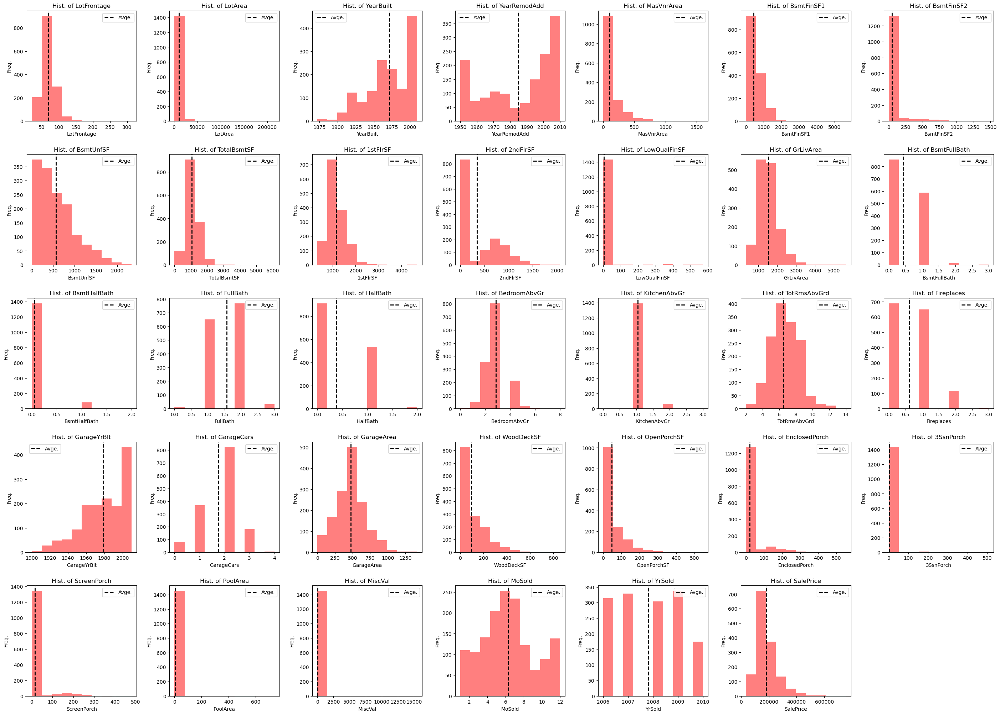

In [43]:
# plotting histogram for numeric features
plt.figure(figsize = (35, 25))
plt.subplots_adjust(hspace = 0.3, wspace = 0.3)
for i in range(len(numeric_features)):
    plt.subplot(5, 7, i+1)
    plt.hist(
        train_df_mean_sub[numeric_features[i]],
        color = 'red', alpha = 0.5
    )
    plt.axvline(
        train_df_mean_sub[numeric_features[i]].mean(),
        color = 'black', linewidth = 2, linestyle = '--',
        label = 'Avge.'
    )
    plt.title(f'Hist. of {numeric_features[i]}')
    plt.xlabel(f'{numeric_features[i]}')
    plt.ylabel('Freq.')
    plt.legend()
plt.show()

In [44]:
# REPORT -->
#             LotFrontage  --  right skewness (True in Society)
#             LotArea      --  right skewness (True in Society)
#             YearBuilt    --  left skewness  (True in Society)
#             YearRemodAdd --  (True in Society)
#             MasVnrArea   --  right skewness (True in Society)
#             BsmtFinSF1   --  right skewness (True in Society)
#             BsmtFinSF2   --  right skewness (True in Society)
#             BsmtUnfSF    --  right skewness (True in Society)
#             TotalBsmtSF  --  right skewness (True in Society)
#             1stFlrSF     --  right skewness (True in Society)
#             2ndFlrSF     --  right skewness (True in Society)
#             LowQualFinSF --  right skewness (True in Society)
#             GrLivArea    --  right skewness (True in Society)
#             BsmtFullBath --  right skewness (True in Society)
#             BsmtHalfBath --  right skewness (True in Society)
#             FullBath     --  (True in Society)
#             HalfBath     --  right skewness (True in Society)
#             BedroomAbvGr --  right skewness (True in Society)
#             KitchenAbvGr --  right skewness (True in Society)
#             TotRmsAbvGrd --  right skewness (True in Society)
#             Fireplaces   --  right skewness (True in Society)
#             GarageYrBlt  --  left skewness  (True in Society)
#             GarageCars   --  (True in Society)
#             GarageArea   --  right skewness (True in Society)
#             WoodDeckSF   --  right skewness (True in Society)
#             OpenPorchSF  --  right skewness (True in Society)
#             EnclosedPorch--  right skewness (True in Society)
#             3SsnPorch    --  right skewness (True in Society)
#             ScreenPorch  --  right skewness (True in Society)
#             PoolArea     --  right skewness (True in Society)
#             MiscVal      --  right skewness (True in Society)
#             MoSold       --  (True in Society)
#             YrSold       --  (True in Society)
#             SalePrice    --  right skewness (True in Society)

In [45]:
# categorical features
categorical_features = train_df_mean_sub.columns.drop(['Id'] + numeric_features)
for feature in categorical_features:
    print(train_df_mean_sub[feature].value_counts())
    print('--' * 20)

MSSubClass
20     536
60     299
50     144
120     87
30      69
160     63
70      60
80      58
90      52
190     30
85      20
75      16
45      12
180     10
40       4
Name: count, dtype: int64
----------------------------------------
MSZoning
RL         1151
RM          218
FV           65
RH           16
C (all)      10
Name: count, dtype: int64
----------------------------------------
Street
Pave    1454
Grvl       6
Name: count, dtype: int64
----------------------------------------
Alley
Grvl    50
Pave    41
Name: count, dtype: int64
----------------------------------------
LotShape
Reg    925
IR1    484
IR2     41
IR3     10
Name: count, dtype: int64
----------------------------------------
LandContour
Lvl    1311
Bnk      63
HLS      50
Low      36
Name: count, dtype: int64
----------------------------------------
Utilities
AllPub    1459
NoSeWa       1
Name: count, dtype: int64
----------------------------------------
LotConfig
Inside     1052
Corner      263
CulDSac   

In [46]:
#Some categories have less than 30 values. Let's fix them.
for cat_feat in categorical_features:
    if cat_feat == 'PoolQC':
        continue
    else:
        start_index = -np.sum(train_df_mean_sub[cat_feat].value_counts() < 30)

        if start_index == 0 or start_index == -1:
            continue
        else:
            train_df_mean_sub.loc[train_df_mean_sub[cat_feat].isin(
                train_df_mean_sub[cat_feat].value_counts()[start_index:].index
            ), cat_feat] = 'other'
        
#Check that our work is done or not.
for feature in categorical_features:
    print(train_df_mean_sub[feature].value_counts())
    print('--' * 20)

MSSubClass
20       536
60       299
50       144
120       87
30        69
160       63
other     62
70        60
80        58
90        52
190       30
Name: count, dtype: int64
----------------------------------------
MSZoning
RL       1151
RM        218
FV         65
other      26
Name: count, dtype: int64
----------------------------------------
Street
Pave    1454
Grvl       6
Name: count, dtype: int64
----------------------------------------
Alley
Grvl    50
Pave    41
Name: count, dtype: int64
----------------------------------------
LotShape
Reg    925
IR1    484
IR2     41
IR3     10
Name: count, dtype: int64
----------------------------------------
LandContour
Lvl    1311
Bnk      63
HLS      50
Low      36
Name: count, dtype: int64
----------------------------------------
Utilities
AllPub    1459
NoSeWa       1
Name: count, dtype: int64
----------------------------------------
LotConfig
Inside     1052
Corner      263
CulDSac      94
FR2          47
FR3           4
Name: co

C:\Users\User\AppData\Local\Temp\ipykernel_12740\668395760.py:11: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'other' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  train_df_mean_sub.loc[train_df_mean_sub[cat_feat].isin(
C:\Users\User\AppData\Local\Temp\ipykernel_12740\668395760.py:11: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'other' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  train_df_mean_sub.loc[train_df_mean_sub[cat_feat].isin(
C:\Users\User\AppData\Local\Temp\ipykernel_12740\668395760.py:11: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'other' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  train_df_mean_s

## Step 5 -- Check & Handle outliers

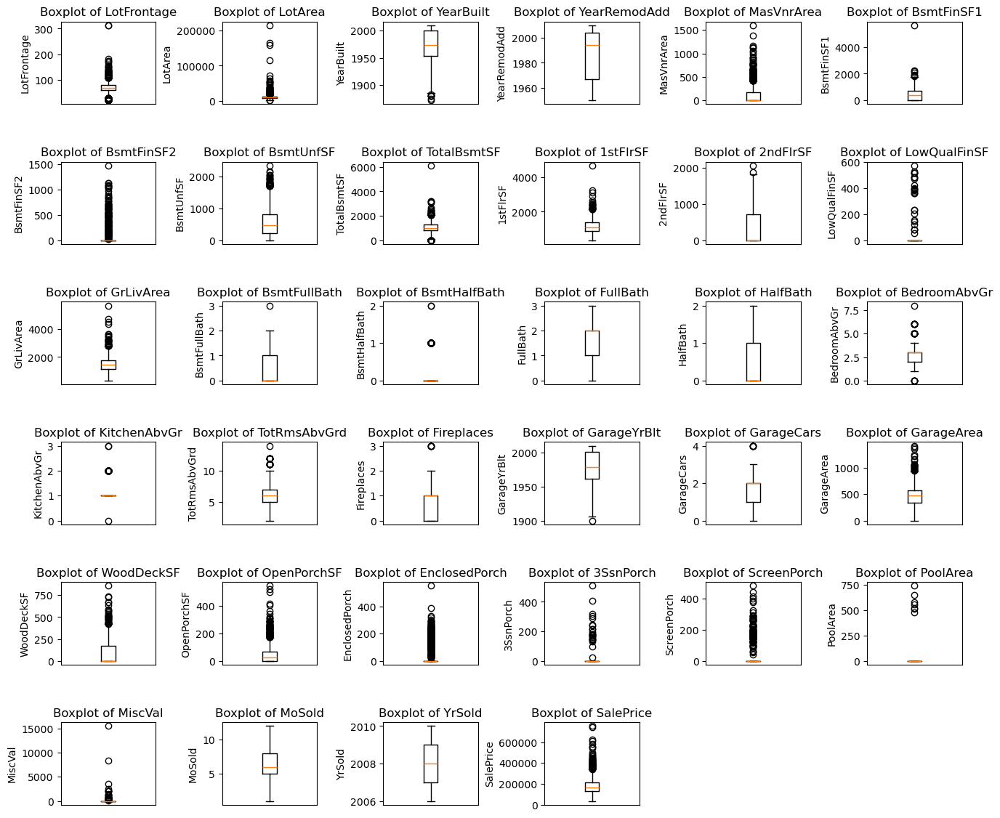

In [47]:
# Because we may have outliers only in numeric features, we just check THEM. (train dataframe)
plt.figure(figsize = (16, 14))
plt.subplots_adjust(hspace = 0.7, wspace = 0.7)
for i in range(len(numeric_features)):
    plt.subplot(6, 6, i+1)
    plt.boxplot(train_df_mean_sub[numeric_features[i]])
    plt.title(f'Boxplot of {numeric_features[i]}')
    plt.ylabel(f'{numeric_features[i]}')
    plt.xticks([])
plt.show()

In [48]:
# REPORT -->
    # We can't see any abnormalities in the boxplots of numeric features.
    # Epecially, for SalePrice that is our dependent variable.

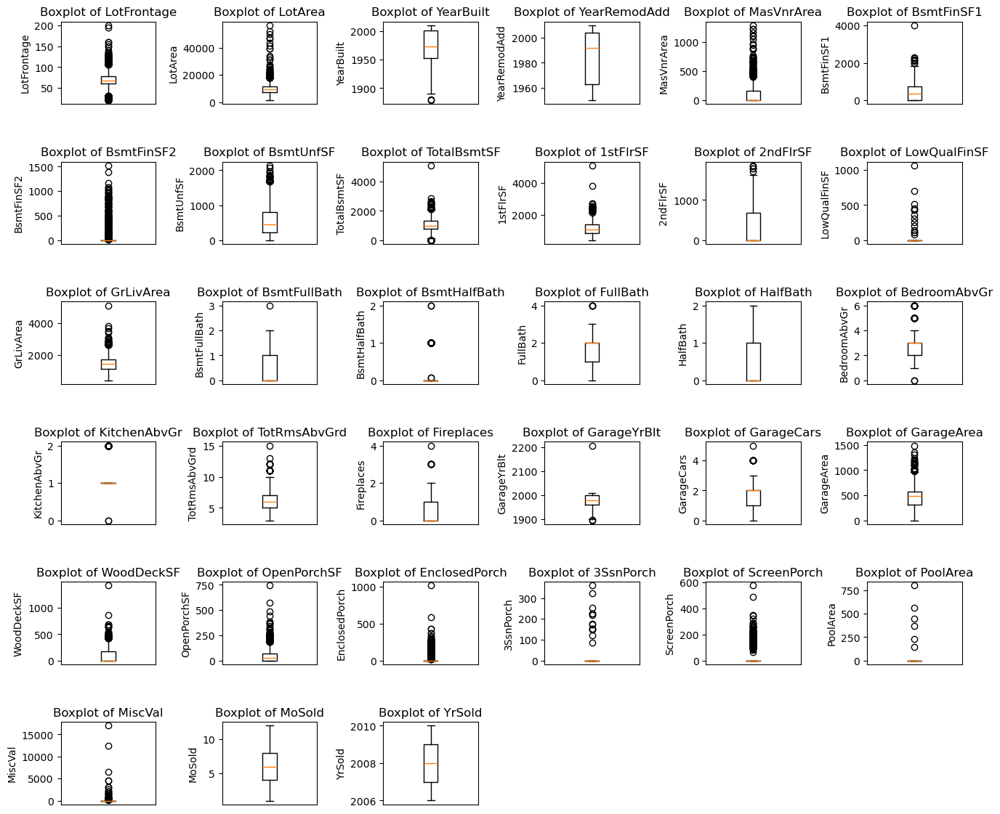

In [49]:
# Because we may have outliers only in numeric features, we just check THEM. (test dataframe)
numeric_features_copy = numeric_features.copy()
numeric_features_copy.pop()

plt.figure(figsize = (16, 14))
plt.subplots_adjust(hspace = 0.7, wspace = 0.7)
for i in range(len(numeric_features_copy)):
    plt.subplot(6, 6, i+1)
    plt.boxplot(test_df_mean_sub[numeric_features_copy[i]])
    plt.title(f'Boxplot of {numeric_features_copy[i]}')
    plt.ylabel(f'{numeric_features_copy[i]}')
    plt.xticks([])
plt.show()

In [50]:
# REPORT -->
    # Like the train dataframe, test dataframe has also no abnormalities.

## Step 6 -- Bivariate Analysis

#### Note : The dependent variable is SalePrice.

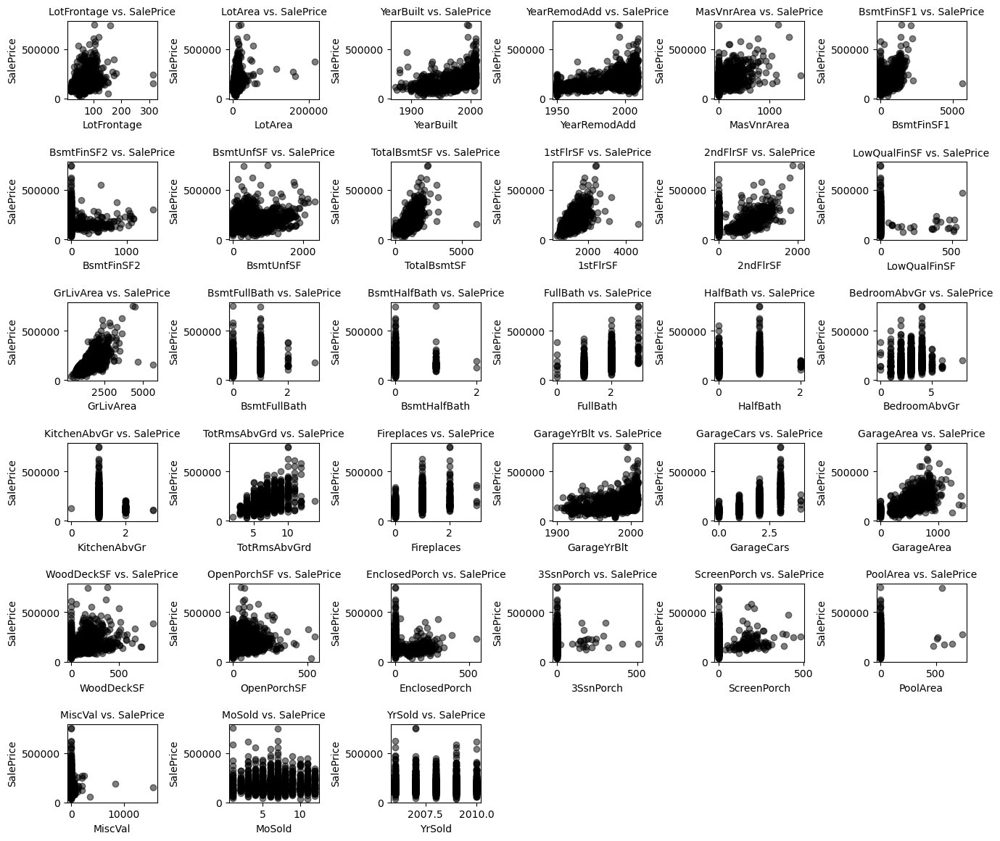

In [51]:
# plotting scatter plot (numeric vs. numeric)
plt.figure(figsize = (16, 14))
plt.subplots_adjust(hspace = 0.8, wspace = 0.8)
for i in range(len(numeric_features)-1):
    plt.subplot(6, 6, i+1)
    plt.scatter(train_df_mean_sub[numeric_features[i]],
                train_df_mean_sub['SalePrice'],
                color = 'black', alpha = 0.5)
    plt.title(f'{numeric_features[i]} vs. SalePrice',
              fontsize = 10)
    plt.xlabel(f'{numeric_features[i]}')
    plt.ylabel('SalePrice')
plt.show()

In [52]:
# calculating pearson coefficient (numeric vs. numeric)
np.round(train_df_mean_sub[numeric_features].corr(method = 'pearson'), 2)

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
LotFrontage,1.00,0.31,0.12,0.08,0.18,0.22,0.04,0.12,0.36,0.41,0.07,0.04,0.37,0.09,-0.01,0.18,0.05,0.24,-0.01,0.32,0.24,0.06,0.27,0.32,0.08,0.14,0.01,0.06,0.04,0.18,0.00,0.01,0.01,0.33
LotArea,0.31,1.00,0.01,0.01,0.10,0.21,0.11,-0.00,0.26,0.30,0.05,0.00,0.26,0.16,0.05,0.13,0.01,0.12,-0.02,0.19,0.27,-0.02,0.15,0.18,0.17,0.08,-0.02,0.02,0.04,0.08,0.04,0.00,-0.01,0.26
YearBuilt,0.12,0.01,1.00,0.59,0.31,0.25,-0.05,0.15,0.39,0.28,0.01,-0.18,0.20,0.19,-0.04,0.47,0.24,-0.07,-0.17,0.10,0.15,0.78,0.54,0.48,0.22,0.19,-0.39,0.03,-0.05,0.00,-0.03,0.01,-0.01,0.52
YearRemodAdd,0.08,0.01,0.59,1.00,0.18,0.13,-0.07,0.18,0.29,0.24,0.14,-0.06,0.29,0.12,-0.01,0.44,0.18,-0.04,-0.15,0.19,0.11,0.62,0.42,0.37,0.21,0.23,-0.19,0.05,-0.04,0.01,-0.01,0.02,0.04,0.51
MasVnrArea,0.18,0.10,0.31,0.18,1.00,0.26,-0.07,0.11,0.36,0.34,0.17,-0.07,0.39,0.09,0.03,0.28,0.20,0.10,-0.04,0.28,0.25,0.25,0.36,0.37,0.16,0.12,-0.11,0.02,0.06,0.01,-0.03,-0.01,-0.01,0.48
BsmtFinSF1,0.22,0.21,0.25,0.13,0.26,1.00,-0.05,-0.50,0.52,0.45,-0.14,-0.06,0.21,0.65,0.07,0.06,0.00,-0.11,-0.08,0.04,0.26,0.15,0.22,0.30,0.20,0.11,-0.10,0.03,0.06,0.14,0.00,-0.02,0.01,0.39
BsmtFinSF2,0.04,0.11,-0.05,-0.07,-0.07,-0.05,1.00,-0.21,0.10,0.10,-0.10,0.01,-0.01,0.16,0.07,-0.08,-0.03,-0.02,-0.04,-0.04,0.05,-0.09,-0.04,-0.02,0.07,0.00,0.04,-0.03,0.09,0.04,0.00,-0.02,0.03,-0.01
BsmtUnfSF,0.12,-0.00,0.15,0.18,0.11,-0.50,-0.21,1.00,0.42,0.32,0.00,0.03,0.24,-0.42,-0.10,0.29,-0.04,0.17,0.03,0.25,0.05,0.19,0.21,0.18,-0.01,0.13,-0.00,0.02,-0.01,-0.04,-0.02,0.03,-0.04,0.21
TotalBsmtSF,0.36,0.26,0.39,0.29,0.36,0.52,0.10,0.42,1.00,0.82,-0.17,-0.03,0.45,0.31,-0.00,0.32,-0.05,0.05,-0.07,0.29,0.34,0.31,0.43,0.49,0.23,0.25,-0.10,0.04,0.08,0.13,-0.02,0.01,-0.01,0.61
1stFlrSF,0.41,0.30,0.28,0.24,0.34,0.45,0.10,0.32,0.82,1.00,-0.20,-0.01,0.57,0.24,0.00,0.38,-0.12,0.13,0.07,0.41,0.41,0.23,0.44,0.49,0.24,0.21,-0.07,0.06,0.09,0.13,-0.02,0.03,-0.01,0.61


In [53]:
# REPORT(based on pearson coeff) -->
#     Tere are some noticable relations between numeric features & SalePrice:

#     SalePrice -->
# 	  YearBuilt 0.52
# 	  YearRemodAdd 0.51
# 	  MasVnrArea 0.48
# 	  BsmtFinSF1 0.39
# 	  TotalBsmtSF 0.61
# 	  1stFlrSF 0.61
# 	  GrLivArea 0.71
# 	  FullBath 0.56
# 	  TotRmsAbvGrd 0.53
# 	  Fireplaces 0.47 
# 	  GarageYrBlt 0.47
# 	  GarageCars 0.64
# 	  GarageArea 0.62

#     And also we can see multicolinearity between some numeric features.

In [54]:
# calculating spearman coefficient (numeric vs. numeric)
np.round(train_df_mean_sub[numeric_features].corr(method = 'spearman'), 2)

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
LotFrontage,1.00,0.57,0.19,0.10,0.26,0.15,0.05,0.10,0.35,0.39,0.05,-0.03,0.34,0.09,-0.01,0.21,0.10,0.29,-0.01,0.33,0.23,0.10,0.34,0.35,0.11,0.16,-0.10,0.05,0.04,0.08,0.02,0.02,0.01,0.39
LotArea,0.57,1.00,0.10,0.08,0.18,0.17,0.07,0.08,0.37,0.44,0.12,-0.02,0.45,0.10,0.05,0.24,0.14,0.34,-0.02,0.41,0.35,0.04,0.34,0.37,0.18,0.18,-0.07,0.06,0.09,0.08,0.06,0.01,-0.03,0.46
YearBuilt,0.19,0.10,1.00,0.68,0.40,0.19,-0.11,0.14,0.43,0.29,0.03,-0.15,0.29,0.16,-0.07,0.54,0.24,-0.04,-0.16,0.18,0.17,0.85,0.60,0.53,0.29,0.39,-0.41,0.02,-0.07,0.01,-0.09,0.02,-0.01,0.65
YearRemodAdd,0.10,0.08,0.68,1.00,0.24,0.06,-0.13,0.18,0.30,0.24,0.07,-0.06,0.28,0.10,-0.03,0.43,0.15,-0.05,-0.15,0.20,0.12,0.70,0.46,0.40,0.23,0.35,-0.24,0.05,-0.05,0.00,-0.09,0.02,0.05,0.57
MasVnrArea,0.26,0.18,0.40,0.24,1.00,0.24,-0.06,0.08,0.36,0.35,0.06,-0.11,0.32,0.12,0.03,0.29,0.17,0.11,-0.05,0.26,0.25,0.30,0.40,0.37,0.17,0.21,-0.18,0.04,0.04,0.00,-0.05,0.02,0.00,0.42
BsmtFinSF1,0.15,0.17,0.19,0.06,0.24,1.00,0.05,-0.57,0.41,0.32,-0.19,-0.08,0.06,0.67,0.09,0.01,-0.01,-0.08,-0.11,-0.05,0.19,0.07,0.18,0.24,0.18,0.08,-0.15,0.05,0.07,0.06,0.01,-0.02,0.02,0.30
BsmtFinSF2,0.05,0.07,-0.11,-0.13,-0.06,0.05,1.00,-0.27,0.07,0.07,-0.10,0.00,-0.05,0.15,0.12,-0.11,-0.05,0.01,-0.04,-0.06,0.03,-0.15,-0.06,-0.01,0.07,-0.07,0.04,-0.02,0.06,0.07,0.03,-0.03,0.03,-0.04
BsmtUnfSF,0.10,0.08,0.14,0.18,0.08,-0.57,-0.27,1.00,0.33,0.22,0.06,0.02,0.25,-0.45,-0.10,0.25,-0.00,0.16,0.00,0.26,0.07,0.19,0.16,0.11,-0.03,0.16,0.04,0.01,-0.01,-0.04,-0.04,0.04,-0.04,0.19
TotalBsmtSF,0.35,0.37,0.43,0.30,0.36,0.41,0.07,0.33,1.00,0.83,-0.29,-0.08,0.37,0.30,0.00,0.33,-0.10,0.06,-0.02,0.23,0.33,0.32,0.46,0.49,0.23,0.27,-0.17,0.05,0.09,0.05,-0.06,0.03,-0.02,0.60
1stFlrSF,0.39,0.44,0.29,0.24,0.35,0.32,0.07,0.22,0.83,1.00,-0.28,-0.04,0.49,0.24,0.02,0.37,-0.15,0.14,0.09,0.36,0.39,0.22,0.45,0.49,0.22,0.23,-0.13,0.06,0.11,0.07,-0.03,0.05,-0.02,0.58


In [55]:
# REPORT(based on spearman coeff) -->
#     There are some noticable relations between numeric features & SalePrice:

#     SalePrice -->
# 	  LotFrontage 0.39
# 	  LotArea 0.46
# 	  YearBuilt 0.65
# 	  YearRemodAdd 0.57
# 	  MasVnrArea 0.42
# 	  TotalBsmtSF 0.60
# 	  1stFlrSF 0.58
# 	  GrLivArea 0.73
# 	  FullBath 0.64
# 	  TotRmsAbvGrd 0.53
# 	  Fireplaces 0.52
# 	  GarageYrBlt 0.57
# 	  GarageCars 0.69
# 	  GarageArea 0.65
# 	  OpenPorchSF 0.48

#     And alse, we can see multicolinearity between some numeric features.

In [56]:
# check the relation between different types of features (numeric vs. categorical)
for cat_feat in categorical_features:
    for num_feat in numeric_features:
        print(np.round(train_df_mean_sub.groupby(cat_feat)[num_feat].mean(), 2))
        print('--' * 20)

MSSubClass
20       76.10
30       61.19
50       64.67
60       78.52
70       66.02
80       76.59
90       71.45
120      51.28
160      33.29
190      67.00
other    61.09
Name: LotFrontage, dtype: float64
----------------------------------------
MSSubClass
20       11755.51
30        7888.49
50       10479.15
60       12058.08
70       10120.17
80       10895.48
90        9720.06
120       5383.95
160       2699.33
190      16111.23
other     8525.13
Name: LotArea, dtype: float64
----------------------------------------
MSSubClass
20       1977.96
30       1926.64
50       1935.83
60       1994.49
70       1918.83
80       1974.28
90       1967.17
120      1999.01
160      1987.27
190      1928.23
other    1950.35
Name: YearBuilt, dtype: float64
----------------------------------------
MSSubClass
20       1985.88
30       1968.87
50       1969.85
60       1996.33
70       1977.87
80       1982.16
90       1970.27
120      1999.34
160      1988.59
190      1971.63
other    1977.34


In [57]:
# REPORT -->
#     Approximately, all of the categorical features affect the average of SalePrice.
#     We can also see this effect on other numeric features, too.

In [58]:
# check the relation between different categorical features by cross tabulation (catgorical vs. catgorical)
for cat_feat in categorical_features:
    for cat_feat2 in categorical_features:
        print(np.round(pd.crosstab(train_df_mean_sub[cat_feat],
                             train_df_mean_sub[cat_feat2],
                             normalize = 'columns'), 2))
        print('--' * 20)

MSSubClass   20   30   50   60   70   80   90  120  160  190  other
MSSubClass                                                         
20          1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0    0.0
30          0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0    0.0
50          0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0    0.0
60          0.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0    0.0
70          0.0  0.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0    0.0
80          0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0    0.0
90          0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  0.0    0.0
120         0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0    0.0
160         0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0  0.0    0.0
190         0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0    0.0
other       0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0    1.0
----------------------------------------
MSZoning      FV    RL    RM  other
MSSubClass                         
20 

In [59]:
# REPORT -->
#     Most categorical features have a relationship (strong or weak) with each other.

## Build predictive models

In [60]:
#Because we do not have the response variable in the test dataframe,
#we should split the train dataframe into train & test.
#We just use the main test dataframe for our best model to get predicted.
from sklearn.model_selection import train_test_split
train, test = train_test_split(train_df_mean_sub, test_size = 0.2, random_state = 123)
print(train.shape)
print(test.shape)

(1168, 81)
(292, 81)


In [61]:
#Create dummy variables for categorical varibales
dummy_vars = pd.get_dummies(train[categorical_features])
dummy_vars.info(verbose = True) #We set verbose = True to show all results

<class 'pandas.core.frame.DataFrame'>
Index: 1168 entries, 318 to 1389
Data columns (total 199 columns):
 #    Column                 Dtype
---   ------                 -----
 0    MSSubClass_20          bool 
 1    MSSubClass_30          bool 
 2    MSSubClass_50          bool 
 3    MSSubClass_60          bool 
 4    MSSubClass_70          bool 
 5    MSSubClass_80          bool 
 6    MSSubClass_90          bool 
 7    MSSubClass_120         bool 
 8    MSSubClass_160         bool 
 9    MSSubClass_190         bool 
 10   MSSubClass_other       bool 
 11   MSZoning_FV            bool 
 12   MSZoning_RL            bool 
 13   MSZoning_RM            bool 
 14   MSZoning_other         bool 
 15   Street_Grvl            bool 
 16   Street_Pave            bool 
 17   Alley_Grvl             bool 
 18   Alley_Pave             bool 
 19   LotShape_IR1           bool 
 20   LotShape_IR2           bool 
 21   LotShape_IR3           bool 
 22   LotShape_Reg           bool 
 23   LandContour_Bn

In [62]:
dummy_vars.head()

,MSSubClass_20,MSSubClass_30,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_80,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_190,MSSubClass_other,MSZoning_FV,MSZoning_RL,MSZoning_RM,MSZoning_other,Street_Grvl,Street_Pave,Alley_Grvl,Alley_Pave,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_AllPub,Utilities_NoSeWa,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Gtl,LandSlope_Mod,LandSlope_Sev,Neighborhood_BrkSide,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_Sawyer,...,CentralAir_N,CentralAir_Y,Electrical_FuseA,Electrical_SBrkr,Electrical_other,KitchenQual_Ex,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Min1,Functional_Min2,Functional_Typ,Functional_other,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_TA,FireplaceQu_other,GarageType_Attchd,GarageType_BuiltIn,GarageType_Detchd,GarageType_other,GarageFinish_Fin,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_TA,GarageQual_other,GarageCond_Fa,GarageCond_TA,GarageCond_other,PavedDrive_N,PavedDrive_P,PavedDrive_Y,PoolQC_Ex,PoolQC_Fa,PoolQC_Gd,Fence_GdPrv,Fence_GdWo,Fence_MnPrv,Fence_MnWw,MiscFeature_Shed,MiscFeature_other,SaleType_COD,SaleType_New,SaleType_WD,SaleType_other,SaleCondition_Abnorml,SaleCondition_Normal,SaleCondition_Partial,SaleCondition_other
318,False,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,True,False,False,False,False,False,True,False,False,True,False,True,False,False,False,False,False,True,False,True,False,False,False,False,False,False,False,False,False,False,True,False,False,False,...,False,True,False,True,False,False,False,True,False,False,False,True,False,False,False,True,False,True,False,False,False,False,True,False,False,True,False,False,True,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,True,False,False
580,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,True,False,False,True,False,False,False,False,False,False,True,True,False,False,True,False,False,False,True,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,...,False,True,False,True,False,False,False,True,False,False,False,True,False,False,True,False,False,True,False,False,False,False,False,True,False,True,False,False,True,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,True,False,False
961,False,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,True,False,False,True,False,False,False,False,False,False,True,True,False,True,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,...,False,True,False,True,False,False,False,False,True,False,False,True,False,False,False,True,False,True,False,False,False,True,False,False,False,True,False,False,True,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,True,False,False
78,False,False,False,False,False,False,True,False,False,False,False,False,True,False,False,False,True,False,False,False,False,False,True,False,False,False,True,True,False,False,False,False,False,True,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,...,True,False,False,True,False,False,False,False,True,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,True,False,False
5,False,False,True,False,False,False,False,False,False,False,False,False,True,Fal

In [63]:
#Define base level for each categorical variable
#The list below also contains the varibales that are not in the test.
dummy_vars.drop(columns = ['MSSubClass_20', 'MSZoning_FV', 'Street_Pave',
                           'Alley_Grvl', 'LotShape_IR1', 'LandContour_Bnk',
                           'Utilities_AllPub', 'LotConfig_Corner', 'LandSlope_Gtl',
                           'Neighborhood_BrkSide', 'Condition1_Artery', 'Condition2_Norm',
                           'BldgType_1Fam', 'HouseStyle_1.5Fin', 'OverallQual_4',
                           'OverallCond_4', 'RoofStyle_Gable', 'RoofMatl_CompShg',
                           'Exterior1st_BrkFace', 'Exterior2nd_CmentBd', 'MasVnrType_BrkCmn',
                           'ExterQual_Ex', 'ExterCond_Gd', 'Foundation_BrkTil',
                           'BsmtQual_Ex', 'BsmtCond_Fa', 'BsmtExposure_Av',
                           'BsmtFinType1_ALQ', 'BsmtFinType2_BLQ', 'Heating_GasA',
                           'HeatingQC_Ex', 'CentralAir_N', 'Electrical_FuseA',
                           'KitchenQual_Ex', 'Functional_Min1', 'FireplaceQu_Fa',
                           'GarageType_Attchd', 'GarageFinish_Fin', 'GarageQual_Fa',
                           'GarageCond_Fa', 'PavedDrive_N', 'BsmtCond_Po',
                           'Fence_GdPrv', 'MiscFeature_Shed', 'SaleType_COD',
                           'SaleCondition_Abnorml', 'Condition2_other', 'HeatingQC_Po',
                           'PoolQC_Ex', 'PoolQC_Fa', 'PoolQC_Gd',
                           'Street_Grvl', 'Utilities_NoSeWa'], inplace = True)

dummy_vars.info(verbose = True)

<class 'pandas.core.frame.DataFrame'>
Index: 1168 entries, 318 to 1389
Data columns (total 146 columns):
 #    Column                 Dtype
---   ------                 -----
 0    MSSubClass_30          bool 
 1    MSSubClass_50          bool 
 2    MSSubClass_60          bool 
 3    MSSubClass_70          bool 
 4    MSSubClass_80          bool 
 5    MSSubClass_90          bool 
 6    MSSubClass_120         bool 
 7    MSSubClass_160         bool 
 8    MSSubClass_190         bool 
 9    MSSubClass_other       bool 
 10   MSZoning_RL            bool 
 11   MSZoning_RM            bool 
 12   MSZoning_other         bool 
 13   Alley_Pave             bool 
 14   LotShape_IR2           bool 
 15   LotShape_IR3           bool 
 16   LotShape_Reg           bool 
 17   LandContour_HLS        bool 
 18   LandContour_Low        bool 
 19   LandContour_Lvl        bool 
 20   LotConfig_CulDSac      bool 
 21   LotConfig_FR2          bool 
 22   LotConfig_FR3          bool 
 23   LotConfig_Insi

In [64]:
#Define feature matrix
numeric_features_copy = numeric_features.copy()
numeric_features_copy.pop()
X_ = train[numeric_features_copy]
X_train = pd.concat([X_, dummy_vars], axis = 1)
X_train.head()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSSubClass_30,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_80,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_190,MSSubClass_other,MSZoning_RL,MSZoning_RM,MSZoning_other,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,...,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,BsmtFinType2_other,Heating_other,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_TA,CentralAir_Y,Electrical_SBrkr,Electrical_other,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Min2,Functional_Typ,Functional_other,FireplaceQu_Gd,FireplaceQu_TA,FireplaceQu_other,GarageType_BuiltIn,GarageType_Detchd,GarageType_other,GarageFinish_RFn,GarageFinish_Unf,GarageQual_TA,GarageQual_other,GarageCond_TA,GarageCond_other,PavedDrive_P,PavedDrive_Y,Fence_GdWo,Fence_MnPrv,Fence_MnWw,MiscFeature_other,SaleType_New,SaleType_WD,SaleType_other,SaleCondition_Normal,SaleCondition_Partial,SaleCondition_other
318,90.000000,9900,1993,1993,256.0,987,0,360,1347,1372,1274,0,2646,1,0,2,1,4,1,9,1,1993.000000,3,656,340,60,144,0,0,0,0,4,2009,False,False,True,False,False,False,False,False,False,False,True,False,False,False,False,False,True,...,True,True,False,False,False,True,False,False,False,False,False,True,False,False,False,False,False,True,True,False,False,True,False,False,True,False,False,True,False,False,False,False,True,False,True,False,True,False,False,True,False,False,False,False,False,True,False,True,False,False
580,70.049958,14585,1960,1987,85.0,594,219,331,1144,1429,0,0,1429,0,1,1,0,3,1,7,2,1960.000000,2,572,216,110,0,0,0,0,0,6,2007,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,...,True,False,False,True,True,False,False,False,False,False,True,False,False,False,False,False,False,True,True,False,False,True,False,False,True,False,True,False,False,False,False,False,False,True,True,False,True,False,False,True,False,False,False,False,False,True,False,True,False,False
961,70.049958,12227,1977,1995,424.0,896,0,434,1330,1542,1330,0,2872,1,0,2,1,4,1,11,1,1977.000000,2,619,550,282,0,0,0,0,0,7,2008,False,False,True,False,False,False,False,False,False,False,True,False,False,False,False,False,False,...,False,False,False,True,False,False,False,False,False,False,False,True,False,False,False,False,True,True,True,False,False,False,True,False,True,False,False,True,False,False,False,False,False,False,True,False,True,False,False,True,False,False,False,False,False,True,False,True,False,False
78,72.000000,10778,1968,1968,0.0,0,0,1768,1768,1768,0,0,1768,0,0,2,0,4,2,8,0,1978.506164,0,0,0,0,0,0,0,0,0,4,2010,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,True,...,True,False,False,True,False,False,False,False,True,False,False,True,False,False,False,False,True,False,True,False,False,False,True,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,True,False,True,False,False
5,85.000000,14115,1993,1995,0.0,732,0,64,796,796,566,0,1362,1,0,1,1,1,1,5,0,1993.000000,2,480,40,30,0,320,0,0,700,10,2009,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,...,True,False,False,True,False,True,False,False,False,False,False,True,False,False,False,False,False,True,True,False,False,False,True,False,True,False,False,False,False,False,False,False,False,True,True,False,True,False,False,True,False,True,False,False,False,True,False,True,False,False


In [65]:
#Define response matrix
y_train = train['SalePrice']
print(y_train)

318     260000
580     181900
961     272000
78      136500
5       143000
793     225000
1425    142000
1392    123000
585     369900
876     132250
1342    228500
85      260000
994     337500
853     158000
1109    280000
1338    200000
834     139950
594     110000
327     145250
1052    165000
1077    138800
1316    295493
346     151500
1361    260000
1209    290000
1102    135000
850     131500
134     180000
1324    147000
457     256000
659     167000
72      185000
306     225000
1416    122500
184     127000
738     179000
501     226700
704     213000
209     145000
1299    154000
458     161000
1288    278000
1039     80000
1205    271900
792     269790
1451    287090
145     130000
136     143000
410      60000
178     501837
130     226000
1438    149700
517     265000
1436    120500
547     129500
556     141000
1170    171000
587     137000
328     214500
1429    182900
66      180000
714     130500
240     262500
246     137000
81      153500
120     180000
841     15

In [66]:
#Linear regression - model 1
from sklearn.linear_model import LinearRegression
#Create linear regression model
model_1 = LinearRegression()
#Fit the linear regressor on the train
model_1.fit(X_train, y_train)
#Linear regression coefficients
print(model_1.coef_)
print(model_1.intercept_)

[-2.02196897e+02  5.64642541e-01  1.96200851e+02  8.52412764e+01
  2.33734568e+00  5.84787420e-01  8.12413564e+00 -4.41916257e+00
  4.28975359e+00  2.23773073e+01  4.10246804e+01 -3.73813829e+01
  2.60206333e+01  4.79952942e+03  4.07224834e+03  7.28007129e+03
  1.52299568e+03 -4.23294470e+03 -1.97725253e+04  2.12502989e+03
  4.46768030e+03  4.37446720e+01  1.67454184e+04 -2.42566002e+01
  1.05538738e+01  4.84997357e+00  1.27603570e+01  4.50573659e+01
  2.83998577e+01  3.44820117e+01  1.77588078e+00 -1.06803311e+02
 -5.16196497e+02 -6.57058882e+03  2.88607211e+03 -4.60101981e+03
  5.53054093e+03  7.82674725e+03 -1.27627471e+03 -4.74189051e+03
 -1.92328969e+03 -2.93248094e+04 -7.57964495e+03 -7.50529912e+03
 -8.59859005e+03 -2.56852562e+04  9.96245973e+02  6.13276551e+03
 -3.19680429e+04  7.98875508e+02  3.15981671e+04  1.49657997e+04
  2.13678795e+04  5.96157559e+03 -1.16290579e+04 -7.97856495e+03
 -2.58262325e+03  6.80389028e+03 -1.54170194e+04 -1.67480985e+03
  1.74192288e+04 -1.82643

In [67]:
#Predict the response in the train
y_train_pred_1 = model_1.predict(X_train)

#Calculate residuals
res_1 = y_train - y_train_pred_1

from sklearn.metrics import root_mean_squared_error, mean_absolute_percentage_error, r2_score
#The root mean squared error
print(f'RMSE: {root_mean_squared_error(y_train, y_train_pred_1):.3f}')
#The mean absolute percentage error
print(f'MAPE: {mean_absolute_percentage_error(y_train, y_train_pred_1) * 100:.3f}')
#The coefficinet of determination
print(f'R2: {r2_score(y_train, y_train_pred_1):.3f}')

RMSE: 26727.804
MAPE: 9.879
R2: 0.887


In [68]:
#Function to plot histogram of residuals
def hist_residuals(res, bins = 50):
    #Calculate density
    from scipy import stats
    density = stats.gaussian_kde(res)
    xp = np.linspace(np.min(res), np.max(res), 100)
    yp = density.pdf(xp)

    #Histogram
    plt.hist(res, bins = bins,
             color = 'red', alpha = 0.7, density = True)
    plt.axvline(np.mean(res), color = 'black',
                linewidth = 2, linestyle = '--', label = 'Average')
    plt.title('Histogram of Residuals')
    plt.xlabel('Residuals')
    plt.ylabel('Density')
    plt.plot(xp, yp, color = 'black', linewidth = 2)
    plt.legend()

    return plt.show()

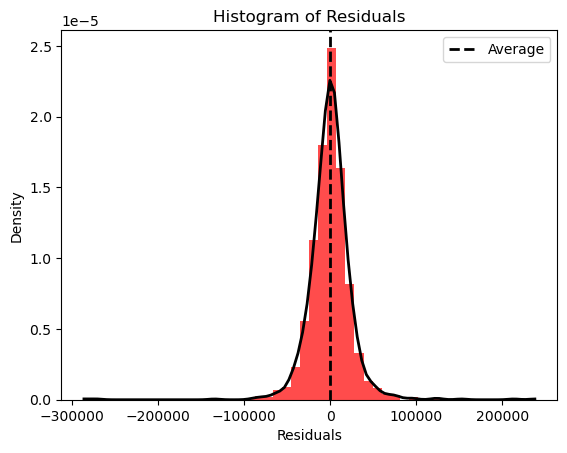

In [69]:
#Histogram of residuals - model 1
hist_residuals(res_1)

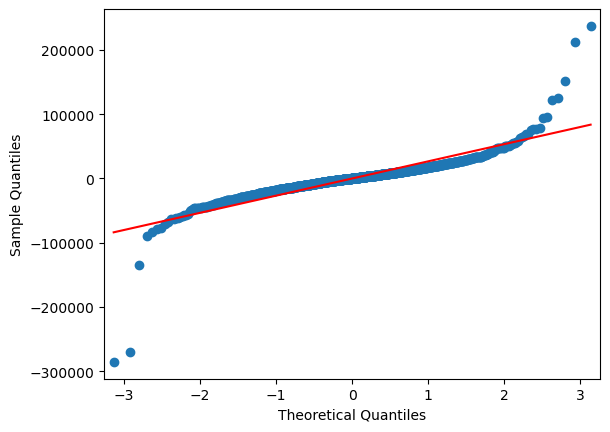

In [70]:
#QQ-plot - model 1
import statsmodels.api as sm
sm.qqplot(res_1, line = 's')
plt.show()

In [71]:
#Function to plot residuals vs. fitted values
def residuals_fittedvalues_plot(res, fitted_values):
    #Implement Lowess algorithm
    lowess_res = sm.nonparametric.lowess(res, fitted_values)

    #Scatter plot: residuals vs. fitted values
    plt.scatter(x = fitted_values, y = res,
                color = 'red', alpha = 0.7, label = 'data')
    plt.title('Residuals vs. Fitted values')
    plt.xlabel('Fitted Values', fontsize = 12)
    plt.ylabel('Residuals', fontsize = 12)
    plt.grid()

    #Add LOWESS line
    plt.plot(lowess_res[:, 0], lowess_res[:, 1], 'black',
             alpha = 0.8, linewidth = 2, label = 'LOWESS')
    plt.legend()

    return plt.show()

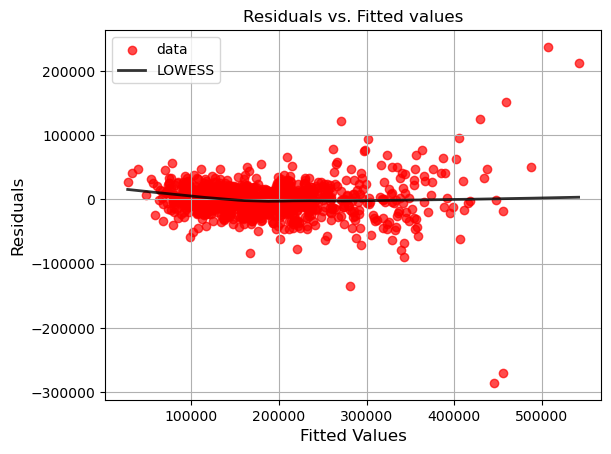

In [72]:
#Scatter plot of residuals vs. fitted values - model 1
residuals_fittedvalues_plot(res_1, y_train_pred_1)

In [73]:
#Predict the response in the test - model 1

#Create dummy variables for categorical variables in the test
dummy_vars = pd.get_dummies(test[categorical_features])

#Define base level for each categorical variable
dummy_vars.drop(columns = ['MSSubClass_20', 'MSZoning_FV', 'Street_Pave',
                           'Alley_Grvl', 'LotShape_IR1', 'LandContour_Bnk',
                           'Utilities_AllPub', 'LotConfig_Corner', 'LandSlope_Gtl',
                           'Neighborhood_BrkSide', 'Condition1_Artery', 'Condition2_Norm',
                           'BldgType_1Fam', 'HouseStyle_1.5Fin', 'OverallQual_4',
                           'OverallCond_4', 'RoofStyle_Gable', 'RoofMatl_CompShg',
                           'Exterior1st_BrkFace', 'Exterior2nd_CmentBd', 'MasVnrType_BrkCmn',
                           'ExterQual_Ex', 'ExterCond_Gd', 'Foundation_BrkTil',
                           'BsmtQual_Ex', 'BsmtCond_Fa', 'BsmtExposure_Av',
                           'BsmtFinType1_ALQ', 'BsmtFinType2_BLQ', 'Heating_GasA',
                           'HeatingQC_Ex', 'CentralAir_N', 'Electrical_FuseA',
                           'KitchenQual_Ex', 'Functional_Min1', 'FireplaceQu_Fa',
                           'GarageType_Attchd', 'GarageFinish_Fin', 'GarageQual_Fa',
                           'GarageCond_Fa', 'PavedDrive_N',
                           'Fence_GdPrv', 'MiscFeature_Shed', 'SaleType_COD',
                           'SaleCondition_Abnorml'], inplace = True)

#Define feature matrix
numeric_features_copy = numeric_features.copy()
numeric_features_copy.pop()
X_ = test[numeric_features_copy]
X_test = pd.concat([X_, dummy_vars], axis = 1)

#Prediction
y_test_pred_1 = model_1.predict(X_test)

In [74]:
#Absolute error
abs_err_1 = abs(test['SalePrice'] - y_test_pred_1)

#RMSE, MAPE, MAE, and median, sd, IQR, max, min of absolute errors
from scipy.stats import iqr
models_comp = pd.DataFrame({'RMSE': root_mean_squared_error(test['SalePrice'], y_test_pred_1),
                            'MAPE': mean_absolute_percentage_error(test['SalePrice'], y_test_pred_1) * 100,
                            'MAE': abs_err_1.mean(),
                            'Median of AbsErrors': abs_err_1.median(),
                            'SD of AbsErrors': abs_err_1.std(),
                            'IQR of AbsErrors': iqr(abs_err_1),
                            'Min of AbsErrors': abs_err_1.min(),
                            'Max of AbsErrors': abs_err_1.max()},
                           index = ['LM - All Features'])
models_comp

,RMSE,MAPE,MAE,Median of AbsErrors,SD of AbsErrors,IQR of AbsErrors,Min of AbsErrors,Max of AbsErrors
LM - All Features,29282.684282,10.733316,18775.295556,13880.897344,22509.978822,17147.915622,138.041211,174018.911675


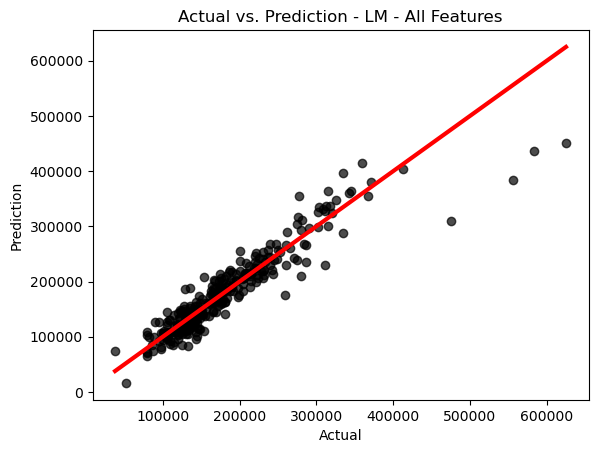

In [75]:
#Plot actual vs. prediction - Test
plt.scatter(test['SalePrice'], y_test_pred_1, c = 'black', alpha = 0.7)
plt.xlabel('Actual')
plt.ylabel('Prediction')
plt.title('Actual vs. Prediction - LM - All Features')
#Add 45 degree line
xp = np.linspace(test['SalePrice'].min() - 0.2, test['SalePrice'].max() + 0.2, 100)
plt.plot(xp, xp, c = 'red', linewidth = 3)
plt.show()

In [76]:
#Because the response is right skewed, we can use -->
#Box-Cox transformation
from sklearn.preprocessing import PowerTransformer
boxcox = PowerTransformer(method = 'box-cox')
boxcox.fit(y_train.values.reshape(-1, 1))
print(boxcox.lambdas_)

[-0.06284094]


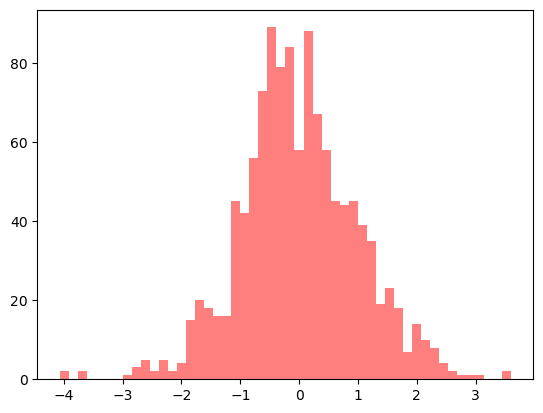

In [77]:
trans_y_train = boxcox.fit_transform(y_train.values.reshape(-1, 1))
plt.hist(trans_y_train, color = 'red', alpha = 0.5, bins = 50)
plt.show()

In [78]:
#Linear regression w/ Box-Cox transformation - model 2
from sklearn.linear_model import LinearRegression
#Create linear regression model
model_2 = LinearRegression()
#Fit the linear regressor on the train
model_2.fit(X_train, trans_y_train)
#Linear regression coefficients
print(model_2.coef_)
print(model_2.intercept_)

[[-1.01316241e-03  4.18860972e-06  1.87236144e-03  2.69217674e-03
  -7.08131437e-05 -5.03933843e-05  1.30691174e-04 -3.62060450e-05
   4.40917714e-05  2.22089646e-04  2.41433327e-04 -1.24126072e-04
   3.39396790e-04  1.07035619e-01  5.12894583e-02  1.27478500e-01
   6.67558825e-02 -4.47358734e-03 -1.80495171e-01  2.72854120e-02
   4.01664751e-02 -2.50512919e-04  1.65666740e-01 -2.67545127e-05
   2.97718231e-04  1.99311038e-04  8.97600127e-05  3.36682879e-04
   5.72255692e-04  6.22361290e-05  4.06724037e-05  1.96993250e-04
  -1.50843771e-02 -2.08008442e-01  8.77135931e-02 -1.50503890e-01
   6.19269509e-02 -2.27278173e-02  3.78348617e-03  2.30768875e-01
  -2.93230442e-02 -2.16404544e-01 -7.58706290e-02 -1.31133117e-01
  -1.44106661e-01 -5.28239099e-01  1.10966210e-01  5.38348879e-02
  -3.40524528e-01  8.34519530e-03  2.46319610e-01  1.19300459e-01
   1.34296938e-01  7.70555257e-02 -1.08921004e-01 -1.37261499e-01
  -4.14739840e-02  4.17667768e-02  2.29893460e-02  2.31643179e-02
   3.03941

In [79]:
#Predict the response in the train
y_train_pred_2 = model_2.predict(X_train)
#Inverse transformation of predicted values
y_train_pred_2 = pd.Series(boxcox.inverse_transform(y_train_pred_2.reshape(-1, 1)).reshape(-1))

from sklearn.metrics import root_mean_squared_error, mean_absolute_percentage_error, r2_score
#The root mean squared error
print(f'RMSE: {root_mean_squared_error(y_train, y_train_pred_2):.3f}')
#The mean absolute percentage error
print(f'MAPE: {mean_absolute_percentage_error(y_train, y_train_pred_2) * 100:.3f}')
#The coefficinet of determination
print(f'R2: {r2_score(y_train, y_train_pred_2):.3f}')

RMSE: 27045.896
MAPE: 8.492
R2: 0.885


In [80]:
#Predict the response in the test - model 2
y_test_pred_2 = model_2.predict(X_test)
#Invesre transformation of predicted values
y_test_pred_2 = pd.Series(boxcox.inverse_transform(y_test_pred_2.reshape(-1, 1)).reshape(-1),
                          index = test.index)

#Absolute error
abs_err_2 = abs(test['SalePrice'] - y_test_pred_2)

#RMSE, MAPE, MAE, and median, sd, IQR, max, min of absolute errors
from scipy.stats import iqr
models_comp = pd.concat([models_comp,
                         pd.DataFrame({'RMSE': root_mean_squared_error(test['SalePrice'], y_test_pred_2),
                                       'MAPE': mean_absolute_percentage_error(test['SalePrice'], y_test_pred_2) * 100,
                                       'MAE': abs_err_2.mean(),
                                       'Median of AbsErrors': abs_err_2.median(),
                                       'SD of AbsErrors': abs_err_2.std(),
                                       'IQR of AbsErrors': iqr(abs_err_2),
                                       'Min of AbsErrors': abs_err_2.min(),
                                       'Max of AbsErrors': abs_err_2.max()},
                                      index = ['LM - All Feature - Box Cox'])])
models_comp

,RMSE,MAPE,MAE,Median of AbsErrors,SD of AbsErrors,IQR of AbsErrors,Min of AbsErrors,Max of AbsErrors
LM - All Features,29282.684282,10.733316,18775.295556,13880.897344,22509.978822,17147.915622,138.041211,174018.911675
LM - All Feature - Box Cox,28136.099473,8.605331,16088.166086,10847.570106,23122.326250,13575.343382,4.302193,221671.482123


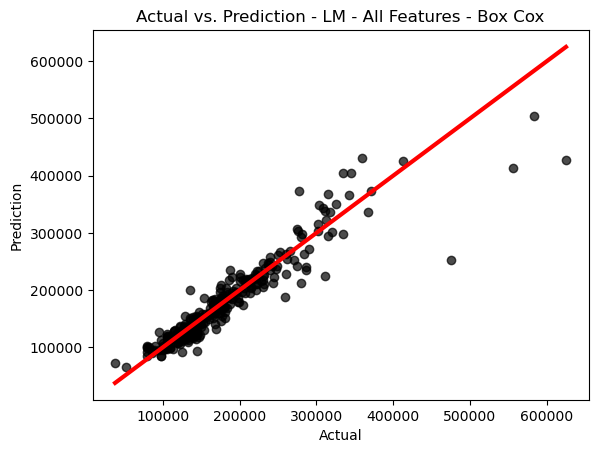

In [81]:
#Plot actual vs. prediction - Test
plt.scatter(test['SalePrice'], y_test_pred_2, c = 'black', alpha = 0.7)
plt.xlabel('Actual')
plt.ylabel('Prediction')
plt.title('Actual vs. Prediction - LM - All Features - Box Cox')
#Add 45 degree line
xp = np.linspace(test['SalePrice'].min() - 0.2, test['SalePrice'].max() + 0.2, 100)
plt.plot(xp, xp, c = 'red', linewidth = 3)
plt.show()

In [82]:
#Scale data
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)

In [83]:
#Feature selection
from sklearn.feature_selection import RFECV
rfe = RFECV(LinearRegression(), cv = 10, scoring = 'neg_root_mean_squared_error')
rfe.fit(X_train_scaled, trans_y_train)

#Selected features indices
selected_features_ind = np.where(rfe.support_)
print(selected_features_ind)

(array([  1,   2,   3,   6,   9,  10,  12,  13,  15,  16,  18,  19,  20,
        22,  24,  28,  33,  35,  39,  41,  43,  44,  45,  48,  53,  60,
        61,  63,  67,  68,  69,  72,  74,  76,  78,  80,  81,  82,  87,
        88,  89,  90,  91,  93,  94,  95,  96, 101, 102, 104, 105, 106,
       107, 109, 117, 118, 119, 123, 128, 129, 130, 137, 140, 146, 150,
       151, 154, 173, 176]),)


In [84]:
#Check dataframe columns
X_train.info(verbose = True)

<class 'pandas.core.frame.DataFrame'>
Index: 1168 entries, 318 to 1389
Data columns (total 179 columns):
 #    Column                 Dtype  
---   ------                 -----  
 0    LotFrontage            float64
 1    LotArea                int64  
 2    YearBuilt              int64  
 3    YearRemodAdd           int64  
 4    MasVnrArea             float64
 5    BsmtFinSF1             int64  
 6    BsmtFinSF2             int64  
 7    BsmtUnfSF              int64  
 8    TotalBsmtSF            int64  
 9    1stFlrSF               int64  
 10   2ndFlrSF               int64  
 11   LowQualFinSF           int64  
 12   GrLivArea              int64  
 13   BsmtFullBath           int64  
 14   BsmtHalfBath           int64  
 15   FullBath               int64  
 16   HalfBath               int64  
 17   BedroomAbvGr           int64  
 18   KitchenAbvGr           int64  
 19   TotRmsAbvGrd           int64  
 20   Fireplaces             int64  
 21   GarageYrBlt            float64
 22   G

In [85]:
#Linear regression w/ selected features and Box Cox transformation - model 3
from sklearn.linear_model import LinearRegression
#Create linear regression model
model_3 = LinearRegression()
#Fit the linear regressor on the train
model_3.fit(X_train_scaled[:, selected_features_ind[0]], trans_y_train)
#Linear regression coefficinets
print(model_3.coef_)
print(model_3.intercept_)

[[ 0.03591563  0.08537167  0.06023181  0.03370751  0.15211178  0.15673963
   0.09933075  0.05760381  0.06831552  0.03034346 -0.04520181  0.04249024
   0.04544299  0.12518047  0.03756192  0.02800853 -0.05599696 -0.04762019
   0.06470089 -0.02599561 -0.05925361 -0.0551682  -0.06700501 -0.03422058
   0.03519855  0.06505839 -0.0305956  -0.0305266   0.03347872  0.07152329
  -0.02829444  0.03496693  0.03325009  0.04530712  0.03176814 -0.10314791
  -0.13498523  0.03316346  0.05898482  0.11457075  0.145752    0.17369021
   0.10739275  0.039164    0.07551659  0.08889486  0.05320432 -0.03934147
  -0.06732726 -0.03427494 -0.06726183 -0.07045807 -0.06010402 -0.04706742
  -0.05475859 -0.10023607 -0.15882088  0.03795599  0.04470323  0.0581528
   0.05221125 -0.05200945  0.04027422  0.05675782 -0.06243651 -0.07290228
  -0.0552372   0.05608552  0.05781193]]
[3.71595492e-15]


In [86]:
#Predict the response in the train
y_train_pred_3 = model_3.predict(X_train_scaled[:, selected_features_ind[0]])
#Inverse transformation of predicted values
y_train_pred_3 = pd.Series(boxcox.inverse_transform(y_train_pred_3.reshape(-1, 1)).reshape(-1))

from sklearn.metrics import root_mean_squared_error, mean_absolute_percentage_error, r2_score
#The root mean squared error
print(f'RMSE: {root_mean_squared_error(y_train, y_train_pred_3):.3f}')
#MAPE
print(f'MAPE: {mean_absolute_percentage_error(y_train, y_train_pred_3) * 100:.3f}')
#The coefficinet of determination
print(f'R2: {r2_score(y_train, y_train_pred_3):.3f}')

RMSE: 29350.875
MAPE: 8.892
R2: 0.864


In [87]:
#Scale data
X_test_scaled = scaler.transform(X_test)

#Predict the response in the test - model 3
y_test_pred_3 = model_3.predict(X_test_scaled[:, selected_features_ind[0]])
#Inverse transformation of predicted values
y_test_pred_3 = pd.Series(boxcox.inverse_transform(y_test_pred_3.reshape(-1, 1)).reshape(-1),
                          index = test.index)

#Absolute error
abs_err_3 = abs(test['SalePrice'] - y_test_pred_3)

#RMSE, MAPE, MAE, and median, sd, IQR, max, min of absolute errors
from scipy.stats import iqr
models_comp = pd.concat([models_comp,
                         pd.DataFrame({'RMSE': root_mean_squared_error(test['SalePrice'], y_test_pred_3),
                                       'MAPE': mean_absolute_percentage_error(test['SalePrice'], y_test_pred_3) * 100,
                                       'MAE': abs_err_3.mean(),
                                       'Median of AbsErrors': abs_err_3.median(),
                                       'SD of AbsErrors': abs_err_3.std(),
                                       'IQR of AbsErrors': iqr(abs_err_3),
                                       'Min of AbsErrors': abs_err_3.min(),
                                       'Max of AbsErrors': abs_err_3.max()},
                                      index = ['LM - Selected Features - Box Cox'])])
models_comp

,RMSE,MAPE,MAE,Median of AbsErrors,SD of AbsErrors,IQR of AbsErrors,Min of AbsErrors,Max of AbsErrors
LM - All Features,29282.684282,10.733316,18775.295556,13880.897344,22509.978822,17147.915622,138.041211,174018.911675
LM - All Feature - Box Cox,28136.099473,8.605331,16088.166086,10847.570106,23122.326250,13575.343382,4.302193,221671.482123
LM - Selected Features - Box Cox,27346.246873,8.443262,15422.462995,9766.297792,22621.169505,12766.030672,0.849437,233519.232540


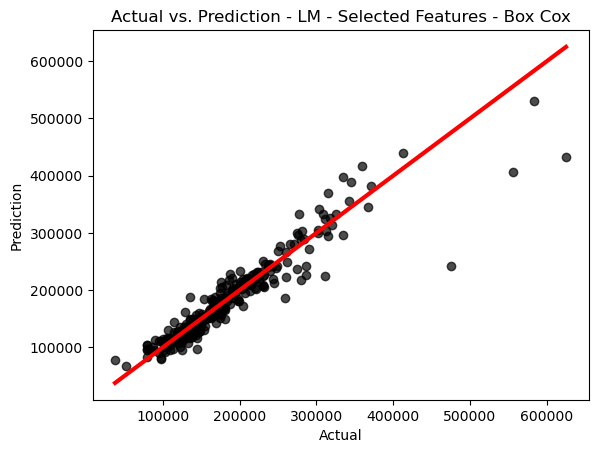

In [88]:
#Plot actual vs. prediction - Test
plt.scatter(test['SalePrice'], y_test_pred_3, c = 'black', alpha = 0.7)
plt.xlabel('Actual')
plt.ylabel('Prediction')
plt.title('Actual vs. Prediction - LM - Selected Features - Box Cox')
#Add 45 degree line
xp = np.linspace(test['SalePrice'].min() - 0.2, test['SalePrice'].max() + 0.2, 100)
plt.plot(xp, xp, c = 'red', linewidth = 3)
plt.show()

In [89]:
#Implement Ridge regression w/o hyperparameter tuning - model 4
from sklearn.linear_model import Ridge
#Create ridge regression model
model_4 = Ridge(alpha = 0.1)
#Fit the ridge regressor on the train
model_4.fit(X_train_scaled, trans_y_train)
#Ridge regression coefficients
print(model_4.coef_)
print(model_4.intercept_)

[-2.14725432e-02  3.93097406e-02  5.68552976e-02  5.53196949e-02
 -1.26266559e-02 -6.48637730e-03  2.75817111e-02  1.24131411e-04
  3.53792233e-03  9.86041564e-02  1.17122453e-01 -4.67137505e-03
  1.67638282e-01  5.59554633e-02  1.15167574e-02  7.02344016e-02
  3.35483537e-02 -3.69366287e-03 -3.92317992e-02  4.50022604e-02
  2.56115094e-02 -6.07546426e-03  1.23475586e-01 -5.61940286e-03
  3.80457758e-02  1.31062935e-02  5.40251033e-03  1.03769412e-02
  3.14669869e-02  2.77898414e-03  2.22482152e-02  5.32549347e-04
 -2.00885655e-02 -4.48455920e-02  2.53669737e-02 -6.00125836e-02
  1.28676275e-02 -4.31773300e-03  7.20814576e-04  5.41564987e-02
 -6.18207527e-03 -3.05210654e-02 -1.49385224e-02 -5.37349474e-02
 -5.19904058e-02 -7.48600970e-02  1.91894006e-02  8.49522816e-03
 -2.80892549e-02  3.97774926e-03  4.42149706e-02  1.85780657e-02
  4.10007941e-02  1.84024199e-02 -1.93213658e-02 -5.67652752e-03
 -1.85188423e-02  8.17332731e-03  2.13975806e-03  6.92172046e-03
  5.72371592e-02 -2.78345

In [90]:
#Grid
alpha_grid = 10 ** np.linspace(3, -3, 100)
print(alpha_grid)

[1.00000000e+03 8.69749003e+02 7.56463328e+02 6.57933225e+02
 5.72236766e+02 4.97702356e+02 4.32876128e+02 3.76493581e+02
 3.27454916e+02 2.84803587e+02 2.47707636e+02 2.15443469e+02
 1.87381742e+02 1.62975083e+02 1.41747416e+02 1.23284674e+02
 1.07226722e+02 9.32603347e+01 8.11130831e+01 7.05480231e+01
 6.13590727e+01 5.33669923e+01 4.64158883e+01 4.03701726e+01
 3.51119173e+01 3.05385551e+01 2.65608778e+01 2.31012970e+01
 2.00923300e+01 1.74752840e+01 1.51991108e+01 1.32194115e+01
 1.14975700e+01 1.00000000e+01 8.69749003e+00 7.56463328e+00
 6.57933225e+00 5.72236766e+00 4.97702356e+00 4.32876128e+00
 3.76493581e+00 3.27454916e+00 2.84803587e+00 2.47707636e+00
 2.15443469e+00 1.87381742e+00 1.62975083e+00 1.41747416e+00
 1.23284674e+00 1.07226722e+00 9.32603347e-01 8.11130831e-01
 7.05480231e-01 6.13590727e-01 5.33669923e-01 4.64158883e-01
 4.03701726e-01 3.51119173e-01 3.05385551e-01 2.65608778e-01
 2.31012970e-01 2.00923300e-01 1.74752840e-01 1.51991108e-01
 1.32194115e-01 1.149757

In [91]:
#K-fold cross validation to choose the best model
from sklearn.model_selection import cross_val_score

cv_errors = np.zeros(shape = len(alpha_grid)) #to save cv results

import time #to measure the processing time
start_time = time.time()

#K-fold cross validation
for i in range(len(alpha_grid)):
    ridge = Ridge(alpha = alpha_grid[i])
    scores = cross_val_score(estimator = ridge,
                             X = X_train_scaled,
                             y = trans_y_train,
                             scoring = 'neg_root_mean_squared_error',
                             cv = 10, n_jobs = -1)
    cv_errors[i] = scores.mean()

end_time = time.time()
print(f'The Processing time is: {end_time - start_time} seconds')

The Processing time is: 29.650753259658813 seconds


In [92]:
#Best alpha
best_alpha = alpha_grid[np.argmax(cv_errors)]
print(best_alpha)

376.49358067924675


In [93]:
#Ridge regression w/ Box Cox transformation - model 4
from sklearn.linear_model import Ridge
#Create ridge regression model
model_4 = Ridge(alpha = best_alpha)
#Fit the ridge regressor on the train
model_4.fit(X_train_scaled, trans_y_train)
#Ridge regression coefficinets
print(model_4.coef_)
print(model_4.intercept_)

[ 3.43156462e-03  2.92647089e-02  2.98247787e-02  5.64018859e-02
  9.60711662e-03  2.96336140e-02  1.78498227e-02  1.33795436e-02
  5.05998444e-02  7.37634819e-02  4.88117052e-02 -1.08243980e-03
  9.40407139e-02  3.78108695e-02  4.46986769e-03  6.40238813e-02
  3.58034357e-02  1.91402050e-02 -2.20613914e-02  6.42085264e-02
  4.53003827e-02  5.86369316e-03  7.08088863e-02  4.56064625e-02
  3.29377295e-02  1.44408218e-02  2.63331537e-03  1.15493985e-02
  2.66613664e-02 -4.21767252e-03  9.20824338e-03  3.35802776e-03
 -1.27817591e-02 -4.72549069e-02  6.37824747e-03  1.40406714e-04
  2.18607460e-02  3.97432788e-03 -4.84577432e-03 -1.42577978e-03
 -3.07740713e-02 -4.56645466e-03 -8.70632632e-03  1.55927166e-02
 -2.42428294e-02 -4.51746710e-02  1.88110902e-02  1.31583383e-02
 -2.82378250e-02 -5.55891491e-03  2.43529487e-02  4.38537350e-03
  8.67869206e-03  2.21063459e-02 -1.13042230e-02 -3.36014963e-03
 -9.83300058e-03  1.10131179e-02  3.63001029e-03 -1.01483052e-02
  4.87949246e-02 -3.45941

In [94]:
#Predict the response in the train
y_train_pred_4 = model_4.predict(X_train_scaled)
#Inverse transformation of predicted values
y_train_pred_4 = pd.Series(boxcox.inverse_transform(y_train_pred_4.reshape(-1, 1)).reshape(-1))

from sklearn.metrics import root_mean_squared_error, mean_absolute_percentage_error, r2_score
#The root mean squared error
print(f'RMSE: {root_mean_squared_error(y_train, y_train_pred_4):.3f}')
#MAPE
print(f'MAPE: {mean_absolute_percentage_error(y_train, y_train_pred_4) * 100:.3f}')
#The coefficient of determination
print(f'R2: {r2_score(y_train, y_train_pred_4):.3f}')

RMSE: 31614.136
MAPE: 9.082
R2: 0.842


In [95]:
#Predict the response in the test - model 4
y_test_pred_4 = model_4.predict(X_test_scaled)
#Inverse transformation of predicted values
y_test_pred_4 = pd.Series(boxcox.inverse_transform(y_test_pred_4.reshape(-1, 1)).reshape(-1),
                          index = test.index)

#Absolute error
abs_err_4 = abs(test['SalePrice'] - y_test_pred_4)

#RMSE, MAPE, MAE, and median, sd, IQR, max, min of absolute errors
from scipy.stats import iqr
models_comp = pd.concat([models_comp,
                         pd.DataFrame({'RMSE': root_mean_squared_error(test['SalePrice'], y_test_pred_4),
                                       'MAPE': mean_absolute_percentage_error(test['SalePrice'], y_test_pred_4) * 100,
                                       'MAE': abs_err_4.mean(),
                                       'Median of AbsErrors': abs_err_4.median(),
                                       'SD of AbsErrors': abs_err_4.std(),
                                       'IQR of AbsErrors': iqr(abs_err_4),
                                       'Min of AbsErrors': abs_err_4.min(),
                                       'Max of AbsErrors': abs_err_4.max()},
                                      index = ['Ridge Regression - Box Cox'])])
models_comp

,RMSE,MAPE,MAE,Median of AbsErrors,SD of AbsErrors,IQR of AbsErrors,Min of AbsErrors,Max of AbsErrors
LM - All Features,29282.684282,10.733316,18775.295556,13880.897344,22509.978822,17147.915622,138.041211,174018.911675
LM - All Feature - Box Cox,28136.099473,8.605331,16088.166086,10847.570106,23122.326250,13575.343382,4.302193,221671.482123
LM - Selected Features - Box Cox,27346.246873,8.443262,15422.462995,9766.297792,22621.169505,12766.030672,0.849437,233519.232540
Ridge Regression - Box Cox,27012.897201,8.575969,15493.280239,9814.570208,22166.135104,14069.853760,35.057189,216166.182050


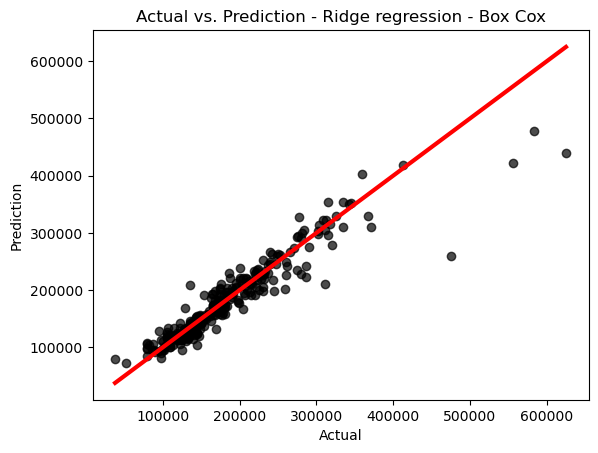

In [96]:
#Plot actual vs. prediction - Test
plt.scatter(test['SalePrice'], y_test_pred_4, c = 'black', alpha = 0.7)
plt.xlabel('Actual')
plt.ylabel('Prediction')
plt.title('Actual vs. Prediction - Ridge regression - Box Cox')
#Add 45 degree line
xp = np.linspace(test['SalePrice'].min() - 0.2, test['SalePrice'].max() + 0.2, 100)
plt.plot(xp, xp, c = 'red', linewidth = 3)
plt.show()

In [97]:
#Implement Lasso regression w/o hyperparameter tuning - model 5
from sklearn.linear_model import Lasso
#Create Lasso regression model
model_5 = Lasso(alpha = 0.1)
#Fit the Lasso regressor on the train
model_5.fit(X_train_scaled, trans_y_train)
#Lasso regression coefficients
print(model_5.coef_)
print(model_5.intercept_)

[ 0.          0.          0.1110084   0.10920339  0.          0.
  0.         -0.          0.12121451  0.          0.         -0.
  0.30712137  0.          0.          0.          0.          0.
 -0.          0.          0.08263526  0.          0.18869221  0.
  0.          0.         -0.          0.          0.         -0.
  0.          0.         -0.         -0.00696611 -0.          0.
  0.          0.         -0.          0.         -0.         -0.
 -0.          0.02457954 -0.00503136 -0.         -0.          0.
 -0.         -0.          0.          0.         -0.          0.
 -0.         -0.         -0.          0.          0.          0.
  0.         -0.         -0.         -0.         -0.         -0.
  0.          0.          0.00167869 -0.         -0.         -0.
  0.          0.         -0.         -0.          0.         -0.
 -0.         -0.         -0.         -0.         -0.          0.
 -0.          0.         -0.         -0.         -0.          0.
  0.02320223  0.01147055 

In [98]:
#K-fold cross validation to choose the best model
from sklearn.model_selection import cross_val_score

cv_errors = np.zeros(shape = len(alpha_grid)) #to save cv results

import time #to measure the processing time
start_time = time.time()

#K-fold cross validation
for i in range(len(alpha_grid)):
    lasso = Lasso(alpha = alpha_grid[i])
    scores = cross_val_score(estimator = lasso,
                             X = X_train_scaled,
                             y = trans_y_train,
                             scoring = 'neg_root_mean_squared_error',
                             cv = 12, n_jobs = -1)
    cv_errors[i] = scores.mean()

end_time = time.time()
print(f'The Processing time is: {end_time - start_time} seconds')

The Processing time is: 25.41633415222168 seconds


In [99]:
#Best alpha
best_alpha = alpha_grid[np.argmax(cv_errors)]
print(best_alpha)

0.007054802310718645


In [100]:
#Lasso regression w/ Box Cox transformation - model 5
from sklearn.linear_model import Lasso
#Create lasso regression model
model_5 = Lasso(alpha = best_alpha)
#Fit the lasso regressor on the train
model_5.fit(X_train_scaled, trans_y_train)
#Lasso regression coefficinets
print(model_5.coef_)
print(model_5.intercept_)

[-0.00000000e+00  2.76532357e-02  4.78196763e-02  6.58523118e-02
  0.00000000e+00  0.00000000e+00  4.41762815e-03 -0.00000000e+00
  4.61908758e-02  4.81712056e-02  0.00000000e+00 -2.33307033e-03
  2.45556954e-01  5.08715164e-02  3.72897682e-03  6.20122343e-02
  2.55141876e-02  0.00000000e+00 -4.14623421e-02  3.86652413e-02
  4.92101508e-02  0.00000000e+00  1.27219963e-01  0.00000000e+00
  3.09623219e-02  5.36469892e-03  0.00000000e+00  2.96981192e-03
  2.64687412e-02 -3.78168454e-03  0.00000000e+00  0.00000000e+00
 -7.51634375e-03 -5.46134755e-02 -0.00000000e+00 -0.00000000e+00
  9.51131654e-03  0.00000000e+00 -0.00000000e+00  0.00000000e+00
 -2.77193111e-02 -0.00000000e+00 -0.00000000e+00  0.00000000e+00
 -3.12507198e-02 -5.10861886e-02  9.99140252e-03  8.23812818e-03
 -2.98838647e-02 -0.00000000e+00  1.77208858e-02  2.12941158e-04
  0.00000000e+00  2.76925610e-02 -1.99791513e-03 -0.00000000e+00
 -0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  6.01795128e-02 -3.04736

In [101]:
#Predict the response in the train
y_train_pred_5 = model_5.predict(X_train_scaled)
#Inverse transformation of predicted values
y_train_pred_5 = pd.Series(boxcox.inverse_transform(y_train_pred_5.reshape(-1, 1)).reshape(-1))

from sklearn.metrics import root_mean_squared_error, mean_absolute_percentage_error, r2_score
#The root mean squared error
print(f'RMSE: {root_mean_squared_error(y_train, y_train_pred_5):.3f}')
#MAPE
print(f'MAPE: {mean_absolute_percentage_error(y_train, y_train_pred_5) * 100:.3f}')
#The coefficinet of determination
print(f'R2: {r2_score(y_train, y_train_pred_5):.3f}')

RMSE: 31295.548
MAPE: 9.003
R2: 0.845


In [102]:
#Predict the response in the test - model 5
y_test_pred_5 = model_5.predict(X_test_scaled)
#Inverse transformation of predicted values
y_test_pred_5 = pd.Series(boxcox.inverse_transform(y_test_pred_5.reshape(-1, 1)).reshape(-1),
                          index = test.index)

#Absolute error
abs_err_5 = abs(test['SalePrice'] - y_test_pred_5)

#RMSE, MAPE, MAE, and median, sd, IQR, max, min of absolute errors
from scipy.stats import iqr
models_comp = pd.concat([models_comp,
                         pd.DataFrame({'RMSE': root_mean_squared_error(test['SalePrice'], y_test_pred_5),
                                       'MAPE': mean_absolute_percentage_error(test['SalePrice'], y_test_pred_5) * 100,
                                       'MAE': abs_err_5.mean(),
                                       'Median of AbsErrors': abs_err_5.median(),
                                       'SD of AbsErrors': abs_err_5.std(),
                                       'IQR of AbsErrors': iqr(abs_err_5),
                                       'Min of AbsErrors': abs_err_5.min(),
                                       'Max of AbsErrors': abs_err_5.max()}, 
                                     index = ['Lasso Regression - Box Cox'])])
models_comp

,RMSE,MAPE,MAE,Median of AbsErrors,SD of AbsErrors,IQR of AbsErrors,Min of AbsErrors,Max of AbsErrors
LM - All Features,29282.684282,10.733316,18775.295556,13880.897344,22509.978822,17147.915622,138.041211,174018.911675
LM - All Feature - Box Cox,28136.099473,8.605331,16088.166086,10847.570106,23122.326250,13575.343382,4.302193,221671.482123
LM - Selected Features - Box Cox,27346.246873,8.443262,15422.462995,9766.297792,22621.169505,12766.030672,0.849437,233519.232540
Ridge Regression - Box Cox,27012.897201,8.575969,15493.280239,9814.570208,22166.135104,14069.853760,35.057189,216166.182050
Lasso Regression - Box Cox,26308.006677,8.446961,15523.976248,9875.288686,21275.986659,15982.451412,20.738700,194871.311604


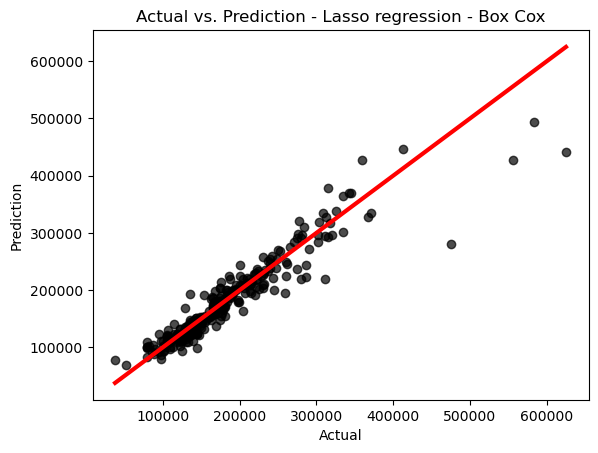

In [103]:
#Plot actual vs. prediction - Test
plt.scatter(test['SalePrice'], y_test_pred_5, c = 'black', alpha = 0.7)
plt.xlabel('Actual')
plt.ylabel('Prediction')
plt.title('Actual vs. Prediction - Lasso regression - Box Cox')
#Add 45 degree line
xp = np.linspace(test['SalePrice'].min() - 0.2, test['SalePrice'].max() + 0.2, 100)
plt.plot(xp, xp, c = 'red', linewidth = 3)
plt.show()

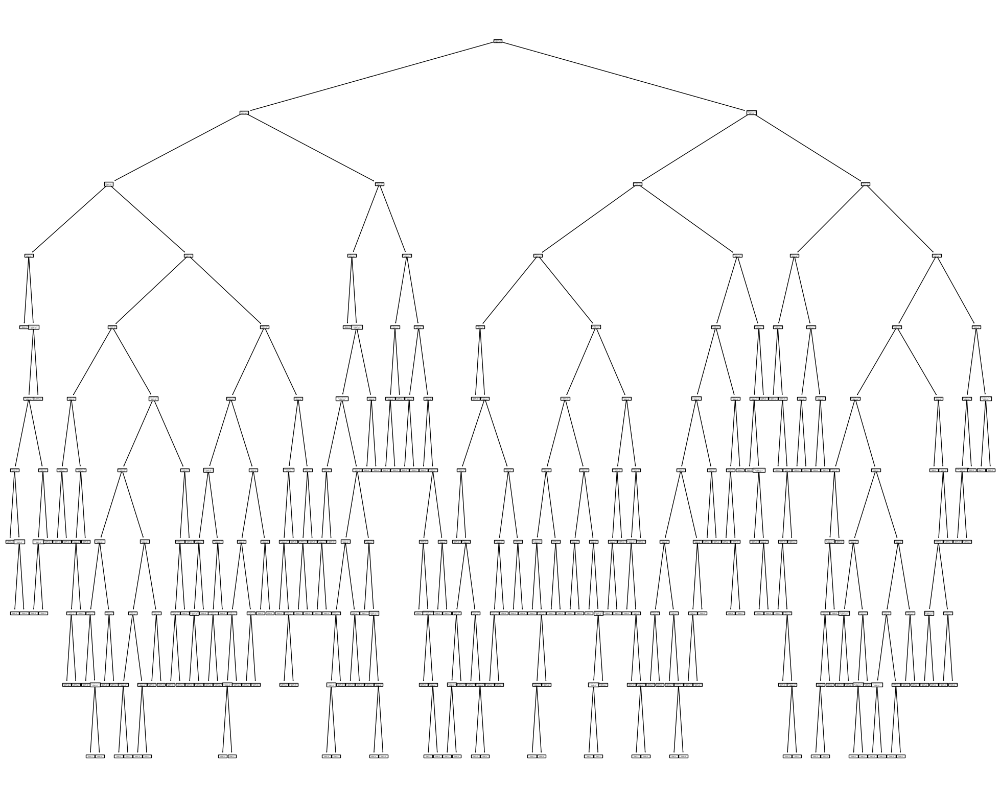

In [104]:
#Decision Tree - model 6
from sklearn.tree import DecisionTreeRegressor
#Post prunning approach
#Create decision tree model
model_6 = DecisionTreeRegressor(criterion = 'squared_error',
                                max_depth = 10,
                                min_samples_leaf = 5,
                                ccp_alpha = 0)
#Fit the decision tree regressor on the train
model_6.fit(X_train_scaled, trans_y_train)
#Plot the Tree
from sklearn.tree import plot_tree
plt.figure(figsize = (25, 20))
plot_tree(model_6, feature_names = X_train.columns)
plt.show()

In [105]:
#Post prunning
prunning_path = model_6.cost_complexity_pruning_path(X_train_scaled, trans_y_train)
prunning_path

{'ccp_alphas': array([0.00000000e+00, 2.32295221e-05, 5.70302336e-05, 6.18117700e-05,
        6.49185058e-05, 7.88602550e-05, 8.08607364e-05, 8.75982703e-05,
        9.57968327e-05, 1.04172857e-04, 1.23906788e-04, 1.25169660e-04,
        1.31026775e-04, 1.48611767e-04, 1.48707747e-04, 1.61666432e-04,
        1.67852652e-04, 1.69188799e-04, 1.70201597e-04, 1.83636389e-04,
        1.90215963e-04, 1.92345164e-04, 1.93567202e-04, 2.01792234e-04,
        2.07836870e-04, 2.08344488e-04, 2.08485368e-04, 2.09988934e-04,
        2.14603542e-04, 2.14631815e-04, 2.32706080e-04, 2.49503430e-04,
        2.58792464e-04, 2.61232745e-04, 2.66773941e-04, 2.67546011e-04,
        2.69455974e-04, 2.75211063e-04, 2.81059990e-04, 2.83739457e-04,
        3.11616287e-04, 3.19583442e-04, 3.20248017e-04, 3.29690649e-04,
        3.31791136e-04, 3.52909250e-04, 3.53902358e-04, 3.55505973e-04,
        3.84724542e-04, 3.86766510e-04, 4.02219319e-04, 4.07830778e-04,
        4.10996845e-04, 4.11443602e-04, 4.12712588

In [106]:
#Grid
alpha_grid = prunning_path['ccp_alphas']

In [107]:
#K-fold cross validation to choose the best model
from sklearn.model_selection import cross_val_score

cv_errors = np.zeros(shape = len(alpha_grid)) #to save cv results

import time #to measure the processing time
start_time = time.time()
for i in range(len(alpha_grid)):
    tree_reg = DecisionTreeRegressor(criterion = 'squared_error',
                                     max_depth = 10,
                                     min_samples_leaf = 5,
                                     ccp_alpha = alpha_grid[i])
    scores = cross_val_score(estimator = tree_reg,
                             X = X_train_scaled,
                             y = trans_y_train,
                             scoring = 'neg_root_mean_squared_error',
                             cv = 5, n_jobs = -1)
    cv_errors[i] = scores.mean()

end_time = time.time()
print(f'The Processing time is: {end_time - start_time} seconds')

The Processing time is: 32.271310329437256 seconds


In [108]:
#Best alpha
best_alpha = alpha_grid[np.argmax(cv_errors)]
print(best_alpha)

0.0005119838463038093


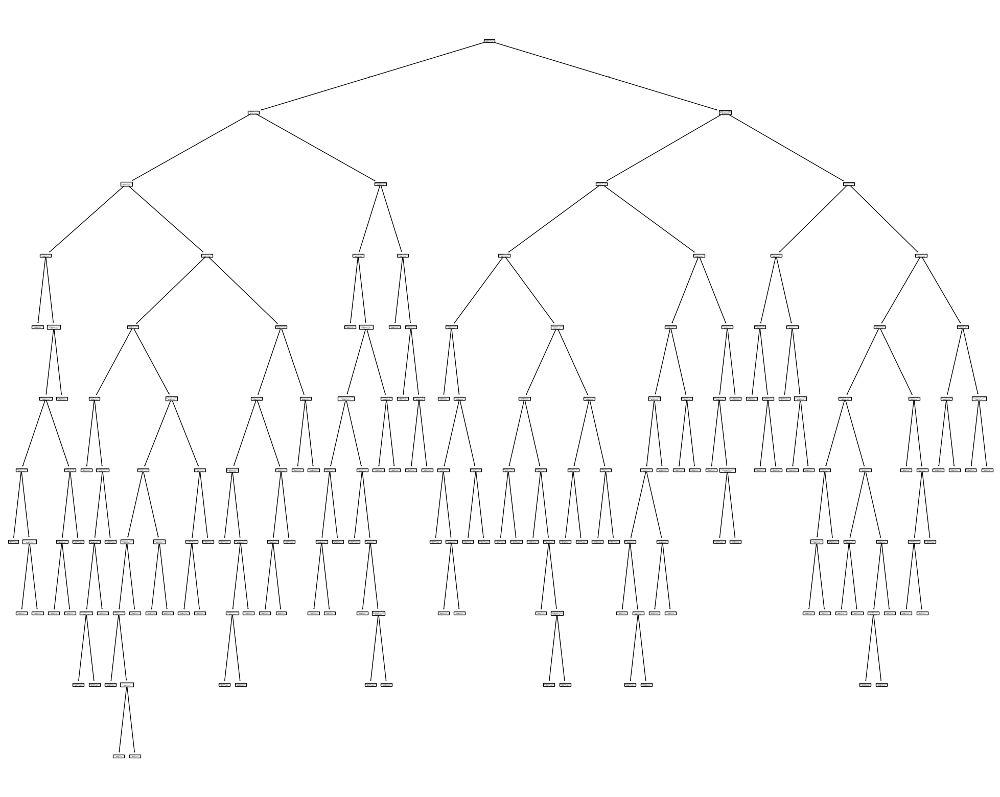

In [109]:
#Best model
#Create decision tree model - model 6
model_6 = DecisionTreeRegressor(criterion = 'squared_error',
                                max_depth = 10,
                                min_samples_leaf = 5,
                                ccp_alpha = best_alpha)
#Fit the decision tree regressor on the train
model_6.fit(X_train_scaled, trans_y_train)
#Plot the Tree
from sklearn.tree import plot_tree
plt.figure(figsize = (25, 20))
plot_tree(model_6, feature_names = X_train.columns)
plt.show()

In [110]:
#Predict the response in the train
y_train_pred_6 = model_6.predict(X_train_scaled)
#Invesre transformation of predicted values
y_train_pred_6 = pd.Series(boxcox.inverse_transform(y_train_pred_6.reshape(-1, 1)).reshape(-1))

from sklearn.metrics import root_mean_squared_error, mean_absolute_percentage_error, r2_score
#The root mean squared error
print(f'RMSE: {root_mean_squared_error(y_train, y_train_pred_6):.3f}')
#MAPE
print(f'MAPE: {mean_absolute_percentage_error(y_train, y_train_pred_6) * 100:.3f}')
#The coefficient of determination
print(f'R2: {r2_score(y_train, y_train_pred_6):.3f}')

RMSE: 24750.136
MAPE: 8.845
R2: 0.903


In [111]:
#Predict the response in the test - model 6
y_test_pred_6 = model_6.predict(X_test_scaled)
#Inverse transformation of predicted values
y_test_pred_6 = pd.Series(boxcox.inverse_transform(y_test_pred_6.reshape(-1, 1)).reshape(-1),
                          index = test.index)

#Absolute error
abs_err_6 = abs(test['SalePrice'] - y_test_pred_6)

#RMSE, MAPE, MAE, and median, sd, IQR, max, min of absolute errors
from scipy.stats import iqr
models_comp = pd.concat([models_comp,
                         pd.DataFrame({'RMSE': root_mean_squared_error(test['SalePrice'], y_test_pred_6),
                                       'MAPE': mean_absolute_percentage_error(test['SalePrice'], y_test_pred_6) * 100,
                                       'MAE': abs_err_6.mean(),
                                       'Median of AbsErrors': abs_err_6.median(),
                                       'SD of AbsErrors': abs_err_6.std(),
                                       'IQR of AbsErrors': iqr(abs_err_6),
                                       'Min of AbsErrors': abs_err_6.min(),
                                       'Max of AbsErrors': abs_err_6.max()},
                                      index = ['Decision Tree - Box Cox'])])
models_comp

,RMSE,MAPE,MAE,Median of AbsErrors,SD of AbsErrors,IQR of AbsErrors,Min of AbsErrors,Max of AbsErrors
LM - All Features,29282.684282,10.733316,18775.295556,13880.897344,22509.978822,17147.915622,138.041211,174018.911675
LM - All Feature - Box Cox,28136.099473,8.605331,16088.166086,10847.570106,23122.326250,13575.343382,4.302193,221671.482123
LM - Selected Features - Box Cox,27346.246873,8.443262,15422.462995,9766.297792,22621.169505,12766.030672,0.849437,233519.232540
Ridge Regression - Box Cox,27012.897201,8.575969,15493.280239,9814.570208,22166.135104,14069.853760,35.057189,216166.182050
Lasso Regression - Box Cox,26308.006677,8.446961,15523.976248,9875.288686,21275.986659,15982.451412,20.738700,194871.311604
Decision Tree - Box Cox,37473.075945,12.782693,22903.016364,13808.596093,29710.372411,24190.167063,175.822338,320916.250097


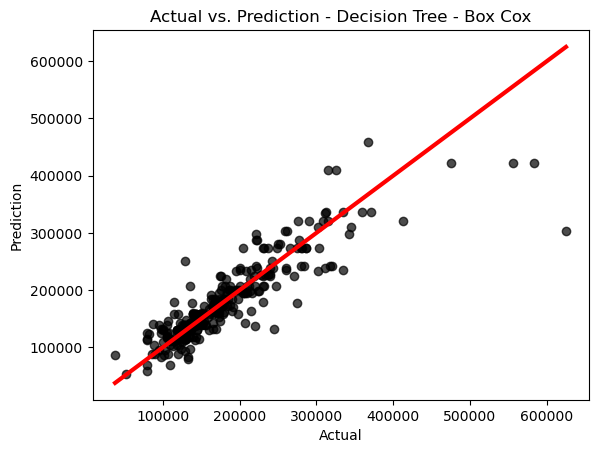

In [112]:
#Actual vs. Prediction
plt.scatter(x = test['SalePrice'], y = y_test_pred_6, c = 'black', alpha = 0.7)
plt.xlabel('Actual')
plt.ylabel('Prediction')
plt.title('Actual vs. Prediction - Decision Tree - Box Cox')

#Add 45 degree line
xp = np.linspace(test['SalePrice'].min() - 0.2, test['SalePrice'].max() + 0.2, 100)
plt.plot(xp, xp, c = 'red', linewidth = 3)
plt.show()

In [113]:
#Sample Random Forest model (not tuned) - model 7
from sklearn.ensemble import RandomForestRegressor
#Create random forest model
model_7 = RandomForestRegressor(n_estimators = 100,
                                max_features = 4,
                                criterion = 'squared_error',
                                max_depth = 15,
                                min_samples_leaf = 10,
                                ccp_alpha = 0,
                                random_state = 123)
#Fit the random forest regressor on the train
model_7.fit(X_train_scaled, trans_y_train.flatten())

#Predict the response in the train
y_train_pred_7 = model_7.predict(X_train_scaled)
#Inverse transformation of predicted values
y_train_pred_7 = pd.Series(boxcox.inverse_transform(y_train_pred_7.reshape(-1, 1)).reshape(-1))

from sklearn.metrics import root_mean_squared_error, mean_absolute_percentage_error, r2_score
#The root mean squared error
print(f'RMSE: {root_mean_squared_error(y_train, y_train_pred_7):.3f}')
#MAPE
print(f'MAPE: {mean_absolute_percentage_error(y_train, y_train_pred_7) * 100:.3f}')
#The coefficinet of determination
print(f'R2: {r2_score(y_train, y_train_pred_7):.3f}')

In [114]:
#Create hyper-parameters grid
import itertools
n_estimators = [100, 200, 300]
max_features = ['sqrt', 'log2', None] #If None or 1.0, then max_features = n_features
max_depth = [2, 5, 10]
min_samples_leaf = [5, 10, 15]
params_grid = list(itertools.product(n_estimators, max_features, max_depth, min_samples_leaf))
params_grid = pd.DataFrame(data = params_grid,
                           index = range(1, len(params_grid) + 1),
                           columns = ['n_estimators',
                                      'max_features',
                                      'max_depth',
                                      'min_samples_leaf'])
params_grid

In [115]:
#K-fold cross validation to choose the best model
from sklearn.model_selection import cross_val_score

import time #to measure the processing time
start_time = time.time()
cv_errors = np.zeros(shape = len(params_grid)) #to save cv results
for i in range(len(params_grid)):
    rf_reg = RandomForestRegressor(n_estimators = params_grid.iloc[i, 0],
                                   max_features = params_grid.iloc[i, 1],
                                   criterion = 'squared_error',
                                   max_depth = params_grid.iloc[i, 2],
                                   min_samples_leaf = params_grid.iloc[i, 3],
                                   ccp_alpha = 0)
    scores = cross_val_score(estimator = rf_reg,
                             X = X_train_scaled,
                             y = trans_y_train.flatten(),
                             scoring = 'neg_root_mean_squared_error',
                             cv = 5, n_jobs = -1)
    cv_errors[i] = scores.mean()

end_time = time.time()
print(f'The Processing time is: {end_time - start_time} seconds')

In [116]:
#Best model
params_grid.iloc[np.argmax(cv_errors), :]

In [117]:
#Create random forest model - model 7
model_7 = RandomForestRegressor(n_estimators = params_grid.iloc[np.argmax(cv_errors), 0],
                                max_features = params_grid.iloc[np.argmax(cv_errors), 1],
                                criterion = 'squared_error',
                                max_depth = params_grid.iloc[np.argmax(cv_errors), 2],
                                min_samples_leaf = params_grid.iloc[np.argmax(cv_errors), 3],
                                ccp_alpha = 0,
                                random_state = 123)
#Fit the random forest regressor om the train
model_7.fit(X_train_scaled, trans_y_train.flatten())

#Predict the response in the train
y_train_pred_7 = model_7.predict(X_train_scaled)
#Inverse transformation of predicted values
y_train_pred_7 = pd.Series(boxcox.inverse_transform(y_train_pred_7.reshape(-1, 1)).reshape(-1))

from sklearn.metrics import root_mean_squared_error, mean_absolute_percentage_error, r2_score
#The root mean squared error
print(f'RMSE: {root_mean_squared_error(y_train, y_train_pred_7):.3f}')
#MAPE
print(f'MAPE: {mean_absolute_percentage_error(y_train, y_train_pred_7) * 100:.3f}')
#The coefficient of determination
print(f'R2: {r2_score(y_train, y_train_pred_7):.3f}')

In [118]:
#Calculate variable importance
importance = pd.DataFrame({'importance': model_7.feature_importances_ * 100},
                          index = X_train.columns)
importance.sort_values(by = 'importance', axis = 0, ascending = True, inplace = True)
importance.tail(10)

In [119]:
#Predict the response in the test - model 7
y_test_pred_7 = model_7.predict(X_test_scaled)
#Inverse transformation of predicted values
y_test_pred_7 = pd.Series(boxcox.inverse_transform(y_test_pred_7.reshape(-1, 1)).reshape(-1),
                          index = test.index)

#Absolute error
abs_err_7 = abs(test['SalePrice'] - y_test_pred_7)

#RMSE, MAPE, MAE, and median, sd, IQR, max, min of absolute errors
from scipy.stats import iqr
models_comp = pd.concat([models_comp, 
                         pd.DataFrame({'RMSE': root_mean_squared_error(test['SalePrice'], y_test_pred_7),
                                       'MAPE': mean_absolute_percentage_error(test['SalePrice'], y_test_pred_7) * 100,
                                       'MAE': abs_err_7.mean(),
                                       'Median of AbsErrors': abs_err_7.median(),
                                       'SD of AbsErrors': abs_err_7.std(),
                                       'IQR of AbsErrros': iqr(abs_err_7),
                                       'Min of AbsErrros': abs_err_7.min(),
                                       'Max of AbsErrors': abs_err_7.max()},
                                      index = ['Random Forest - Box Cox'])])
models_comp

In [120]:
#Actual vs. Prediction
plt.scatter(x = test['SalePrice'], y = y_test_pred_7, c = 'black', alpha = 0.7)
plt.xlabel('Actual')
plt.ylabel('Prediction')
plt.title('Actual vs. Prediction - Random Forest - Box Cox')

#Add 45 degree line
xp = np.linspace(test['SalePrice'].min() - 0.2, test['SalePrice'].max() + 0.2, 100)
plt.plot(xp, xp, c = 'red', linewidth = 3)
plt.show()

In [121]:
#SGB Regressor (not tuned) - model 8
from sklearn.ensemble import GradientBoostingRegressor
#Create SGB regressor model
model_8 = GradientBoostingRegressor(learning_rate = 0.1, #learning rate
                                    n_estimators = 100, #the total number of trees to fit
                                    subsample = 1.0, #the fraction of samples to be used,
                                                     #if <1, Stochastic GB
                                    max_depth = 1, #the maximum depth of each tree
                                    min_samples_leaf = 20, #the minimum number of observations in leaf nodes of each tree
                                    random_state = 123)
#Fit the SGB regressor on the train
model_8.fit(X_train_scaled, trans_y_train.flatten())

#Predict the response in the train
y_train_pred_8 = model_8.predict(X_train_scaled)
#Inverse transformation of predicted values
y_train_pred_8 = pd.Series(boxcox.inverse_transform(y_train_pred_8.reshape(-1, 1)).reshape(-1))

from sklearn.metrics import root_mean_squared_error, mean_absolute_percentage_error, r2_score
#The root mean squared error
print(f'RMSE: {root_mean_squared_error(y_train, y_train_pred_8):.3f}')
#MAPE
print(f'MAPE: {mean_absolute_percentage_error(y_train, y_train_pred_8) * 100:.3f}')
#The coefficient of determination
print(f'R2: {r2_score(y_train, y_train_pred_8):.3f}')

In [122]:
#Grid
#K-Fold Cross Validation for Choosing Hyper-parameters
#Create Hyper-parameters grid
import itertools
learning_rate = [0.001, 0.01, 0.1]
n_estimators = [100, 200, 500]
subsample = [0.5, 0.8, 1]
max_depth = [1, 2, 5]
min_samples_leaf = [5, 10, 20]
params_grid = list(itertools.product(learning_rate, n_estimators, subsample, max_depth, min_samples_leaf))
params_grid = pd.DataFrame(data = params_grid, index = range(1, len(params_grid) + 1), columns = ['learning_rate',
                                                                                                  'n_estimators',
                                                                                                  'subsample',
                                                                                                  'max_depth', 
                                                                                                  'min_samples_leaf'])
params_grid

In [123]:
#K-fold cross validation to choose the best model
from sklearn.model_selection import cross_val_score

#Save cv results
cv_errors = np.zeros(shape = len(params_grid))

import time #to measure the processing time
start_time = time.time()
for i in range(len(params_grid)):
    gb_reg = GradientBoostingRegressor(learning_rate = params_grid.iloc[i, 0],
                                       n_estimators = params_grid.iloc[i, 1],
                                       subsample = params_grid.iloc[i, 2],
                                       max_depth = params_grid.iloc[i, 3],
                                       min_samples_leaf = params_grid.iloc[i, 4])
    scores = cross_val_score(estimator = gb_reg,
                             X = X_train_scaled,
                             y = trans_y_train.flatten(),
                             scoring = 'neg_root_mean_squared_error',
                             cv = 5, n_jobs = -1)
    cv_errors[i] = scores.mean()

end_time = time.time()
print(f'The Processing time is: {end_time - start_time} seconds')

In [124]:
#Best model
params_grid.iloc[np.argmax(cv_errors)]

In [125]:
#SGB Regressor (tuned) - model 8
from sklearn.ensemble import GradientBoostingRegressor
#Create SGB regressor model
model_8 = GradientBoostingRegressor(learning_rate = params_grid.iloc[np.argmax(cv_errors), 0],
                                    n_estimators = params_grid.iloc[np.argmax(cv_errors), 1],
                                    subsample = params_grid.iloc[np.argmax(cv_errors), 2],
                                    max_depth = params_grid.iloc[np.argmax(cv_errors), 3],
                                    min_samples_leaf = params_grid.iloc[np.argmax(cv_errors), 4],
                                    random_state = 123)

#Fit the SGB regressor on the train
model_8.fit(X_train_scaled, trans_y_train.flatten())

#Predict the response in the train
y_train_pred_8 = model_8.predict(X_train_scaled)
#Inverse transformation of predicted values
y_train_pred_8 = pd.Series(boxcox.inverse_transform(y_train_pred_8.reshape(-1, 1)).reshape(-1))

from sklearn.metrics import root_mean_squared_error, mean_absolute_percentage_error, r2_score
#The root mean squared error
print(f'RMSE: {root_mean_squared_error(y_train, y_train_pred_8):.3f}')
#MAPE
print(f'MAPE: {mean_absolute_percentage_error(y_train, y_train_pred_8) * 100:.3f}')
#The coefficient of determination
print(f'R2: {r2_score(y_train, y_train_pred_8):.3f}')

In [126]:
#Predict the response in the test - model 8
y_test_pred_8 = model_8.predict(X_test_scaled)
#Inverse transformation of predicted values
y_test_pred_8 = pd.Series(boxcox.inverse_transform(y_test_pred_8.reshape(-1, 1)).reshape(-1),
                          index = test.index)

#Absolute error
abs_err_8 = abs(test['SalePrice'] - y_test_pred_8)

#RMSE, MAPE, MAE, and median, sd, IQR, max, min of absolute errors
from scipy.stats import iqr
models_comp = pd.concat([models_comp,
                         pd.DataFrame({'RMSE': root_mean_squared_error(test['SalePrice'], y_test_pred_8),
                                       'MAPE': mean_absolute_percentage_error(test['SalePrice'], y_test_pred_8) * 100,
                                       'MAE': abs_err_8.mean(),
                                       'Median of AbsErrors': abs_err_8.median(),
                                       'SD of AbsErrors': abs_err_8.std(),
                                       'IQR of AbsErrors': iqr(abs_err_8),
                                       'Min of AbsErrors': abs_err_8.min(),
                                       'Max of AbsErrors': abs_err_8.max()},
                                      index = ['SGB Regressor - Box Cox'])])
models_comp

In [127]:
#Actual vs. Prediction
plt.scatter(x = test['SalePrice'], y = y_test_pred_8, c = 'black', alpha = 0.7)
plt.xlabel('Actual')
plt.ylabel('Prediction')
plt.title('Actual vs. Prediction - Stochastic Gradient Boost')

#Add 45 degree line
xp = np.linspace(test['SalePrice'].min() - 0.2, test['SalePrice'].max() + 0.2, 100)
plt.plot(xp, xp, c = 'red', linewidth = 3)
plt.show()

In [128]:
#PCA (Principal Components Analysis)
from sklearn.decomposition import PCA
pca = PCA()
pca_model = pca.fit(X_train_scaled)

In [129]:
#Explaind variance percentage - Cumulative explained variance percentage
pca_results = pd.DataFrame({'Explained Variance Percentage': pca_model.explained_variance_ratio_ * 100,
                            'Cumulative explained Variance Percentage': np.cumsum(np.round(pca_model.explained_variance_ratio_ * 100, 1))})
pca_results.sort_values('Cumulative explained Variance Percentage', ascending = False, inplace = True)
pca_results

,Explained Variance Percentage,Cumulative explained Variance Percentage
178,3.425249e-32,99.8
176,1.782997e-30,99.8
177,3.425249e-32,99.8
155,4.238185e-02,99.8
156,3.823466e-02,99.8
157,3.756439e-02,99.8
158,3.615089e-02,99.8
159,3.479685e-02,99.8
162,2.723143e-02,99.8
160,3.096503e-02,99.8


In [130]:
#Principal axes in feature space
print(pca_model.components_.shape)
print(pca_model.components_)

(179, 179)
[[ 6.81641176e-02  3.25149190e-02  2.10448359e-01 ... -5.30191303e-02
   1.11467167e-01 -1.89812935e-02]
 [ 1.18195755e-01  1.25384390e-01  5.07984832e-02 ...  4.74680150e-02
  -6.65079762e-02  8.13430487e-03]
 [ 1.43244977e-01  1.13855846e-01 -1.05116045e-01 ...  4.28303703e-02
  -5.73444933e-02  1.55230331e-02]
 ...
 [-3.22359114e-16  5.31921132e-16  5.29533297e-16 ... -1.80411242e-16
   2.91433544e-16  4.16333634e-17]
 [ 0.00000000e+00 -3.36536354e-16 -1.57906901e-16 ...  4.16333634e-17
   4.30211422e-16 -1.17961196e-16]
 [ 0.00000000e+00 -2.58473798e-16 -9.10197117e-17 ...  1.38777878e-16
   2.42861287e-17  6.24500451e-17]]


In [131]:
#Transform data into new dimensions
X_train_pca = pca_model.transform(X_train_scaled)
X_train_pca.shape

(1168, 179)

In [132]:
#K-fold cross validation to choose the best model
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression

cv_errors = np.zeros(shape = X_train_pca.shape[1]) #to save cv results

import time #to measure the processing time
start_time = time.time()

for i in range(X_train_pca.shape[1]):
    linear_reg = LinearRegression()
    scores = cross_val_score(estimator = linear_reg,
                             X = X_train_pca[:, : i + 1],
                             y = trans_y_train,
                             scoring = 'neg_root_mean_squared_error',
                             cv = 5, n_jobs = -1)
    cv_errors[i] = scores.mean()

end_time = time.time()
print(f'The Processing time is: {end_time - start_time} seconds')
cv_errors

The Processing time is: 15.403775691986084 seconds


array([-0.58172767, -0.55454029, -0.49127621, -0.48410675, -0.48063574,
       -0.43825759, -0.42980657, -0.4192332 , -0.41670678, -0.41626053,
       -0.4171069 , -0.417926  , -0.41388783, -0.41688007, -0.41581749,
       -0.41207699, -0.41279777, -0.41211885, -0.41317112, -0.40723465,
       -0.40780245, -0.40812831, -0.40805586, -0.4083742 , -0.40818528,
       -0.40758122, -0.407605  , -0.40683399, -0.4072595 , -0.40733225,
       -0.40814868, -0.40585181, -0.40720563, -0.4089835 , -0.40735674,
       -0.40750834, -0.4065422 , -0.40689263, -0.40477537, -0.4047005 ,
       -0.4052315 , -0.40555859, -0.40623409, -0.40732614, -0.40758334,
       -0.40907016, -0.40970125, -0.40874632, -0.40875091, -0.41048678,
       -0.41154194, -0.41009339, -0.41130764, -0.40570463, -0.40608241,
       -0.4065873 , -0.40828634, -0.40818626, -0.40878045, -0.40824717,
       -0.40880279, -0.40810099, -0.40840145, -0.40930304, -0.40918689,
       -0.4089962 , -0.41033782, -0.41058501, -0.41082199, -0.41

In [133]:
#Best number of components
components_number = np.argmax(cv_errors)
print(components_number)

39


In [134]:
#Correlation btw components
np.round(pd.DataFrame(X_train_pca[:, : components_number]).corr(), 3)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38
0,1.0,-0.0,-0.0,-0.0,0.0,-0.0,0.0,-0.0,0.0,-0.0,0.0,-0.0,0.0,0.0,-0.0,0.0,0.0,0.0,-0.0,-0.0,-0.0,-0.0,-0.0,0.0,0.0,-0.0,0.0,0.0,0.0,0.0,-0.0,-0.0,0.0,-0.0,-0.0,0.0,0.0,-0.0,0.0
1,-0.0,1.0,-0.0,-0.0,-0.0,0.0,0.0,0.0,-0.0,0.0,-0.0,0.0,0.0,0.0,-0.0,0.0,0.0,-0.0,-0.0,-0.0,0.0,0.0,-0.0,-0.0,-0.0,0.0,-0.0,0.0,0.0,0.0,-0.0,-0.0,0.0,-0.0,-0.0,0.0,-0.0,0.0,0.0
2,-0.0,-0.0,1.0,0.0,0.0,-0.0,0.0,0.0,0.0,-0.0,-0.0,0.0,-0.0,-0.0,0.0,0.0,-0.0,0.0,-0.0,0.0,-0.0,-0.0,0.0,-0.0,-0.0,0.0,-0.0,-0.0,-0.0,0.0,0.0,-0.0,-0.0,0.0,0.0,-0.0,-0.0,-0.0,-0.0
3,-0.0,-0.0,0.0,1.0,0.0,0.0,-0.0,0.0,-0.0,-0.0,0.0,-0.0,0.0,-0.0,0.0,0.0,0.0,0.0,0.0,-0.0,0.0,0.0,0.0,-0.0,0.0,0.0,-0.0,0.0,-0.0,0.0,0.0,-0.0,0.0,-0.0,-0.0,0.0,0.0,-0.0,-0.0
4,0.0,-0.0,0.0,0.0,1.0,0.0,-0.0,-0.0,-0.0,0.0,-0.0,-0.0,-0.0,0.0,0.0,0.0,0.0,-0.0,0.0,-0.0,0.0,0.0,-0.0,0.0,-0.0,-0.0,0.0,-0.0,-0.0,-0.0,0.0,0.0,-0.0,-0.0,-0.0,-0.0,0.0,-0.0,-0.0
5,-0.0,0.0,-0.0,0.0,0.0,1.0,-0.0,-0.0,-0.0,0.0,0.0,0.0,0.0,0.0,-0.0,-0.0,0.0,0.0,-0.0,-0.0,-0.0,-0.0,-0.0,0.0,-0.0,0.0,0.0,0.0,0.0,-0.0,-0.0,0.0,-0.0,-0.0,0.0,0.0,0.0,0.0,0.0
6,0.0,0.0,0.0,-0.0,-0.0,-0.0,1.0,-0.0,-0.0,0.0,0.0,0.0,0.0,-0.0,0.0,-0.0,0.0,0.0,-0.0,0.0,0.0,-0.0,-0.0,0.0,-0.0,-0.0,-0.0,-0.0,0.0,-0.0,-0.0,0.0,-0.0,-0.0,0.0,-0.0,-0.0,0.0,0.0
7,-0.0,0.0,0.0,0.0,-0.0,-0.0,-0.0,1.0,-0.0,-0.0,-0.0,0.0,-0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.0,0.0,0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,0.0,0.0,0.0,-0.0,-0.0,0.0,0.0,-0.0,-0.0,-0.0,-0.0
8,0.0,-0.0,0.0,-0.0,-0.0,-0.0,-0.0,-0.0,1.0,-0.0,-0.0,0.0,0.0,0.0,-0.0,0.0,0.0,-0.0,-0.0,-0.0,0.0,-0.0,0.0,0.0,0.0,-0.0,0.0,0.0,0.0,-0.0,0.0,0.0,-0.0,0.0,0.0,-0.0,-0.0,-0.0,-0.0
9,-0.0,0.0,-0.0,-0.0,0.0,0.0,0.0,-0.0,-0.0,1.0,0.0,0.0,0.0,0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,0.0,0.0,-0.0,-0.0,-0.0,0.0,-0.0,-0.0,0.0,-0.0,-0.0,-0.0,0.0,0.0,-0.0,0.0,-0.0,0.0,-0.0


In [135]:
#Best model
from sklearn.linear_model import LinearRegression
linear_reg = LinearRegression()
model_9 = linear_reg.fit(X_train_pca[:, : components_number],
                         trans_y_train)

In [136]:
#Predict the response in the train
y_train_pred_9 = model_9.predict(X_train_pca[:, : components_number])
#Inverse transformation of predicted values
y_train_pred_9 = pd.Series(boxcox.inverse_transform(y_train_pred_9.reshape(-1, 1)).reshape(-1))

from sklearn.metrics import root_mean_squared_error, mean_absolute_percentage_error, r2_score
#The root mean squared error
print(f'RMSE: {root_mean_squared_error(y_train, y_train_pred_9):.3f}')
#MAPE
print(f'MAPE: {mean_absolute_percentage_error(y_train, y_train_pred_9) * 100:.3f}')
#The coefficinet of determination
print(f'R2: {r2_score(y_train, y_train_pred_9):.3f}')

RMSE: 39221.404
MAPE: 10.776
R2: 0.757


In [137]:
#Predict on test - model 9
#Transform data into new dimensions
X_test_pca = pca_model.transform(X_test_scaled)

#Prediction on test
y_test_pred_9 = model_9.predict(X_test_pca[:, : components_number])
y_test_pred_9 = pd.Series(boxcox.inverse_transform(y_test_pred_9.reshape(-1, 1)).reshape(-1),
                          index = test.index)

#Absolute error
abs_err_9 = abs(test['SalePrice'] - y_test_pred_9)

#RMSE, MAPE, MAE, and median, sd, IQR, max, min of absolute errors
from scipy.stats import iqr
models_comp = pd.concat([models_comp,
                         pd.DataFrame({'RMSE': root_mean_squared_error(test['SalePrice'], y_test_pred_9),
                                       'MAPE': mean_absolute_percentage_error(test['SalePrice'], y_test_pred_9) * 100,
                                       'MAE': abs_err_9.mean(),
                                       'Median of AbsErrors': abs_err_9.median(),
                                       'SD of AbsErrors': abs_err_9.std(),
                                       'IQR of AbsErrors': iqr(abs_err_9),
                                       'Min of AbsErrors': abs_err_9.min(),
                                       'Max of AbsErrors': abs_err_9.max()},
                                      index = ['LM - PCA - Box Cox'])])
models_comp

,RMSE,MAPE,MAE,Median of AbsErrors,SD of AbsErrors,IQR of AbsErrors,Min of AbsErrors,Max of AbsErrors
LM - All Features,29282.684282,10.733316,18775.295556,13880.897344,22509.978822,17147.915622,138.041211,174018.911675
LM - All Feature - Box Cox,28136.099473,8.605331,16088.166086,10847.570106,23122.326250,13575.343382,4.302193,221671.482123
LM - Selected Features - Box Cox,27346.246873,8.443262,15422.462995,9766.297792,22621.169505,12766.030672,0.849437,233519.232540
Ridge Regression - Box Cox,27012.897201,8.575969,15493.280239,9814.570208,22166.135104,14069.853760,35.057189,216166.182050
Lasso Regression - Box Cox,26308.006677,8.446961,15523.976248,9875.288686,21275.986659,15982.451412,20.738700,194871.311604
Decision Tree - Box Cox,37473.075945,12.782693,22903.016364,13808.596093,29710.372411,24190.167063,175.822338,320916.250097
LM - PCA - Box Cox,27859.503672,9.983931,17635.780012,11785.211429,21603.925505,16381.867587,1.776863,190607.830024


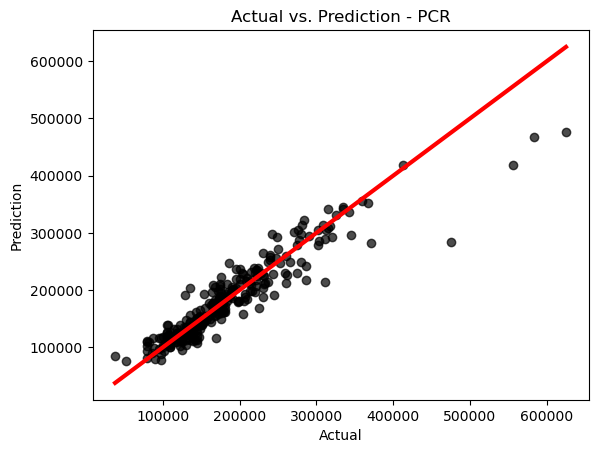

In [138]:
#Actual vs. Prediction
plt.scatter(x = test['SalePrice'], y = y_test_pred_9, c = 'black', alpha = 0.7)
plt.xlabel('Actual')
plt.ylabel('Prediction')
plt.title('Actual vs. Prediction - PCR')

#Add 45 degree line
xp = np.linspace(test['SalePrice'].min() - 0.2, test['SalePrice'].max() + 0.2, 100)
plt.plot(xp, xp, c = 'red', linewidth = 3)
plt.show()

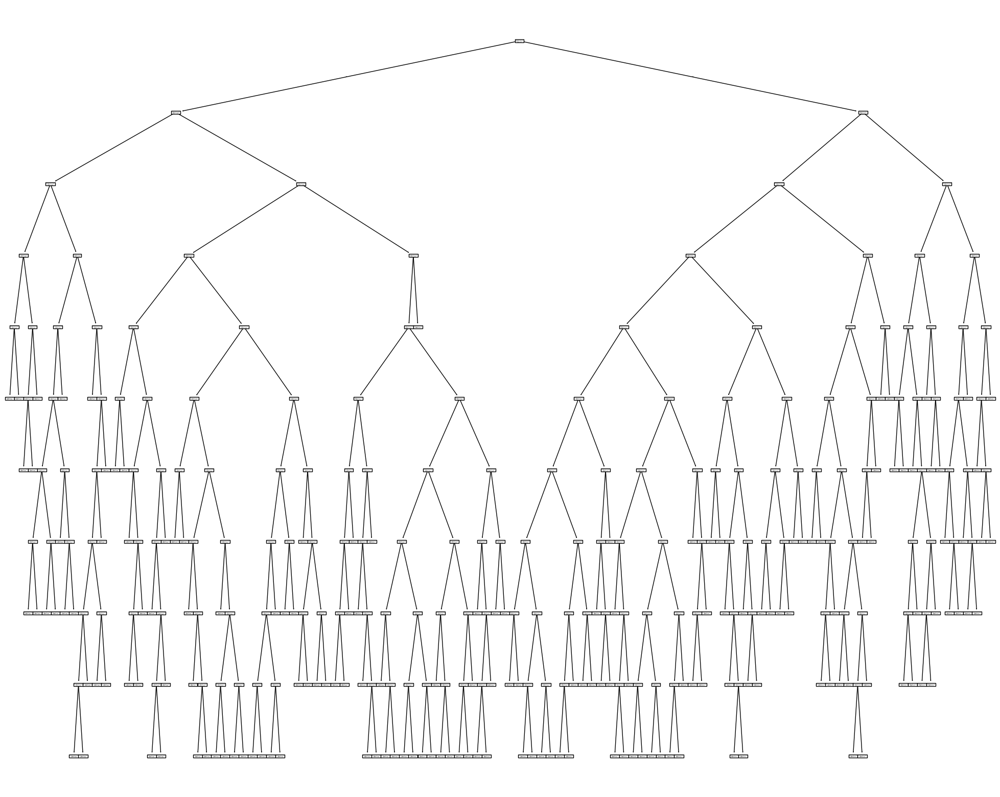

In [139]:
#Decision Tree PCA - model 10
from sklearn.tree import DecisionTreeRegressor
#Post prunning approach
#Create decision tree model
model_10 = DecisionTreeRegressor(criterion = 'squared_error',
                                max_depth = 10,
                                min_samples_leaf = 5,
                                ccp_alpha = 0)
#Fit the decision tree regressor on the train
model_10.fit(X_train_pca[:, : components_number], trans_y_train)
#Plot the Tree
from sklearn.tree import plot_tree
plt.figure(figsize = (25, 20))
plot_tree(model_10, feature_names = range(1, components_number + 1))
plt.show()

In [140]:
#Post prunning
prunning_path = model_10.cost_complexity_pruning_path(X_train_pca[:, : components_number], trans_y_train)
prunning_path

{'ccp_alphas': array([0.00000000e+00, 3.02578503e-05, 5.39421097e-05, 6.86206115e-05,
        8.20778951e-05, 8.60321576e-05, 8.71709662e-05, 8.75255107e-05,
        8.83479730e-05, 9.33240096e-05, 1.01752075e-04, 1.04555883e-04,
        1.13099592e-04, 1.19920388e-04, 1.22941428e-04, 1.25283497e-04,
        1.26921862e-04, 1.32687055e-04, 1.37010295e-04, 1.37892380e-04,
        1.42583122e-04, 1.43931773e-04, 1.47396616e-04, 1.67339756e-04,
        1.69368905e-04, 1.69992661e-04, 1.72625672e-04, 1.72755770e-04,
        1.78835923e-04, 1.82989204e-04, 2.08079713e-04, 2.15580756e-04,
        2.31061053e-04, 2.31618258e-04, 2.36444189e-04, 2.38126909e-04,
        2.53333436e-04, 2.54407903e-04, 2.57054496e-04, 2.57892738e-04,
        2.58502671e-04, 2.61176143e-04, 2.66304283e-04, 2.68925467e-04,
        2.72234056e-04, 2.77170643e-04, 2.98228736e-04, 3.01949359e-04,
        3.12444697e-04, 3.13371350e-04, 3.27790833e-04, 3.33335680e-04,
        3.55040969e-04, 3.55586052e-04, 3.63975436

In [141]:
#Grid
alpha_grid = prunning_path['ccp_alphas']

In [142]:
#K-fold cross validation to choose the best model
from sklearn.model_selection import cross_val_score

cv_errors = np.zeros(shape = len(alpha_grid)) #to save cv results

import time #to measure the processing time
start_time = time.time()
for i in range(len(alpha_grid)):
    tree_reg = DecisionTreeRegressor(criterion = 'squared_error',
                                     max_depth = 10,
                                     min_samples_leaf = 5,
                                     ccp_alpha = alpha_grid[i])
    scores = cross_val_score(estimator = tree_reg,
                             X = X_train_pca[:, : components_number],
                             y = trans_y_train,
                             scoring = 'neg_root_mean_squared_error',
                             cv = 5, n_jobs = -1)
    cv_errors[i] = scores.mean()

end_time = time.time()
print(f'The Processing time is: {end_time - start_time} seconds')

The Processing time is: 15.109980583190918 seconds


In [143]:
#Best alpha
best_alpha = alpha_grid[np.argmax(cv_errors)]
print(best_alpha)

0.002536936155679098


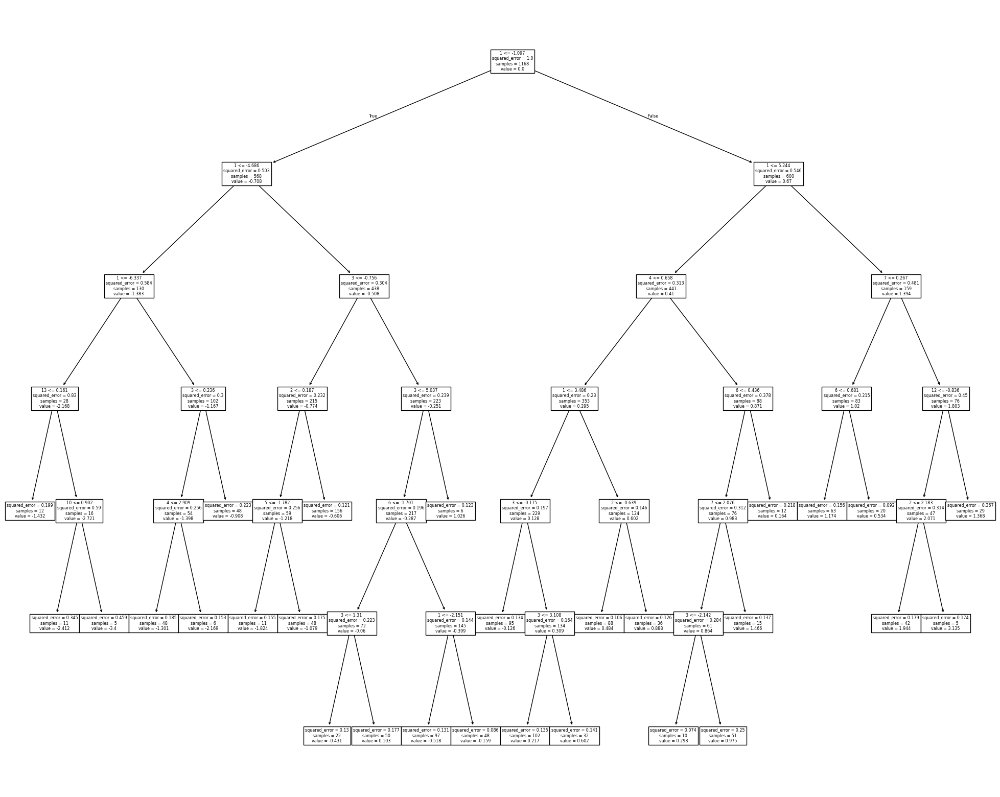

In [144]:
#Best model
#Create decision tree model - model 10
model_10 = DecisionTreeRegressor(criterion = 'squared_error',
                                max_depth = 10,
                                min_samples_leaf = 5,
                                ccp_alpha = best_alpha)
#Fit the decision tree regressor on the train
model_10.fit(X_train_pca[:, : components_number], trans_y_train)
#Plot the Tree
from sklearn.tree import plot_tree
plt.figure(figsize = (25, 20))
plot_tree(model_10, feature_names = range(1, components_number + 1))
plt.show()

In [145]:
#Predict the response in the train
y_train_pred_10 = model_10.predict(X_train_pca[:, : components_number])
#Invesre transformation of predicted values
y_train_pred_10 = pd.Series(boxcox.inverse_transform(y_train_pred_10.reshape(-1, 1)).reshape(-1))

from sklearn.metrics import root_mean_squared_error, mean_absolute_percentage_error, r2_score
#The root mean squared error
print(f'RMSE: {root_mean_squared_error(y_train, y_train_pred_10):.3f}')
#MAPE
print(f'MAPE: {mean_absolute_percentage_error(y_train, y_train_pred_10) * 100:.3f}')
#The coefficient of determination
print(f'R2: {r2_score(y_train, y_train_pred_10):.3f}')

RMSE: 32404.647
MAPE: 12.285
R2: 0.834


In [146]:
#Predict the response in the test - model 10
y_test_pred_10 = model_10.predict(X_test_pca[:, : components_number])
#Inverse transformation of predicted values
y_test_pred_10 = pd.Series(boxcox.inverse_transform(y_test_pred_10.reshape(-1, 1)).reshape(-1),
                          index = test.index)

#Absolute error
abs_err_10 = abs(test['SalePrice'] - y_test_pred_10)

#RMSE, MAPE, MAE, and median, sd, IQR, max, min of absolute errors
from scipy.stats import iqr
models_comp = pd.concat([models_comp,
                         pd.DataFrame({'RMSE': root_mean_squared_error(test['SalePrice'], y_test_pred_10),
                                       'MAPE': mean_absolute_percentage_error(test['SalePrice'], y_test_pred_10) * 100,
                                       'MAE': abs_err_10.mean(),
                                       'Median of AbsErrors': abs_err_10.median(),
                                       'SD of AbsErrors': abs_err_10.std(),
                                       'IQR of AbsErrors': iqr(abs_err_10),
                                       'Min of AbsErrors': abs_err_10.min(),
                                       'Max of AbsErrors': abs_err_10.max()},
                                      index = ['Decision Tree - PCA- Box Cox'])])
models_comp

,RMSE,MAPE,MAE,Median of AbsErrors,SD of AbsErrors,IQR of AbsErrors,Min of AbsErrors,Max of AbsErrors
LM - All Features,29282.684282,10.733316,18775.295556,13880.897344,22509.978822,17147.915622,138.041211,174018.911675
LM - All Feature - Box Cox,28136.099473,8.605331,16088.166086,10847.570106,23122.326250,13575.343382,4.302193,221671.482123
LM - Selected Features - Box Cox,27346.246873,8.443262,15422.462995,9766.297792,22621.169505,12766.030672,0.849437,233519.232540
Ridge Regression - Box Cox,27012.897201,8.575969,15493.280239,9814.570208,22166.135104,14069.853760,35.057189,216166.182050
Lasso Regression - Box Cox,26308.006677,8.446961,15523.976248,9875.288686,21275.986659,15982.451412,20.738700,194871.311604
Decision Tree - Box Cox,37473.075945,12.782693,22903.016364,13808.596093,29710.372411,24190.167063,175.822338,320916.250097
LM - PCA - Box Cox,27859.503672,9.983931,17635.780012,11785.211429,21603.925505,16381.867587,1.776863,190607.830024
Decision Tree - PCA- Box Cox,39287.303392,14.428255,25563.871529,17682.095035,29883.758684,21255.727959,10.365781,228826.644226


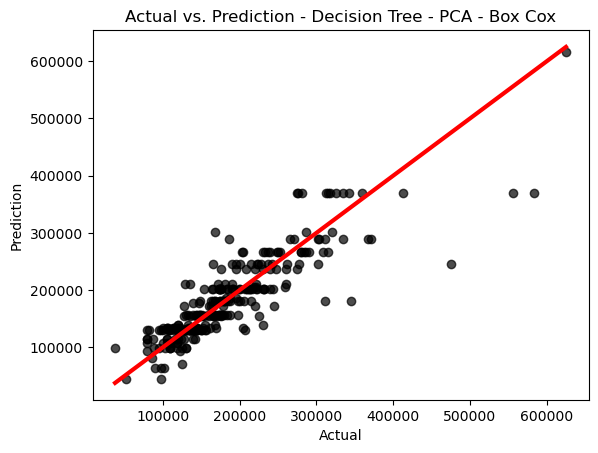

In [147]:
#Actual vs. Prediction
plt.scatter(x = test['SalePrice'], y = y_test_pred_10, c = 'black', alpha = 0.7)
plt.xlabel('Actual')
plt.ylabel('Prediction')
plt.title('Actual vs. Prediction - Decision Tree - PCA - Box Cox')

#Add 45 degree line
xp = np.linspace(test['SalePrice'].min() - 0.2, test['SalePrice'].max() + 0.2, 100)
plt.plot(xp, xp, c = 'red', linewidth = 3)
plt.show()

In [148]:
#Sample Random Forest model PCA (not tuned) - model 11
from sklearn.ensemble import RandomForestRegressor
#Create random forest model
model_11 = RandomForestRegressor(n_estimators = 100,
                                max_features = 4,
                                criterion = 'squared_error',
                                max_depth = 15,
                                min_samples_leaf = 10,
                                ccp_alpha = 0,
                                random_state = 123)
#Fit the random forest regressor on the train
model_11.fit(X_train_pca[:, : components_number], trans_y_train.flatten())

#Predict the response in the train
y_train_pred_11 = model_11.predict(X_train_pca[:, : components_number])
#Inverse transformation of predicted values
y_train_pred_11 = pd.Series(boxcox.inverse_transform(y_train_pred_11.reshape(-1, 1)).reshape(-1))

from sklearn.metrics import root_mean_squared_error, mean_absolute_percentage_error, r2_score
#The root mean squared error
print(f'RMSE: {root_mean_squared_error(y_train, y_train_pred_11):.3f}')
#MAPE
print(f'MAPE: {mean_absolute_percentage_error(y_train, y_train_pred_11) * 100:.3f}')
#The coefficinet of determination
print(f'R2: {r2_score(y_train, y_train_pred_11):.3f}')

In [149]:
#Create hyper-parameters grid
import itertools
n_estimators = [100, 200, 300]
max_features = ['sqrt', 'log2', None] #If None or 1.0, then max_features = n_features
max_depth = [2, 5, 10]
min_samples_leaf = [5, 10, 15]
params_grid = list(itertools.product(n_estimators, max_features, max_depth, min_samples_leaf))
params_grid = pd.DataFrame(data = params_grid,
                           index = range(1, len(params_grid) + 1),
                           columns = ['n_estimators',
                                      'max_features',
                                      'max_depth',
                                      'min_samples_leaf'])
params_grid

In [150]:
#K-fold cross validation to choose the best model
from sklearn.model_selection import cross_val_score

import time #to measure the processing time
start_time = time.time()
cv_errors = np.zeros(shape = len(params_grid)) #to save cv results
for i in range(len(params_grid)):
    rf_reg = RandomForestRegressor(n_estimators = params_grid.iloc[i, 0],
                                   max_features = params_grid.iloc[i, 1],
                                   criterion = 'squared_error',
                                   max_depth = params_grid.iloc[i, 2],
                                   min_samples_leaf = params_grid.iloc[i, 3],
                                   ccp_alpha = 0)
    scores = cross_val_score(estimator = rf_reg,
                             X = X_train_pca[:, : components_number],
                             y = trans_y_train.flatten(),
                             scoring = 'neg_root_mean_squared_error',
                             cv = 5, n_jobs = -1)
    cv_errors[i] = scores.mean()

end_time = time.time()
print(f'The Processing time is: {end_time - start_time} seconds')

In [151]:
#Best model
params_grid.iloc[np.argmax(cv_errors), :]

In [152]:
#Create random forest model - model 11
model_11 = RandomForestRegressor(n_estimators = params_grid.iloc[np.argmax(cv_errors), 0],
                                max_features = params_grid.iloc[np.argmax(cv_errors), 1],
                                criterion = 'squared_error',
                                max_depth = params_grid.iloc[np.argmax(cv_errors), 2],
                                min_samples_leaf = params_grid.iloc[np.argmax(cv_errors), 3],
                                ccp_alpha = 0,
                                random_state = 123)
#Fit the random forest regressor om the train
model_11.fit(X_train_pca[:, : components_number], trans_y_train.flatten())

#Predict the response in the train
y_train_pred_11 = model_11.predict(X_train_pca[:, : components_number])
#Inverse transformation of predicted values
y_train_pred_11 = pd.Series(boxcox.inverse_transform(y_train_pred_11.reshape(-1, 1)).reshape(-1))

from sklearn.metrics import root_mean_squared_error, mean_absolute_percentage_error, r2_score
#The root mean squared error
print(f'RMSE: {root_mean_squared_error(y_train, y_train_pred_11):.3f}')
#MAPE
print(f'MAPE: {mean_absolute_percentage_error(y_train, y_train_pred_11) * 100:.3f}')
#The coefficient of determination
print(f'R2: {r2_score(y_train, y_train_pred_11):.3f}')

In [153]:
#Calculate variable importance
importance = pd.DataFrame({'importance': model_11.feature_importances_ * 100},
                          index = range(1, components_number + 1))
importance.sort_values(by = 'importance', axis = 0, ascending = True, inplace = True)
importance.tail(10)

In [154]:
#Predict the response in the test - model 11
y_test_pred_11 = model_11.predict(X_test_pca[:, : components_number])
#Inverse transformation of predicted values
y_test_pred_11 = pd.Series(boxcox.inverse_transform(y_test_pred_11.reshape(-1, 1)).reshape(-1),
                          index = test.index)

#Absolute error
abs_err_11 = abs(test['SalePrice'] - y_test_pred_11)

#RMSE, MAPE, MAE, and median, sd, IQR, max, min of absolute errors
from scipy.stats import iqr
models_comp = pd.concat([models_comp, 
                         pd.DataFrame({'RMSE': root_mean_squared_error(test['SalePrice'], y_test_pred_11),
                                       'MAPE': mean_absolute_percentage_error(test['SalePrice'], y_test_pred_11) * 100,
                                       'MAE': abs_err_11.mean(),
                                       'Median of AbsErrors': abs_err_11.median(),
                                       'SD of AbsErrors': abs_err_11.std(),
                                       'IQR of AbsErrros': iqr(abs_err_11),
                                       'Min of AbsErrros': abs_err_11.min(),
                                       'Max of AbsErrors': abs_err_11.max()},
                                      index = ['Random Forest - PCA - Box Cox'])])
models_comp

In [155]:
#Actual vs. Prediction
plt.scatter(x = test['SalePrice'], y = y_test_pred_11, c = 'black', alpha = 0.7)
plt.xlabel('Actual')
plt.ylabel('Prediction')
plt.title('Actual vs. Prediction - Random Forest - PCA - Box Cox')

#Add 45 degree line
xp = np.linspace(test['SalePrice'].min() - 0.2, test['SalePrice'].max() + 0.2, 100)
plt.plot(xp, xp, c = 'red', linewidth = 3)
plt.show()

In [156]:
#SGB Regressor PCA (not tuned) - model 12
from sklearn.ensemble import GradientBoostingRegressor
#Create SGB regressor model
model_12 = GradientBoostingRegressor(learning_rate = 0.1, #learning rate
                                    n_estimators = 100, #the total number of trees to fit
                                    subsample = 1.0, #the fraction of samples to be used,
                                                     #if <1, Stochastic GB
                                    max_depth = 1, #the maximum depth of each tree
                                    min_samples_leaf = 20, #the minimum number of observations in leaf nodes of each tree
                                    random_state = 123)
#Fit the SGB regressor on the train
model_12.fit(X_train_pca[:, : components_number], trans_y_train.flatten())

#Predict the response in the train
y_train_pred_12 = model_12.predict(X_train_pca[:, : components_number])
#Inverse transformation of predicted values
y_train_pred_12 = pd.Series(boxcox.inverse_transform(y_train_pred_12.reshape(-1, 1)).reshape(-1))

from sklearn.metrics import root_mean_squared_error, mean_absolute_percentage_error, r2_score
#The root mean squared error
print(f'RMSE: {root_mean_squared_error(y_train, y_train_pred_12):.3f}')
#MAPE
print(f'MAPE: {mean_absolute_percentage_error(y_train, y_train_pred_12) * 100:.3f}')
#The coefficient of determination
print(f'R2: {r2_score(y_train, y_train_pred_12):.3f}')

In [157]:
#Grid
#K-Fold Cross Validation for Choosing Hyper-parameters
#Create Hyper-parameters grid
import itertools
learning_rate = [0.001, 0.01, 0.1]
n_estimators = [100, 150, 200]
subsample = [0.5, 0.8, 1]
max_depth = [1, 2, 5]
min_samples_leaf = [5, 10, 20]
params_grid = list(itertools.product(learning_rate, n_estimators, subsample, max_depth, min_samples_leaf))
params_grid = pd.DataFrame(data = params_grid, index = range(1, len(params_grid) + 1), columns = ['learning_rate',
                                                                                                  'n_estimators',
                                                                                                  'subsample',
                                                                                                  'max_depth', 
                                                                                                  'min_samples_leaf'])
params_grid

In [158]:
#K-fold cross validation to choose the best model
from sklearn.model_selection import cross_val_score

#Save cv results
cv_errors = np.zeros(shape = len(params_grid))

import time #to measure the processing time
start_time = time.time()
for i in range(len(params_grid)):
    gb_reg = GradientBoostingRegressor(learning_rate = params_grid.iloc[i, 0],
                                       n_estimators = params_grid.iloc[i, 1],
                                       subsample = params_grid.iloc[i, 2],
                                       max_depth = params_grid.iloc[i, 3],
                                       min_samples_leaf = params_grid.iloc[i, 4])
    scores = cross_val_score(estimator = gb_reg,
                             X = X_train_pca[:, : components_number],
                             y = trans_y_train.flatten(),
                             scoring = 'neg_root_mean_squared_error',
                             cv = 5, n_jobs = -1)
    cv_errors[i] = scores.mean()

end_time = time.time()
print(f'The Processing time is: {end_time - start_time} seconds')

In [159]:
#Best model
params_grid.iloc[np.argmax(cv_errors)]

In [160]:
#SGB Regressor (tuned) - model 12
from sklearn.ensemble import GradientBoostingRegressor
#Create SGB regressor model
model_12 = GradientBoostingRegressor(learning_rate = params_grid.iloc[np.argmax(cv_errors), 0],
                                    n_estimators = params_grid.iloc[np.argmax(cv_errors), 1],
                                    subsample = params_grid.iloc[np.argmax(cv_errors), 2],
                                    max_depth = params_grid.iloc[np.argmax(cv_errors), 3],
                                    min_samples_leaf = params_grid.iloc[np.argmax(cv_errors), 4],
                                    random_state = 123)

#Fit the SGB regressor on the train
model_12.fit(X_train_pca[:, : components_number], trans_y_train.flatten())

#Predict the response in the train
y_train_pred_12 = model_12.predict(X_train_pca[:, : components_number])
#Inverse transformation of predicted values
y_train_pred_12 = pd.Series(boxcox.inverse_transform(y_train_pred_12.reshape(-1, 1)).reshape(-1))

from sklearn.metrics import root_mean_squared_error, mean_absolute_percentage_error, r2_score
#The root mean squared error
print(f'RMSE: {root_mean_squared_error(y_train, y_train_pred_12):.3f}')
#MAPE
print(f'MAPE: {mean_absolute_percentage_error(y_train, y_train_pred_12) * 100:.3f}')
#The coefficient of determination
print(f'R2: {r2_score(y_train, y_train_pred_12):.3f}')

In [161]:
#Predict the response in the test - model 12
y_test_pred_12 = model_12.predict(X_test_pca[:, : components_number])
#Inverse transformation of predicted values
y_test_pred_12 = pd.Series(boxcox.inverse_transform(y_test_pred_12.reshape(-1, 1)).reshape(-1),
                          index = test.index)

#Absolute error
abs_err_12 = abs(test['SalePrice'] - y_test_pred_12)

#RMSE, MAPE, MAE, and median, sd, IQR, max, min of absolute errors
from scipy.stats import iqr
models_comp = pd.concat([models_comp,
                         pd.DataFrame({'RMSE': root_mean_squared_error(test['SalePrice'], y_test_pred_12),
                                       'MAPE': mean_absolute_percentage_error(test['SalePrice'], y_test_pred_12) * 100,
                                       'MAE': abs_err_12.mean(),
                                       'Median of AbsErrors': abs_err_12.median(),
                                       'SD of AbsErrors': abs_err_12.std(),
                                       'IQR of AbsErrors': iqr(abs_err_12),
                                       'Min of AbsErrors': abs_err_12.min(),
                                       'Max of AbsErrors': abs_err_12.max()},
                                      index = ['SGB Regressor - PCA - Box Cox'])])
models_comp

In [162]:
#Actual vs. Prediction
plt.scatter(x = test['SalePrice'], y = y_test_pred_12, c = 'black', alpha = 0.7)
plt.xlabel('Actual')
plt.ylabel('Prediction')
plt.title('Actual vs. Prediction - Stochastic Gradient Boost')

#Add 45 degree line
xp = np.linspace(test['SalePrice'].min() - 0.2, test['SalePrice'].max() + 0.2, 100)
plt.plot(xp, xp, c = 'red', linewidth = 3)
plt.show()

In [163]:
#Installing tensorflow
#%pip install tensorflow

In [164]:
#Building Artificial Neural Network (ANN) (not tuned) - model 13
#Define the model architecture
from tensorflow import keras
model_13 = keras.Sequential()
#Hidden Layer 1
model_13.add(keras.layers.Dense(4,
                                input_dim = len(X_train.columns),
                                activation = 'sigmoid'))

#Hidden Layer 2
model_13.add(keras.layers.Dense(3,
                                input_dim = 4,
                                activation = 'sigmoid'))

#Output Layer
model_13.add(keras.layers.Dense(1, activation = 'linear'))
model_13.summary()

In [165]:
#Configure the model
model_13.compile(optimizer = 'Adam',
                 loss = 'mean_squared_error',
                 metrics = ['r2_score'])

In [166]:
#Train the model
model_13.fit(X_train_scaled,
             trans_y_train,
             epochs = 20,
             batch_size = 128,
             validation_split = 0.3)

In [167]:
train_loss, mape_loss = model_13.evaluate(X_train_scaled, trans_y_train)
train_loss

In [168]:
#Making a grid for hyper-parameter tuning (1-hidden layer ANN)
import itertools
neuron_count = [5, 10, 20, 40, 80, 160]
activation_func = ['relu', 'sigmoid', 'tanh', 'softplus']
epoch = [10, 20]
batch_size = [64, 128, 256]
params_grid = list(itertools.product(neuron_count, activation_func, epoch, batch_size))
params_grid = pd.DataFrame(data = params_grid,
                           index = range(1, len(params_grid) + 1),
                           columns = ['neuron_count', 'activation_func',
                                      'epoch', 'batch_size'])
params_grid

In [169]:
#Choose the best model

val_losses = np.zeros(shape = len(params_grid)) #to save the validation losses

import time #to measure the processing time
start_time = time.time()
for i in range(len(params_grid)):
    #Define the model architecture
    ann_reg = keras.Sequential()
    ann_reg.add(keras.layers.Dense(params_grid.iloc[i, 0],
                                           input_dim = len(X_train.columns),
                                           activation = params_grid.iloc[i, 1]))
    ann_reg.add(keras.layers.Dense(1,
                                   input_dim = params_grid.iloc[i, 0],
                                   activation = 'linear'))
    #Configure the model
    ann_reg.compile(optimizer = 'Adam',
                    loss = 'mean_squared_error',
                    metrics = ['r2_score'])
    #Train the model
    ann_reg.fit(X_train_scaled,
                trans_y_train,
                epochs = params_grid.iloc[i, 2],
                batch_size = params_grid.iloc[i, 3],
                validation_split = 0.2)
    #Get the model's performance on the train
    train_loss, train_r2_score = ann_reg.evaluate(X_train_scaled, trans_y_train)
    #Add the model's performance into the val_losses
    val_losses[i] = train_loss

end_time = time.time()
print(f'The Processing time is: {end_time - start_time} seconds')

In [170]:
#Best model's hyper-parameters
params_grid.iloc[np.argmin(val_losses), :]

In [171]:
#Train the best ANN w/ 1-hidden layer
#Define the model architecture
model_13 = keras.Sequential()
#Adding one hidden layer
model_13.add(keras.layers.Dense(params_grid.iloc[np.argmin(val_losses), 0],
                             input_dim = len(X_train.columns),
                             activation = params_grid.iloc[np.argmin(val_losses), 1]))
#Adding the output layer
model_13.add(keras.layers.Dense(1,
                                input_dim = params_grid.iloc[np.argmin(val_losses), 0],
                                activation = 'linear'))
#Configure the model
model_13.compile(optimizer = 'Adam',
                 loss = 'mean_squared_error',
                 metrics = ['r2_score'])
#Train the model
model_13.fit(X_train_scaled,
             trans_y_train,
             epochs = params_grid.iloc[np.argmin(val_losses), 2],
             batch_size = params_grid.iloc[np.argmin(val_losses), 3],
             validation_split = 0.2)

In [172]:
#Predict the response in the train
y_train_pred_13 = model_13.predict(X_train_scaled)
#Inverse transformation of predicted values
y_train_pred_13 = pd.Series(boxcox.inverse_transform(y_train_pred_13.reshape(-1, 1)).reshape(-1))

from sklearn.metrics import root_mean_squared_error, mean_absolute_percentage_error, r2_score
#The root mean squared error
print(f'RMSE: {root_mean_squared_error(y_train, y_train_pred_13):.3f}')
#MAPE
print(f'MAPE: {mean_absolute_percentage_error(y_train, y_train_pred_13) * 100:.3f}')
#The coefficient of determiantion
print(f'R2: {r2_score(y_train, y_train_pred_13):.3f}')

In [173]:
#Predict the response in the test - model 13
y_test_pred_13 = model_13.predict(X_test_scaled)
#Inverse transformation of predicted values
y_test_pred_13 = pd.Series(boxcox.inverse_transform(y_test_pred_13.reshape(-1, 1)).reshape(-1),
                           index = test.index)

#Absolute error
abs_err_13 = abs(test['SalePrice'] - y_test_pred_13)

#RMSE, MAPE, MAE, and median, sd, IQR, max, min of absolute errors
from scipy.stats import iqr
models_comp = pd.concat([models_comp,
                         pd.DataFrame({'RMSE': root_mean_squared_error(test['SalePrice'], y_test_pred_13),
                                       'MAPE': mean_absolute_percentage_error(test['SalePrice'], y_test_pred_13) * 100,
                                       'MAE': abs_err_13.mean(),
                                       'Median of AbsErrors': abs_err_13.median(),
                                       'SD of AbsErrors': abs_err_13.std(),
                                       'IQR of AbsErrors': iqr(abs_err_13),
                                       'Min of AbsErrors': abs_err_13.min(),
                                       'Max of AbsErrors': abs_err_13.max()},
                                      index = ['ANN (1-hidden layer) - Box Cox'])])
models_comp

In [174]:
#Actual vs. Prediction
plt.scatter(x = test['SalePrice'], y = y_test_pred_13, c = 'black', alpha = 0.7)
plt.xlabel('Actual')
plt.ylabel('Prediction')
plt.title('Actual vs. Prediction - ANN (1-hidden layer) - Box Cox')

#Add 45 degree line
xp = np.linspace(test['SalePrice'].min() - 0.2, test['SalePrice'].max() + 0.2, 100)
plt.plot(xp, xp, c = 'red', linewidth = 3)
plt.show()

In [175]:
#Making a grid for hyper-parameter tuning (2-hidden-layer ANN) - model 14
import itertools
neuron_count_layer_1 = [5, 10, 20, 40, 80, 160, 320]
neuron_count_layer_2 = [5, 10, 20, 40, 80, 160, 320]
activation_func_layer_2 = ['relu', 'sigmoid', 'tanh', 'softplus']
params_grid = list(itertools.product(neuron_count_layer_1, neuron_count_layer_2, activation_func_layer_2))
params_grid = pd.DataFrame(data = params_grid,
                           index = range(1, len(params_grid) + 1),
                           columns = ['neuron_count_layer_1',
                                      'neuron_count_layer_2',
                                      'activation_func_layer_2'])
params_grid

In [176]:
#Choose the best model

val_losses = np.zeros(shape = len(params_grid)) #to save the validation losses

import time #to measure the processing time
start_time = time.time()
for i in range(len(params_grid)):
    #Define the model architecture
    ann_reg = keras.Sequential()
    ann_reg.add(keras.layers.Dense(params_grid.iloc[i, 0],
                                           input_dim = len(X_train.columns),
                                           activation = 'tanh'))
    ann_reg.add(keras.layers.Dense(params_grid.iloc[i, 1],
                                   input_dim = params_grid.iloc[i, 0],
                                   activation = params_grid.iloc[i, 2]))
    ann_reg.add(keras.layers.Dense(1,
                                   input_dim = params_grid.iloc[i, 1],
                                   activation = 'linear'))
    #Configure the model
    ann_reg.compile(optimizer = 'Adam',
                    loss = 'mean_squared_error',
                    metrics = ['r2_score'])
    #Train the model
    ann_reg.fit(X_train_scaled,
                trans_y_train,
                epochs = 20,
                batch_size = 64,
                validation_split = 0.2)
    #Get the model's performance on the train
    train_loss, train_r2_score = ann_reg.evaluate(X_train_scaled, trans_y_train)
    #Add the model's performance into the val_losses
    val_losses[i] = train_loss

end_time = time.time()
print(f'The Processing time is: {end_time - start_time} seconds')

In [177]:
#Best model's hyper-parameters
params_grid.iloc[np.argmin(val_losses), :]

In [178]:
#Train the best ANN w/ 2-hidden layers
#Define the model architecture
model_14 = keras.Sequential()
#Adding one hidden layer
model_14.add(keras.layers.Dense(params_grid.iloc[np.argmin(val_losses), 0],
                                input_dim = len(X_train.columns),
                                activation = 'tanh'))
#Adding the second hidden layer
model_14.add(keras.layers.Dense(params_grid.iloc[np.argmin(val_losses), 1],
                                input_dim = params_grid.iloc[np.argmin(val_losses), 0],
                                activation = 'tanh'))
#Adding the output layer
model_14.add(keras.layers.Dense(1,
                                input_dim = params_grid.iloc[np.argmin(val_losses), 1],
                                activation = 'linear'))
#Configure the model
model_14.compile(optimizer = 'Adam',
                 loss = 'mean_squared_error',
                 metrics = ['r2_score'])
#Train the model
model_14.fit(X_train_scaled,
             trans_y_train,
             epochs = 20,
             batch_size = 64,
             validation_split = 0.2)

In [179]:
#Predict the response in the train
y_train_pred_14 = model_14.predict(X_train_scaled)
#Inverse transformation of predicted values
y_train_pred_14 = pd.Series(boxcox.inverse_transform(y_train_pred_14.reshape(-1, 1)).reshape(-1))

from sklearn.metrics import root_mean_squared_error, mean_absolute_percentage_error, r2_score
#The root mean squared error
print(f'RMSE: {root_mean_squared_error(y_train, y_train_pred_14):.3f}')
#MAPE
print(f'MAPE: {mean_absolute_percentage_error(y_train, y_train_pred_14) * 100:.3f}')
#The coefficient of determiantion
print(f'R2: {r2_score(y_train, y_train_pred_14):.3f}')

In [180]:
#Predict the response in the test - model 14
y_test_pred_14 = model_14.predict(X_test_scaled)
#Inverse transformation of predicted values
y_test_pred_14 = pd.Series(boxcox.inverse_transform(y_test_pred_14.reshape(-1, 1)).reshape(-1),
                           index = test.index)

#Absolute error
abs_err_14 = abs(test['SalePrice'] - y_test_pred_14)

#RMSE, MAPE, MAE, and median, sd, IQR, max, min of absolute errors
from scipy.stats import iqr
models_comp = pd.concat([models_comp,
                         pd.DataFrame({'RMSE': root_mean_squared_error(test['SalePrice'], y_test_pred_14),
                                       'MAPE': mean_absolute_percentage_error(test['SalePrice'], y_test_pred_14) * 100,
                                       'MAE': abs_err_14.mean(),
                                       'Median of AbsErrors': abs_err_14.median(),
                                       'SD of AbsErrors': abs_err_14.std(),
                                       'IQR of AbsErrors': iqr(abs_err_14),
                                       'Min of AbsErrors': abs_err_14.min(),
                                       'Max of AbsErrors': abs_err_14.max()},
                                      index = ['ANN (2-hidden-layer) - Box Cox'])])
models_comp

In [181]:
#The best model is LM - Selected Features - Box Cox
#Create dummy variables for catgorical variables
dummy_vars = pd.get_dummies(train_df_mean_sub[categorical_features])
dummy_vars.info(verbose = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 199 columns):
 #    Column                 Dtype
---   ------                 -----
 0    MSSubClass_20          bool 
 1    MSSubClass_30          bool 
 2    MSSubClass_50          bool 
 3    MSSubClass_60          bool 
 4    MSSubClass_70          bool 
 5    MSSubClass_80          bool 
 6    MSSubClass_90          bool 
 7    MSSubClass_120         bool 
 8    MSSubClass_160         bool 
 9    MSSubClass_190         bool 
 10   MSSubClass_other       bool 
 11   MSZoning_FV            bool 
 12   MSZoning_RL            bool 
 13   MSZoning_RM            bool 
 14   MSZoning_other         bool 
 15   Street_Grvl            bool 
 16   Street_Pave            bool 
 17   Alley_Grvl             bool 
 18   Alley_Pave             bool 
 19   LotShape_IR1           bool 
 20   LotShape_IR2           bool 
 21   LotShape_IR3           bool 
 22   LotShape_Reg           bool 
 23   LandContour

In [182]:
dummy_vars.head()

,MSSubClass_20,MSSubClass_30,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_80,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_190,MSSubClass_other,MSZoning_FV,MSZoning_RL,MSZoning_RM,MSZoning_other,Street_Grvl,Street_Pave,Alley_Grvl,Alley_Pave,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_AllPub,Utilities_NoSeWa,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Gtl,LandSlope_Mod,LandSlope_Sev,Neighborhood_BrkSide,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_Sawyer,...,CentralAir_N,CentralAir_Y,Electrical_FuseA,Electrical_SBrkr,Electrical_other,KitchenQual_Ex,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Min1,Functional_Min2,Functional_Typ,Functional_other,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_TA,FireplaceQu_other,GarageType_Attchd,GarageType_BuiltIn,GarageType_Detchd,GarageType_other,GarageFinish_Fin,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_TA,GarageQual_other,GarageCond_Fa,GarageCond_TA,GarageCond_other,PavedDrive_N,PavedDrive_P,PavedDrive_Y,PoolQC_Ex,PoolQC_Fa,PoolQC_Gd,Fence_GdPrv,Fence_GdWo,Fence_MnPrv,Fence_MnWw,MiscFeature_Shed,MiscFeature_other,SaleType_COD,SaleType_New,SaleType_WD,SaleType_other,SaleCondition_Abnorml,SaleCondition_Normal,SaleCondition_Partial,SaleCondition_other
0,False,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,True,False,False,False,False,False,True,False,False,False,True,True,False,False,False,False,False,True,True,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,...,False,True,False,True,False,False,False,True,False,False,False,True,False,False,False,False,False,True,False,False,False,False,True,False,False,True,False,False,True,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,True,False,False
1,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,True,False,False,False,False,False,True,False,False,False,True,True,False,False,False,True,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,...,False,True,False,True,False,False,False,False,True,False,False,True,False,False,False,True,False,True,False,False,False,False,True,False,False,True,False,False,True,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,True,False,False
2,False,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,True,False,False,True,False,False,False,False,False,False,True,True,False,False,False,False,False,True,True,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,...,False,True,False,True,False,False,False,True,False,False,False,True,False,False,False,True,False,True,False,False,False,False,True,False,False,True,False,False,True,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,True,False,False
3,False,False,False,False,True,False,False,False,False,False,False,False,True,False,False,False,True,False,False,True,False,False,False,False,False,False,True,True,False,True,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,...,False,True,False,True,False,False,False,True,False,False,False,True,False,False,True,False,False,False,False,True,False,False,False,True,False,True,False,False,True,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,True,False,False,False
4,False,False,False,True,False,False,False,False,False,False,False,False,True,False,False,F

In [183]:
#Define base level for each categorical variable
dummy_vars.drop(columns = ['MSSubClass_20', 'MSZoning_FV', 'Street_Grvl',
                           'Alley_Grvl', 'LotShape_IR1', 'LandContour_Bnk',
                           'Utilities_AllPub', 'LotConfig_Corner', 'LandSlope_Gtl',
                           'Neighborhood_BrkSide', 'Condition1_Artery', 'Condition2_Norm',
                           'BldgType_1Fam', 'HouseStyle_1.5Fin', 'OverallQual_4',
                           'OverallCond_4', 'RoofStyle_Gable', 'RoofMatl_CompShg',
                           'Exterior1st_BrkFace', 'Exterior2nd_CmentBd', 'MasVnrType_BrkCmn',
                           'ExterQual_Ex', 'ExterCond_Gd', 'Foundation_BrkTil',
                           'BsmtQual_Ex', 'BsmtCond_Fa', 'BsmtExposure_Av',
                           'BsmtFinType1_ALQ', 'BsmtFinType2_BLQ', 'Heating_GasA',
                           'HeatingQC_Ex', 'CentralAir_N', 'Electrical_FuseA',
                           'KitchenQual_Ex', 'Functional_Min1', 'FireplaceQu_Fa',
                           'GarageType_Attchd', 'GarageFinish_Fin', 'GarageQual_Fa',
                           'GarageCond_Fa', 'PavedDrive_N', 'PoolQC_Ex',
                           'Fence_GdPrv', 'MiscFeature_Shed', 'SaleType_COD',
                           'SaleCondition_Abnorml', 'BsmtFinType2_other', 'PoolQC_Fa',
                           'Utilities_NoSeWa'], inplace = True)
dummy_vars.info(verbose = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 150 columns):
 #    Column                 Dtype
---   ------                 -----
 0    MSSubClass_30          bool 
 1    MSSubClass_50          bool 
 2    MSSubClass_60          bool 
 3    MSSubClass_70          bool 
 4    MSSubClass_80          bool 
 5    MSSubClass_90          bool 
 6    MSSubClass_120         bool 
 7    MSSubClass_160         bool 
 8    MSSubClass_190         bool 
 9    MSSubClass_other       bool 
 10   MSZoning_RL            bool 
 11   MSZoning_RM            bool 
 12   MSZoning_other         bool 
 13   Street_Pave            bool 
 14   Alley_Pave             bool 
 15   LotShape_IR2           bool 
 16   LotShape_IR3           bool 
 17   LotShape_Reg           bool 
 18   LandContour_HLS        bool 
 19   LandContour_Low        bool 
 20   LandContour_Lvl        bool 
 21   LotConfig_CulDSac      bool 
 22   LotConfig_FR2          bool 
 23   LotConfig_F

In [184]:
#Define feature matrix
numeric_features_copy = numeric_features.copy()
numeric_features_copy.pop()
X_ = train_df_mean_sub[numeric_features_copy]
X_train = pd.concat([X_, dummy_vars], axis = 1)
X_train.head()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSSubClass_30,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_80,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_190,MSSubClass_other,MSZoning_RL,MSZoning_RM,MSZoning_other,Street_Pave,Alley_Pave,LotShape_IR2,LotShape_IR3,...,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_other,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_SBrkr,Electrical_other,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Min2,Functional_Typ,Functional_other,FireplaceQu_Gd,FireplaceQu_TA,FireplaceQu_other,GarageType_BuiltIn,GarageType_Detchd,GarageType_other,GarageFinish_RFn,GarageFinish_Unf,GarageQual_TA,GarageQual_other,GarageCond_TA,GarageCond_other,PavedDrive_P,PavedDrive_Y,PoolQC_Gd,Fence_GdWo,Fence_MnPrv,Fence_MnWw,MiscFeature_other,SaleType_New,SaleType_WD,SaleType_other,SaleCondition_Normal,SaleCondition_Partial,SaleCondition_other
0,65.0,8450,2003,2003,196.0,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2003.0,2,548,0,61,0,0,0,0,0,2,2008,False,False,True,False,False,False,False,False,False,False,True,False,False,True,False,False,False,...,False,False,True,False,True,False,False,False,False,False,True,False,False,False,False,False,True,True,False,False,True,False,False,True,False,False,False,False,False,False,False,True,False,True,False,True,False,False,True,False,False,False,False,False,False,True,False,True,False,False
1,80.0,9600,1976,1976,0.0,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,1976.0,2,460,298,0,0,0,0,0,0,5,2007,False,False,False,False,False,False,False,False,False,False,True,False,False,True,False,False,False,...,True,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,True,True,False,False,False,True,False,True,False,False,True,False,False,False,False,True,False,True,False,True,False,False,True,False,False,False,False,False,False,True,False,True,False,False
2,68.0,11250,2001,2002,162.0,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2001.0,2,608,0,42,0,0,0,0,0,9,2008,False,False,True,False,False,False,False,False,False,False,True,False,False,True,False,False,False,...,False,True,False,False,True,False,False,False,False,False,True,False,False,False,False,False,True,True,False,False,True,False,False,True,False,False,True,False,False,False,False,True,False,True,False,True,False,False,True,False,False,False,False,False,False,True,False,True,False,False
3,60.0,9550,1915,1970,0.0,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,1998.0,3,642,0,35,272,0,0,0,0,2,2006,False,False,False,True,False,False,False,False,False,False,True,False,False,True,False,False,False,...,False,False,True,False,False,False,False,False,False,False,True,False,False,True,False,False,True,True,False,False,True,False,False,True,False,True,False,False,False,True,False,False,True,True,False,True,False,False,True,False,False,False,False,False,False,True,False,False,False,False
4,84.0,14260,2000,2000,350.0,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,2000.0,3,836,192,84,0,0,0,0,0,12,2008,False,False,True,False,False,False,False,False,False,False,True,False,False,True,False,False,False,...,False,False,False,False,True,False,False,False,False,False,True,False,False,False,False,False,True,True,False,False,True,False,False,True,False,False,True,False,False,False,False,True,False,True,False,True,False,False,True,False,False,False,False,False,False,True,False,True,False,False


In [185]:
#Define response matrix
y_train = train_df_mean_sub['SalePrice']
print(y_train)

0       208500
1       181500
2       223500
3       140000
4       250000
5       143000
6       307000
7       200000
8       129900
9       118000
10      129500
11      345000
12      144000
13      279500
14      157000
15      132000
16      149000
17       90000
18      159000
19      139000
20      325300
21      139400
22      230000
23      129900
24      154000
25      256300
26      134800
27      306000
28      207500
29       68500
30       40000
31      149350
32      179900
33      165500
34      277500
35      309000
36      145000
37      153000
38      109000
39       82000
40      160000
41      170000
42      144000
43      130250
44      141000
45      319900
46      239686
47      249700
48      113000
49      127000
50      177000
51      114500
52      110000
53      385000
54      130000
55      180500
56      172500
57      196500
58      438780
59      124900
60      158000
61      101000
62      202500
63      140000
64      219500
65      317000
66      18

In [186]:
#Box-Cox transformation
from sklearn.preprocessing import PowerTransformer
boxcox = PowerTransformer(method = 'box-cox')
boxcox.fit(y_train.values.reshape(-1, 1))
print(boxcox.lambdas_)

[-0.07692398]


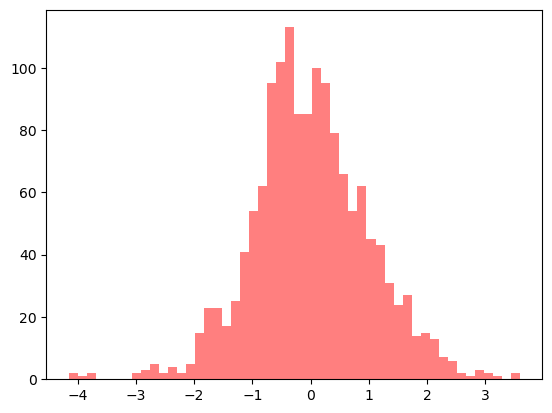

In [187]:
trans_y_train = boxcox.fit_transform(y_train.values.reshape(-1, 1))
plt.hist(trans_y_train, color = 'red', alpha = 0.5, bins = 50)
plt.show()

In [188]:
#Scale data
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)

In [189]:
#Feature selection
from sklearn.feature_selection import RFECV
rfe = RFECV(LinearRegression(), cv = 10, scoring = 'neg_root_mean_squared_error')
rfe.fit(X_train_scaled, trans_y_train)

#Selected features indices
selected_features_ind = np.where(rfe.support_)
print(selected_features_ind)

(array([  1,   2,   3,   8,   9,  10,  12,  13,  15,  16,  18,  19,  22,
        24,  28,  29,  33,  34,  36,  39,  41,  43,  44,  45,  51,  53,
        54,  61,  68,  69,  73,  75,  77,  80,  82,  83,  84,  85,  86,
        87,  88,  89,  90,  91,  92,  93,  95,  96,  97,  98, 103, 104,
       105, 106, 107, 108, 109, 119, 120, 121, 130, 132, 133, 140, 149,
       152, 153, 154, 156, 157, 166, 167, 172, 177, 180]),)


In [190]:
#Train the best model
from sklearn.linear_model import LinearRegression
#Create linear regression model
best_model = LinearRegression()
#Fit the linear regressor on the train
best_model.fit(X_train_scaled[:, selected_features_ind[0]], trans_y_train)
#Linear regression coefficients
print(best_model.coef_)
print(best_model.intercept_)

[[ 0.03820518  0.11075456  0.06508745  0.03494821  0.09734264  0.10391287
   0.1991276   0.05886556  0.06090385  0.04185875 -0.03776874  0.02892094
   0.10749352  0.04103018  0.04032236  0.03118428 -0.03887319  0.06882905
   0.0405232   0.04577387 -0.04014592 -0.04641978 -0.06776969 -0.0614061
   0.03160089  0.03830262  0.03732708  0.07410197  0.03643036  0.06985075
   0.03991128  0.04917366  0.04175915  0.06064828 -0.08238193 -0.10410152
   0.14114744  0.04749375  0.03625046  0.05768881  0.05396421  0.07107055
   0.12677329  0.15578181  0.16751378  0.10925465  0.053126    0.07324169
   0.08722488  0.04691899 -0.04463762 -0.07599161 -0.05282419 -0.04134351
  -0.07141442 -0.06996014 -0.0583511  -0.03465618 -0.07252937 -0.12231581
   0.04185726  0.06034036  0.05224906 -0.04843748  0.06880744 -0.0318757
  -0.09984075 -0.12172692  0.03294482 -0.0338519   0.03254906  0.0458683
  -0.0718336   0.0670905   0.0726047 ]]
[6.47468043e-15]


In [191]:
#Predict the response in the train
y_train_pred_best = best_model.predict(X_train_scaled[:, selected_features_ind[0]])
#Inverse transformation of predicted values
y_train_pred_best = pd.Series(boxcox.inverse_transform(y_train_pred_best.reshape(-1, 1)).reshape(-1))

from sklearn.metrics import root_mean_squared_error, mean_absolute_percentage_error, r2_score
#The root mean squared error
print(f'RMSE: {root_mean_squared_error(y_train, y_train_pred_best):.3f}')
#MAPE
print(f'MAPE: {mean_absolute_percentage_error(y_train, y_train_pred_best) * 100:.3f}')
#The coefficient of determination
print(f'R2: {r2_score(y_train, y_train_pred_best):.3f}')

RMSE: 27127.004
MAPE: 8.588
R2: 0.883


In [192]:
#Some categorical features have wrong data types. Let's fix them.
test_df_mean_sub[['MSSubClass',
                  'OverallQual',
                  'OverallCond']] = test_df_mean_sub[['MSSubClass',
                                                      'OverallQual',
                                                      'OverallCond']].astype('object')
test_df_mean_sub[['MSSubClass', 'OverallQual', 'OverallCond']].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   MSSubClass   1459 non-null   object
 1   OverallQual  1459 non-null   object
 2   OverallCond  1459 non-null   object
dtypes: object(3)
memory usage: 34.3+ KB


In [193]:
#Some categories have less than 30 values. Let's fix them.
for cat_feat in categorical_features:
    if cat_feat == 'PoolQC':
        continue
    else:
        start_index = -np.sum(test_df_mean_sub[cat_feat].value_counts() < 30)

        if start_index == 0 or start_index == -1:
            continue
        else:
            test_df_mean_sub.loc[test_df_mean_sub[cat_feat].isin(
                test_df_mean_sub[cat_feat].value_counts()[start_index:].index
            ), cat_feat] = 'other'
        
#Check that our work is done or not.
for feature in categorical_features:
    print(test_df_mean_sub[feature].value_counts())
    print('--' * 20)

MSSubClass
20       543
60       276
50       143
120       95
30        70
70        68
160       65
80        60
90        57
other     51
190       31
Name: count, dtype: int64
----------------------------------------
MSZoning
RL       1114
RM        242
FV         74
other      25
Name: count, dtype: int64
----------------------------------------
Street
Pave    1453
Grvl       6
Name: count, dtype: int64
----------------------------------------
Alley
Grvl    70
Pave    37
Name: count, dtype: int64
----------------------------------------
LotShape
Reg    934
IR1    484
IR2     35
IR3      6
Name: count, dtype: int64
----------------------------------------
LandContour
Lvl    1311
HLS      70
Bnk      54
Low      24
Name: count, dtype: int64
----------------------------------------
Utilities
AllPub    1457
Name: count, dtype: int64
----------------------------------------
LotConfig
Inside     1081
Corner      248
CulDSac      82
FR2          38
FR3          10
Name: count, dtype: int

In [194]:
#Create dummy variables for categorical variables in the test
dummy_vars = pd.get_dummies(test_df_mean_sub[categorical_features])
dummy_vars.info(verbose = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Data columns (total 200 columns):
 #    Column                 Dtype
---   ------                 -----
 0    MSSubClass_20          bool 
 1    MSSubClass_30          bool 
 2    MSSubClass_50          bool 
 3    MSSubClass_60          bool 
 4    MSSubClass_70          bool 
 5    MSSubClass_80          bool 
 6    MSSubClass_90          bool 
 7    MSSubClass_120         bool 
 8    MSSubClass_160         bool 
 9    MSSubClass_190         bool 
 10   MSSubClass_other       bool 
 11   MSZoning_FV            bool 
 12   MSZoning_RL            bool 
 13   MSZoning_RM            bool 
 14   MSZoning_other         bool 
 15   Street_Grvl            bool 
 16   Street_Pave            bool 
 17   Alley_Grvl             bool 
 18   Alley_Pave             bool 
 19   LotShape_IR1           bool 
 20   LotShape_IR2           bool 
 21   LotShape_IR3           bool 
 22   LotShape_Reg           bool 
 23   LandContour

In [195]:
#Define base level for each categorical variable
dummy_vars.drop(columns = ['MSSubClass_20', 'MSZoning_FV', 'Street_Grvl',
                           'Alley_Grvl', 'LotShape_IR1', 'LandContour_Bnk',
                           'Utilities_AllPub', 'LotConfig_Corner', 'LandSlope_Gtl',
                           'Neighborhood_BrkSide', 'Condition1_Artery', 'Condition2_Norm',
                           'BldgType_1Fam', 'HouseStyle_1.5Fin', 'OverallQual_4',
                           'OverallCond_4', 'RoofStyle_Gable', 'RoofMatl_CompShg',
                           'Exterior1st_BrkFace', 'Exterior2nd_CmentBd', 'MasVnrType_BrkCmn',
                           'ExterQual_Ex', 'ExterCond_Gd', 'Foundation_BrkTil',
                           'BsmtQual_Ex', 'BsmtCond_Fa', 'BsmtExposure_Av',
                           'BsmtFinType1_ALQ', 'BsmtFinType2_BLQ', 'Heating_GasA',
                           'HeatingQC_Ex', 'CentralAir_N', 'Electrical_FuseA',
                           'KitchenQual_Ex', 'Functional_Min1', 'FireplaceQu_Fa',
                           'GarageType_Attchd', 'GarageFinish_Fin', 'GarageQual_Fa',
                           'GarageCond_Fa', 'PavedDrive_N', 'PoolQC_Ex',
                           'Fence_GdPrv', 'MiscFeature_Shed', 'SaleType_COD',
                           'SaleCondition_Abnorml', 'BsmtFinType2_ALQ', 'BsmtFinType2_GLQ',
                           'ExterCond_Fa', 'Exterior1st_WdShing'], inplace = True)
dummy_vars.info(verbose = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Data columns (total 150 columns):
 #    Column                 Dtype
---   ------                 -----
 0    MSSubClass_30          bool 
 1    MSSubClass_50          bool 
 2    MSSubClass_60          bool 
 3    MSSubClass_70          bool 
 4    MSSubClass_80          bool 
 5    MSSubClass_90          bool 
 6    MSSubClass_120         bool 
 7    MSSubClass_160         bool 
 8    MSSubClass_190         bool 
 9    MSSubClass_other       bool 
 10   MSZoning_RL            bool 
 11   MSZoning_RM            bool 
 12   MSZoning_other         bool 
 13   Street_Pave            bool 
 14   Alley_Pave             bool 
 15   LotShape_IR2           bool 
 16   LotShape_IR3           bool 
 17   LotShape_Reg           bool 
 18   LandContour_HLS        bool 
 19   LandContour_Low        bool 
 20   LandContour_Lvl        bool 
 21   LotConfig_CulDSac      bool 
 22   LotConfig_FR2          bool 
 23   LotConfig_F

In [196]:
#Define feature matrix
numeric_features_copy = numeric_features.copy()
numeric_features_copy.pop()
X_ = test_df_mean_sub[numeric_features_copy]
X_test = pd.concat([X_, dummy_vars], axis = 1)

In [197]:
#Scale data
X_test_scaled = scaler.transform(X_test)

#Predict the response in the test - the best model
y_test_pred_best = best_model.predict(X_test_scaled[:, selected_features_ind[0]])
#Inverse transformation of predicted values
y_test_pred_best = pd.Series(boxcox.inverse_transform(y_test_pred_best.reshape(-1, 1)).reshape(-1),
                             index = test_df_mean_sub.index)

#THE RESULTS
y_test_pred_best

0       105714.399643
1       155473.828505
2       170087.742969
3       191604.089036
4       193014.138518
5       164790.738335
6       187884.987262
7       159673.523652
8       193891.512098
9       125521.051054
10      159822.286000
11      104198.047531
12       98963.579221
13      145080.377959
14      119208.182739
15      389663.363711
16      258855.853761
17      304766.581514
18      302574.647791
19      575363.982221
20      351013.445083
21      216735.909482
22      178370.601842
23      178526.334133
24      205155.588937
25      193856.350213
26      335993.455551
27      241082.699723
28      200892.321746
29      238743.045024
30      192564.701643
31       74415.323099
32      197116.628985
33      295489.709611
34      288871.241627
35      232340.912826
36      173507.361557
37      160585.897749
38      161534.415555
39      157571.087356
40      175582.336254
41      154802.587863
42      244010.754462
43      262941.531802
44      239553.755645
45      19

In [198]:
for res in y_test_pred_best:
    print(res)

105714.39964291456
155473.8285047847
170087.74296893048
191604.08903628885
193014.13851796178
164790.73833534736
187884.98726217914
159673.5236518204
193891.51209767093
125521.0510539949
159822.28599979496
104198.0475314526
98963.57922099788
145080.37795867247
119208.18273911357
389663.3637113295
258855.85376067334
304766.5815144151
302574.64779066155
575363.9822211564
351013.44508257596
216735.90948150808
178370.60184226296
178526.33413256294
205155.58893681297
193856.3502130901
335993.4555514502
241082.69972295957
200892.3217459484
238743.04502375692
192564.70164284616
74415.3230989495
197116.628985399
295489.7096108189
288871.24162679433
232340.91282643235
173507.3615570865
160585.897748939
161534.41555498075
157571.08735575646
175582.33625442872
154802.5878628377
244010.75446154614
262941.53180157853
239553.75564530544
193226.41143529717
241772.94837152565
192823.76959510907
165829.11025139157
148889.25879578313
139746.2145468778
178437.5311010992
148192.00049813447
145560.20832483